In [1]:
import jax
import jax.nn as jnn
import jax.numpy as jnp
import numpy as np

import equinox as eqx
import diffrax
import optax
from functools import partial

In [2]:
import os
os.chdir("..")
from policy.policy_training import DPCTrainer
from exciting_environments.pmsm.pmsm_env import PMSM, step_eps
import jax_dataclasses as jdc
from models.models import MLP_lin
from policy.networks import MLP#,MLP2
import matplotlib.pyplot as plt

2024-12-10 18:16:50.865877: W external/xla/xla/service/gpu/nvptx_compiler.cc:760] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.6.77). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


In [3]:
gpus = jax.devices()
jax.config.update("jax_default_device", gpus[0])
jax.config.update("jax_enable_x64", True)

In [4]:
import matplotlib.pyplot as plt
from matplotlib import cm
def valid_points(Z,D,Q):
    def cond(point):
        return (point[0]**2+point[1]**2-250**2 <= 0).astype(int)
    z_flat=Z.flatten()
    points=jnp.array([D.flatten(),Q.flatten()]).T
    val_points=jax.vmap(cond,in_axes=0)(points)
    z_flat_val=z_flat*val_points
    return z_flat_val.reshape(D.shape)

def eval_psi(expert_model):
    fig = plt.figure(figsize=(12,8))
    xx = np.linspace(-250, 0, 26)
    yy = np.linspace(-250, 250, 51)
    D, Q = np.meshgrid(xx, yy, indexing='ij')
    learned_psi={"Psi_d":expert_model.psi_d_mlp,"Psi_q":expert_model.psi_q_mlp}

    for  i,name in  zip(range(2),["Psi_d","Psi_q"]):
        
        interp=expert_model.motor_env.LUT_interpolators[name]
        Z = interp((D,Q))
        
        Z=Z*1000
        Z=valid_points(Z,D,Q)
        ax = fig.add_subplot(2, 3, 3*i +1, projection='3d')
        norm = plt.Normalize(Z.min(), Z.max())
        colors = cm.viridis(norm(Z))
        rcount, ccount, _ = colors.shape
        surf = ax.plot_surface(D,Q, Z, rcount=rcount, ccount=ccount,
                        facecolors=colors, shade=False)
        surf.set_facecolor((0,0,0,0))
        ax.azim=225
        ax.set_xlabel("i_d in A")
        ax.set_ylabel("i_q in A")
        ax.set_title(name+' in mH - LUT')

        mlp=learned_psi[name]
        z_flatt=jax.vmap(mlp)(jnp.array([D.flatten(),Q.flatten()]).T/expert_model.motor_env.env_properties.physical_constraints.i_d) #
        Z_d=z_flatt.reshape(D.shape)*1000
        
        Z_d=valid_points(Z_d,D,Q)

        ax = fig.add_subplot(2, 3, 3*i +2, projection='3d')
        norm = plt.Normalize(Z_d.min(), Z_d.max())
        colors = cm.viridis(norm(Z_d))
        rcount, ccount, _ = colors.shape
        surf = ax.plot_surface(D, Q, Z_d, rcount=rcount, ccount=ccount,
                        facecolors=colors, shade=False)
        surf.set_facecolor((0,0,0,0))
        ax.azim=225
        ax.set_xlabel("i_d in A")
        ax.set_ylabel("i_q in A")
        ax.set_title(name+' in mH - learned MLP')

        Z_difference=jnp.abs(Z - Z_d) #np.abs
        ax = fig.add_subplot(2, 3, 3*i +3, projection='3d')
        norm = plt.Normalize(Z_difference.min(), Z_difference.max())
        colors = cm.viridis(norm(Z_difference))
        rcount, ccount, _ = colors.shape
        surf = ax.plot_surface(D, Q, Z_difference, rcount=rcount, ccount=ccount,
                        facecolors=colors, shade=False)
        surf.set_facecolor((0,0,0,0))
        ax.azim=225
        ax.set_xlabel("i_d in A")
        ax.set_ylabel("i_q in A")
        ax.set_title('abs. error in mH')
        ax.ticklabel_format(style='plain')

    fig.show()

def eval_psi_and_L(expert_model):
    fig = plt.figure(figsize=(12,20))
    xx = np.linspace(-250, 0, 26)
    yy = np.linspace(-250, 250, 51)
    D, Q = np.meshgrid(xx, yy, indexing='ij')
    learned_psi={"Psi_d":expert_model.psi_d_mlp,"Psi_q":expert_model.psi_q_mlp,
                 "L_dd":expert_model.L_dd_mlp,"L_dq":expert_model.L_dq_mlp,"L_qd":expert_model.L_qd_mlp,"L_qq":expert_model.L_qq_mlp}

    for  i,name in  zip(range(6),["Psi_d","Psi_q","L_dd","L_dq","L_qd","L_qq"]):
        
        interp=expert_model.motor_env.LUT_interpolators[name]
        Z = interp((D,Q))
        
        Z=Z*1000
        Z=valid_points(Z,D,Q)
        ax = fig.add_subplot(6, 3, 3*i +1, projection='3d')
        norm = plt.Normalize(Z.min(), Z.max())
        colors = cm.viridis(norm(Z))
        rcount, ccount, _ = colors.shape
        surf = ax.plot_surface(D,Q, Z, rcount=rcount, ccount=ccount,
                        facecolors=colors, shade=False)
        surf.set_facecolor((0,0,0,0))
        ax.azim=225
        ax.set_xlabel("i_d in A")
        ax.set_ylabel("i_q in A")
        ax.set_title(name+' in mH - LUT')

        mlp=learned_psi[name]
        z_flatt=jax.vmap(mlp)(jnp.array([D.flatten(),Q.flatten()]).T/expert_model.motor_env.env_properties.physical_constraints.i_d)#
        Z_d=z_flatt.reshape(D.shape)*1000
        
        Z_d=valid_points(Z_d,D,Q)

        ax = fig.add_subplot(6, 3, 3*i +2, projection='3d')
        norm = plt.Normalize(Z_d.min(), Z_d.max())
        colors = cm.viridis(norm(Z_d))
        rcount, ccount, _ = colors.shape
        surf = ax.plot_surface(D, Q, Z_d, rcount=rcount, ccount=ccount,
                        facecolors=colors, shade=False)
        surf.set_facecolor((0,0,0,0))
        ax.azim=225
        ax.set_xlabel("i_d in A")
        ax.set_ylabel("i_q in A")
        ax.set_title(name+' in mH - learned MLP')

        Z_difference=jnp.abs(Z - Z_d) #np.abs
        ax = fig.add_subplot(6, 3, 3*i +3, projection='3d')
        norm = plt.Normalize(Z_difference.min(), Z_difference.max())
        colors = cm.viridis(norm(Z_difference))
        rcount, ccount, _ = colors.shape
        surf = ax.plot_surface(D, Q, Z_difference, rcount=rcount, ccount=ccount,
                        facecolors=colors, shade=False)
        surf.set_facecolor((0,0,0,0))
        ax.azim=225
        ax.set_xlabel("i_d in A")
        ax.set_ylabel("i_q in A")
        ax.set_title('abs. error in mH')
        ax.ticklabel_format(style='plain')

    fig.show()

def eval_L(expert_model):
    fig = plt.figure(figsize=(12,20))
    xx = np.linspace(-250, 0, 26)
    yy = np.linspace(-250, 250, 51)
    D, Q = np.meshgrid(xx, yy, indexing='ij')

    exp_values_inv=jax.vmap(expert_model.L_inv_mlp)(jnp.array([D.flatten(),Q.flatten()]).T/expert_model.motor_env.env_properties.physical_constraints.i_d)
    def get_L_values(L_inv):
        mat=L_inv.reshape(2, 2)
        mat_inv=jnp.linalg.inv(mat)
        return jnp.array([mat_inv[0,0],mat_inv[0,1],mat_inv[1,0],mat_inv[1,1]])
    exp_values=jax.vmap(get_L_values)(exp_values_inv)

    for  i,name in  zip(range(4),["L_dd","L_dq","L_qd","L_qq"]):
        
        interp=expert_model.motor_env.LUT_interpolators[name]
        Z = interp((D,Q))
        
        Z=Z*1000
        Z=valid_points(Z,D,Q)
        ax = fig.add_subplot(6, 3, 3*i +1, projection='3d')
        norm = plt.Normalize(Z.min(), Z.max())
        colors = cm.viridis(norm(Z))
        rcount, ccount, _ = colors.shape
        surf = ax.plot_surface(D,Q, Z, rcount=rcount, ccount=ccount,
                        facecolors=colors, shade=False)
        surf.set_facecolor((0,0,0,0))
        ax.azim=225
        ax.set_xlabel("i_d in A")
        ax.set_ylabel("i_q in A")
        ax.set_title(name+' in mH - LUT')

        z_flatt=exp_values[:,i]
        Z_d=z_flatt.reshape(D.shape)*1000
        
        Z_d=valid_points(Z_d,D,Q)

        ax = fig.add_subplot(6, 3, 3*i +2, projection='3d')
        norm = plt.Normalize(Z_d.min(), Z_d.max())
        colors = cm.viridis(norm(Z_d))
        rcount, ccount, _ = colors.shape
        surf = ax.plot_surface(D, Q, Z_d, rcount=rcount, ccount=ccount,
                        facecolors=colors, shade=False)
        surf.set_facecolor((0,0,0,0))
        ax.azim=225
        ax.set_xlabel("i_d in A")
        ax.set_ylabel("i_q in A")
        ax.set_title(name+' in mH - learned MLP')

        Z_difference=jnp.abs(Z - Z_d) #np.abs
        ax = fig.add_subplot(6, 3, 3*i +3, projection='3d')
        norm = plt.Normalize(Z_difference.min(), Z_difference.max())
        colors = cm.viridis(norm(Z_difference))
        rcount, ccount, _ = colors.shape
        surf = ax.plot_surface(D, Q, Z_difference, rcount=rcount, ccount=ccount,
                        facecolors=colors, shade=False)
        surf.set_facecolor((0,0,0,0))
        ax.azim=225
        ax.set_xlabel("i_d in A")
        ax.set_ylabel("i_q in A")
        ax.set_title('abs. error in mH')
        ax.ticklabel_format(style='plain')

    fig.show()

        

In [5]:
class ExpertModel(eqx.Module):
    motor_env: PMSM = eqx.field(static=True)
    # psi_d_mlp: MLP_lin
    # psi_q_mlp: MLP_lin
    # L_dd_mlp: MLP_lin
    # L_dq_mlp: MLP_lin
    # L_qd_mlp: MLP_lin
    # L_qq_mlp: MLP_lin
    L_inv_mlp: MLP_lin
    
    def __init__(self,motor_env,psi_layer_sizes,L_layer_sizes,key):
        self.motor_env=motor_env
        # key , subkey = jax.random.split(key)
        # self.psi_d_mlp=MLP_lin(psi_layer_sizes,key=subkey)
        # key , subkey = jax.random.split(key)
        # self.psi_q_mlp=MLP_lin(psi_layer_sizes,key=subkey)
        # key , subkey = jax.random.split(key)
        # self.L_dd_mlp=MLP_lin(L_layer_sizes,key=subkey)
        # key , subkey = jax.random.split(key)
        # self.L_dq_mlp=MLP_lin(L_layer_sizes,key=subkey)
        # key , subkey = jax.random.split(key)
        # self.L_qd_mlp=MLP_lin(L_layer_sizes,key=subkey)
        # key , subkey = jax.random.split(key)
        # self.L_qq_mlp=MLP_lin(L_layer_sizes,key=subkey)
        key , subkey = jax.random.split(key)
        self.L_inv_mlp=MLP_lin(L_layer_sizes,key=subkey)

    def __call__(self, init_obs, actions, tau):

        def body_fun(carry, action):
            obs = carry
            obs = self.step(obs, action, tau)
            return obs, obs

        _, observations = jax.lax.scan(body_fun, init_obs, actions)
        observations = jnp.concatenate([init_obs[None, :], observations], axis=0)
        return observations
    
    def step(self, obs ,action,tau):
        obs1,_= self.motor_env.reset(self.motor_env.env_properties)  #
        obs1 = obs1.at[2].set((3*1500 / 60 * 2 * jnp.pi) / (2 * jnp.pi * 3 * 11000 / 60))
        obs1 = obs1.at[0].set(obs[0])
        obs1 = obs1.at[1].set(obs[1])
        obs1 = obs1.at[4].set(obs[2])
        obs1 = obs1.at[5].set(obs[3])
        state=self.motor_env.generate_state_from_observation(obs1,self.motor_env.env_properties)
        #obs,_= self.motor_env.step(state, action, self.motor_env.env_properties)
        obs,_=self.step_expert(state,action,self.motor_env.env_properties)
        return jnp.concatenate([obs[0:2],obs[4:6]])
    
    @partial(jax.jit, static_argnums=[0, 3])
    def ode_step(self, state, u_dq, properties):
        """Computes state by simulating one step.

        Args:
            system_state: The state from which to calculate state for the next step.
            u_dq: The action to apply to the environment.
            properties: Parameters and settings of the environment, that do not change over time.

        Returns:
            state: The computed state after the one step simulation.
        """
        system_state = state.physical_state
        omega_el = system_state.omega_el
        i_d = system_state.i_d
        i_q = system_state.i_q
        eps = system_state.epsilon

        args = (u_dq, properties.static_params)
        if properties.saturated:

            def vector_field(t, y, args):
                i_d, i_q = y
                u_dq, _ = args

                J_k = jnp.array([[0, -1], [1, 0]])
                i_dq = jnp.array([i_d, i_q])
                p_d = {q: interp(jnp.array([i_d, i_q])) for q, interp in self.motor_env.LUT_interpolators.items()}
                i_dq_norm=i_dq/properties.physical_constraints.i_d
                # l_d_dq=self.l_d_dq(i_dq)
                # l_q_dq=self.l_q_dq(i_dq)
                l_values=self.L_inv_mlp(i_dq_norm)
                # p_d["L_dd"]=l_values[0]
                # p_d["L_dq"]=l_values[1]
                # p_d["L_qd"]=l_values[2]
                # p_d["L_qq"]=l_values[3]

                # p_d = {"Psi_d":self.psi_d_mlp(i_dq_norm),
                #        "Psi_q":self.psi_q_mlp(i_dq_norm),
                #        "L_dd":l_d_dq[0],
                #        "L_dq":l_d_dq[1],
                #        "L_qd":l_q_dq[0],
                #        "L_qq":l_q_dq[1]
                #        }
                # p_d = {"Psi_d":self.psi_d_mlp(i_dq_norm),
                #        "Psi_q":self.psi_q_mlp(i_dq_norm),
                #        "L_dd":self.L_dd_mlp(i_dq_norm),
                #        "L_dq":self.L_dq_mlp(i_dq_norm),
                #        "L_qd":self.L_qd_mlp(i_dq_norm),
                #        "L_qq":self.L_qq_mlp(i_dq_norm)
                #        }
                # p_d["L_dd"]=self.L_dd_mlp(i_dq_norm)
                # p_d["L_dq"]=self.L_dd_mlp(i_dq_norm)
                # p_d["L_qd"]=self.L_dd_mlp(i_dq_norm)
                # p_d["L_qq"]=self.L_dd_mlp(i_dq_norm)
                # p_d["Psi_d"]=self.psi_d_mlp(i_dq_norm)
                # p_d["Psi_q"]=self.psi_q_mlp(i_dq_norm)

                L_diff = jnp.column_stack([p_d[q] for q in ["L_dd", "L_dq", "L_qd", "L_qq"]]).reshape(2, 2)
                L_diff_inv = jnp.linalg.inv(L_diff)
                psi_dq = jnp.column_stack([p_d[psi] for psi in ["Psi_d", "Psi_q"]]).reshape(-1)
                di_dq_1 = jnp.einsum(
                    "ij,j->i",
                    (-L_diff_inv * properties.static_params.r_s),
                    i_dq,
                )
                di_dq_2 = jnp.einsum("ik,k->i", L_diff_inv, u_dq)
                di_dq_3 = jnp.einsum("ij,jk,k->i", -L_diff_inv, J_k, psi_dq) * omega_el
                i_dq_diff = di_dq_1 + di_dq_2 + di_dq_3
                d_y = i_dq_diff[0], i_dq_diff[1]

                # L_diff = jnp.column_stack([p_d[q] for q in ["L_dd", "L_dq", "L_qd", "L_qq"]]).reshape(2, 2)

                # psi_dq = jnp.column_stack([p_d[psi] for psi in ["Psi_d", "Psi_q"]]).reshape(-1)
                # ones=jnp.eye(2)
                # di_dq_1 = jnp.einsum(
                #     "ij,j->i",
                #     (-ones * properties.static_params.r_s),
                #     i_dq,
                # )
                # di_dq_2 = jnp.einsum("ik,k->i", ones, u_dq)
                # di_dq_3 = jnp.einsum("ij,jk,k->i", -ones, J_k, psi_dq) * omega_el
                # i_dq_diff = jnp.linalg.solve(L_diff,di_dq_1 + di_dq_2 + di_dq_3)
                # d_y = i_dq_diff[0], i_dq_diff[1]
                return d_y

        else:

            def vector_field(t, y, args):
                i_d, i_q = y
                u_dq, params = args
                u_d = u_dq[0]
                u_q = u_dq[1]
                l_d = params.l_d
                l_q = params.l_q
                psi_p = params.psi_p
                r_s = params.r_s
                i_d_diff = (u_d + omega_el * l_q * i_q - r_s * i_d) / l_d
                i_q_diff = (u_q - omega_el * (l_d * i_d + psi_p) - r_s * i_q) / l_q
                d_y = i_d_diff, i_q_diff
                return d_y

        term = diffrax.ODETerm(vector_field)
        t0 = 0
        t1 = self.motor_env.tau
        y0 = tuple([i_d, i_q])
        env_state = self.motor_env._solver.init(term, t0, t1, y0, args)
        y, _, _, env_state, _ = self.motor_env._solver.step(term, t0, t1, y0, args, env_state, made_jump=False)

        i_d_k1 = y[0]
        i_q_k1 = y[1]

        if properties.saturated:
            torque = jnp.array([self.motor_env.currents_to_torque_saturated(i_d=i_d_k1, i_q=i_q_k1, env_properties=properties)])[
                0
            ]
        else:
            torque = jnp.array([self.motor_env.currents_to_torque(i_d_k1, i_q_k1, properties)])[0]

        with jdc.copy_and_mutate(system_state, validate=False) as system_state_next:
            system_state_next.epsilon = step_eps(eps, omega_el, self.motor_env.tau, 1.0)
            system_state_next.i_d = i_d_k1
            system_state_next.i_q = i_q_k1
            system_state_next.torque = torque  # [0]

        with jdc.copy_and_mutate(state, validate=False) as state_next:
            state_next.physical_state = system_state_next
        return state_next

    @partial(jax.jit, static_argnums=[0, 3])
    def step_expert(self, state, action, env_properties):
        """Computes state by simulating one step taking the deadtime into account.

        Args:
            system_state: The state from which to calculate state for the next step.
            action: The action to apply to the environment.
            properties: Parameters and settings of the environment, that do not change over time.

        Returns:
            state: The computed state after the one step simulation.
        """

        action = self.motor_env.constraint_denormalization(action, state, env_properties)

        action_buffer = jnp.array([state.physical_state.u_d_buffer, state.physical_state.u_q_buffer])

        if env_properties.static_params.deadtime > 0:

            updated_buffer = jnp.array([action[0], action[1]])
            u_dq = action_buffer
        else:
            updated_buffer = action_buffer

            u_dq = action

        next_state = self.ode_step(state, u_dq, env_properties)
        with jdc.copy_and_mutate(next_state, validate=True) as next_state_update:
            next_state_update.physical_state.u_d_buffer = updated_buffer[0]
            next_state_update.physical_state.u_q_buffer = updated_buffer[1]

        observation = self.motor_env.generate_observation(next_state_update, env_properties)
        return observation, next_state_update

    def psi_d(self,i_dq):
        i_dq_norm=i_dq/self.motor_env.env_properties.physical_constraints.i_d
        return self.psi_d_mlp(i_dq_norm)[0] #self.motor_env.LUT_interpolators["Psi_d"](i_dq)[0]
    def psi_q(self,i_dq):
        i_dq_norm=i_dq/self.motor_env.env_properties.physical_constraints.i_d
        return self.psi_q_mlp(i_dq_norm)[0]# self.motor_env.LUT_interpolators["Psi_q"](i_dq)[0]
    def l_d_dq(self,i_dq):
        return jax.grad(self.psi_d)(i_dq)
    def l_q_dq(self,i_dq):
        return jax.grad(self.psi_q)(i_dq)
    
    def L_dd_mlp(self,i_dq_norm):
        i_dq=i_dq_norm*self.motor_env.env_properties.physical_constraints.i_d
        return jnp.clip(self.l_d_dq(i_dq)[0], -5e-3, 5e-3)
    def L_dq_mlp(self,i_dq_norm):
        i_dq=i_dq_norm*self.motor_env.env_properties.physical_constraints.i_d
        return jnp.clip(self.l_d_dq(i_dq)[1], -6e-3, 6e-3)
    def L_qd_mlp(self,i_dq_norm):
        i_dq=i_dq_norm*self.motor_env.env_properties.physical_constraints.i_d
        return jnp.clip(self.l_q_dq(i_dq)[0], -6.5e-3, 6.5e-3)
    def L_qq_mlp(self,i_dq_norm):
        i_dq=i_dq_norm*self.motor_env.env_properties.physical_constraints.i_d
        return jnp.clip(self.l_q_dq(i_dq)[1], -8e-3, 8e-3)
    

In [6]:
motor_env = PMSM(
    saturated=True,
    LUT_motor_name="BRUSA",
    batch_size=1,
    control_state=[], 
    static_params = {
            "p": 3,
            "r_s": 15e-3,
            "l_d": 0.37e-3,
            "l_q": 1.2e-3,
            "psi_p": 65.6e-3,
            "deadtime": 0,
    })

## Model Learning

In [7]:
from utils.interactions import rollout_traj_env_policy
from models.model_training import ModelTrainer
from models.models import NeuralEulerODE

In [8]:
def featurize_node(obs):
    return obs

In [9]:
import json
with open('model_data/dmpe4.json') as json_data:
    d = json.load(json_data)
long_obs=jnp.array(d["observations"])
long_acts=jnp.array(d["actions"])

In [10]:
def step_eps(eps, omega_el, tau, tau_scale=1.0):
    eps += omega_el * tau * tau_scale
    eps %= 2 * jnp.pi
    boolean = eps > jnp.pi
    summation_mask = boolean * -2 * jnp.pi
    eps = eps + summation_mask
    return eps
eps=[0]
for i in range(long_obs.shape[0]):
    eps.append(step_eps(eps[-1],3*1500 / 60 * 2 * jnp.pi,1e-4))
cos_long_eps=jnp.cos(jnp.array(eps[:-1])[:,None])
sin_long_eps=jnp.sin(jnp.array(eps[:-1])[:,None])
long_obs=jnp.hstack([long_obs,cos_long_eps,sin_long_eps])

In [11]:
jax_key = jax.random.PRNGKey(4)
node = ExpertModel(motor_env=motor_env,psi_layer_sizes=[2,32,32,4],L_layer_sizes=[2,32,32,4],key=jax_key)#NeuralEulerODE([4,128,128,128,128,2],key=jax_key)
optimizer_node = optax.adam(1e-4)
opt_state = optimizer_node.init(node)

In [12]:
def featurize_data(obs):
    return jnp.concatenate([obs[0:2],obs[4:6]])

In [13]:
from utils.interactions import vmap_rollout_traj_node, rollout_traj_env
long_obs2=vmap_rollout_traj_node(node,featurize_data,jnp.array([long_obs,long_obs])[:,0,:],jnp.array([long_acts,long_acts]),1e-4)
long_obs2=long_obs2[0]

TypeError: Scanned function carry input and carry output must have equal types (e.g. shapes and dtypes of arrays), but they differ:
  * the input carry carry has type float64[2] but the corresponding output carry component has type float64[4], so the shapes do not match

Revise the scanned function so that all output types (e.g. shapes and dtypes) match the corresponding input types.

In [14]:
obs_init,_=motor_env.reset(motor_env.env_properties)
obs_init=obs_init.at[2].set((3*1500 / 60 * 2 * jnp.pi) / (2 * jnp.pi * 3 * 11000 / 60))

In [15]:
from utils.interactions import  rollout_traj_env
long_obs3=rollout_traj_env(motor_env,obs_init,long_acts)

In [132]:
# long_obs_train=long_obs[:-400]
# long_acts_train=long_acts[:-400]
# long_obs_val=long_obs[-400:]
# long_acts_val=long_acts[-399:]

long_obs_train=long_obs2[:-400]
long_acts_train=long_acts[:-400]
long_obs_val=long_obs2[-400:]
long_acts_val=long_acts[-399:]

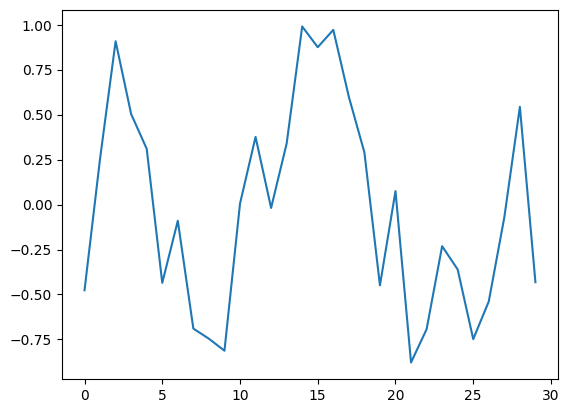

In [46]:
plt.plot(long_obs[380:410,0])

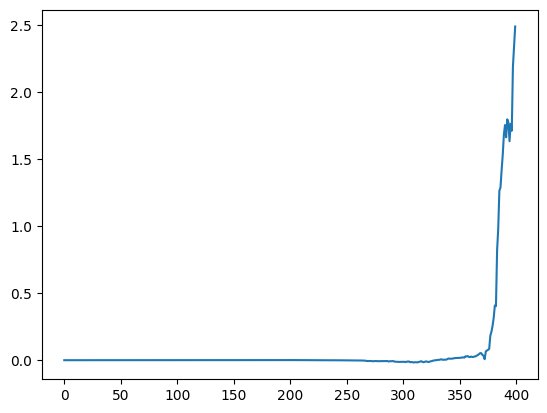

In [51]:
plt.plot((long_obs[:400,0]-long_obs3[:400,0]))

In [100]:
from utils.interactions import vmap_rollout_traj_node
obs=vmap_rollout_traj_node(node,featurize_node,jnp.array([long_obs_val,long_obs_val])[:,0,:],jnp.array([long_acts_val,long_acts_val]),1e-4)

In [101]:
def data_gen_single(rng, sequence_len):
    rng, subkey = jax.random.split(rng)
    idx = jax.random.randint(subkey, shape=(1,),minval=0, maxval=(long_obs_train.shape[0]-sequence_len-1))

    slice = jnp.linspace(
            start=idx, stop=idx + sequence_len, num=sequence_len+1, dtype=int
        ).T
    act_slice = jnp.linspace(
            start=idx, stop=idx + sequence_len-1, num=sequence_len, dtype=int
        ).T
    
    obs=long_obs_train[slice][0]
    acts=long_acts_train[act_slice][0]
    return obs,acts,rng

In [102]:
@eqx.filter_jit
def val_data_gen_single(rng, sequence_len):
    obs=long_obs_val
    acts=long_acts_val
    return obs,acts,rng

In [103]:
batch_size=100
mtrainer=ModelTrainer(
    train_steps=200_000,
    batch_size=batch_size,
    sequence_len=1,
    featurize=featurize_node,
    train_data_gen_sin=data_gen_single,
    val_data_gen_sin= val_data_gen_single,
    model_optimizer=optimizer_node,
    tau= 1e-3
    )
keys=jax.vmap(jax.random.PRNGKey)(np.random.randint(0, 2**31, size=(batch_size,)))

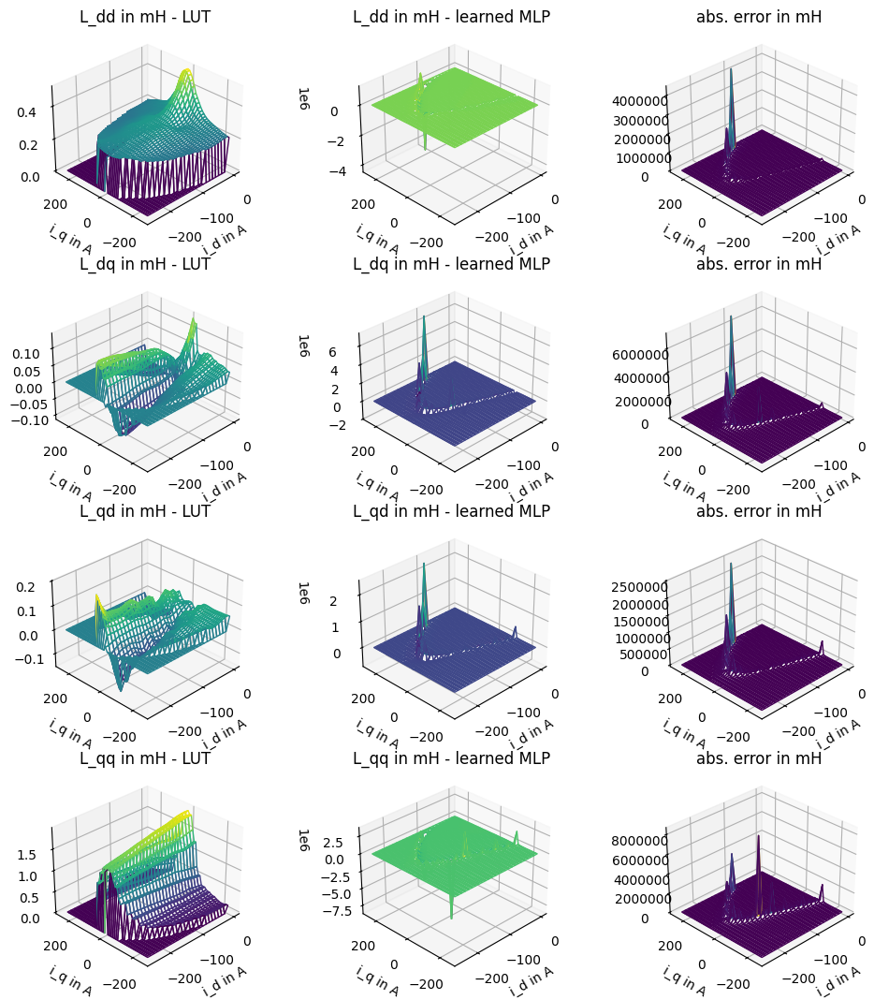

In [104]:
eval_L(node)

  0%|          | 0/200000 [00:00<?, ?it/s]

Current val_loss: 0.363967024129181


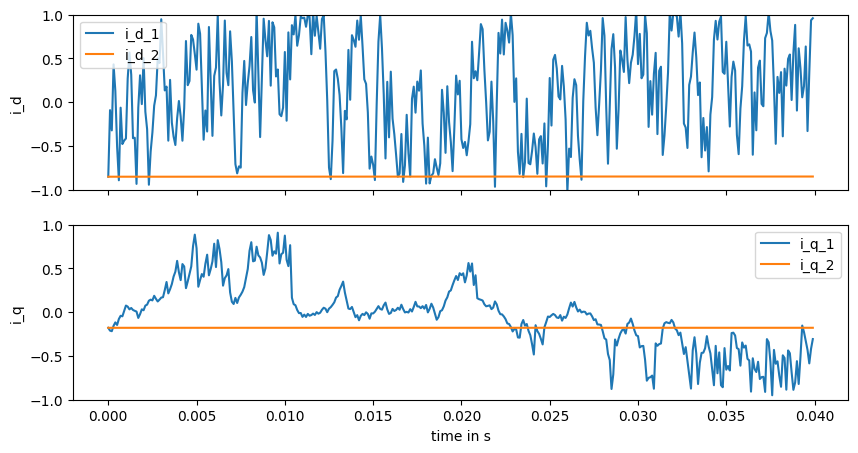

  2%|▏         | 4963/200000 [00:21<05:15, 619.12it/s]

Current val_loss: 0.2677373596984714


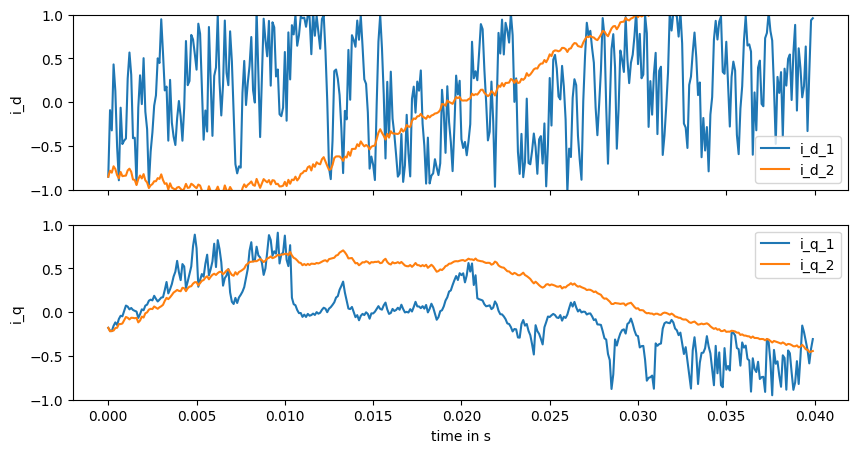

  5%|▍         | 9984/200000 [00:29<04:54, 644.52it/s]

Current val_loss: 1.1996594871387745


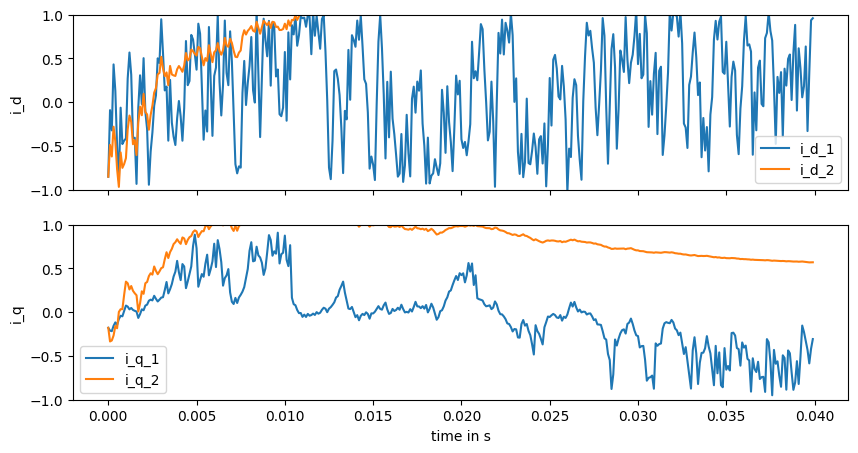

  7%|▋         | 14991/200000 [00:38<04:59, 618.15it/s]

Current val_loss: 1.7163230555932214


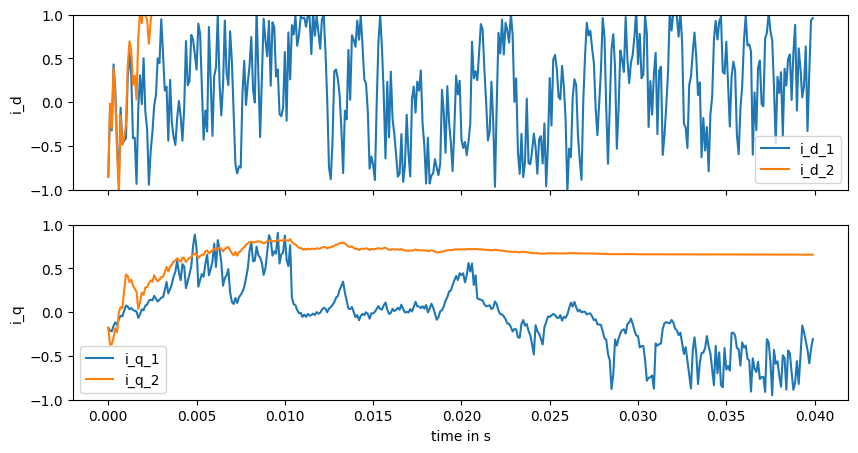

 10%|▉         | 19970/200000 [00:47<04:51, 617.26it/s]

Current val_loss: 2.627573323597595


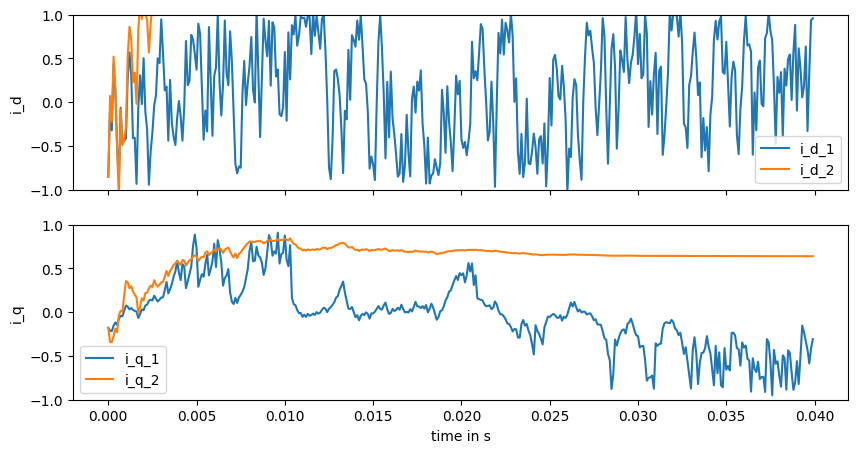

 12%|█▏        | 24988/200000 [00:56<05:04, 573.82it/s]

Current val_loss: 4.410798061920768


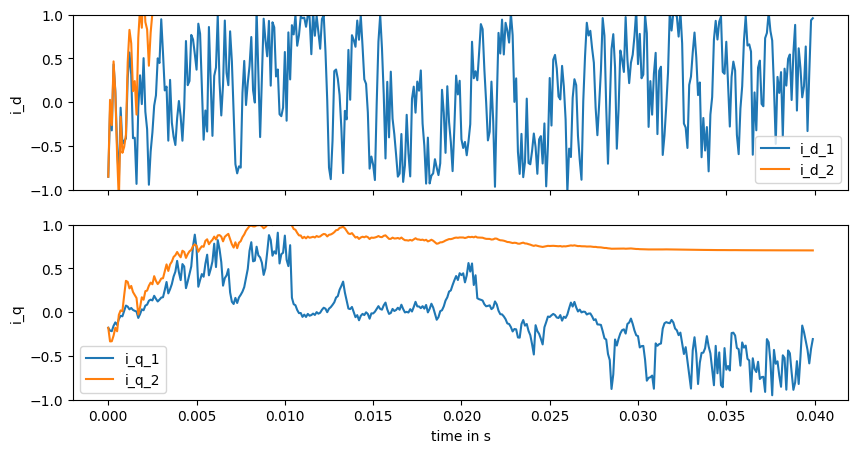

 15%|█▍        | 29969/200000 [01:04<04:32, 624.16it/s]

Current val_loss: 6.887527686755656


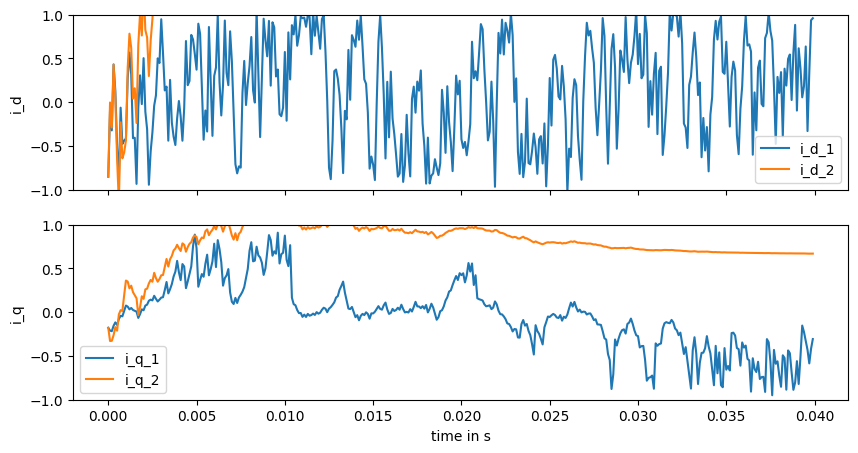

 17%|█▋        | 34963/200000 [01:13<04:28, 614.51it/s]

Current val_loss: 8.972621875501058


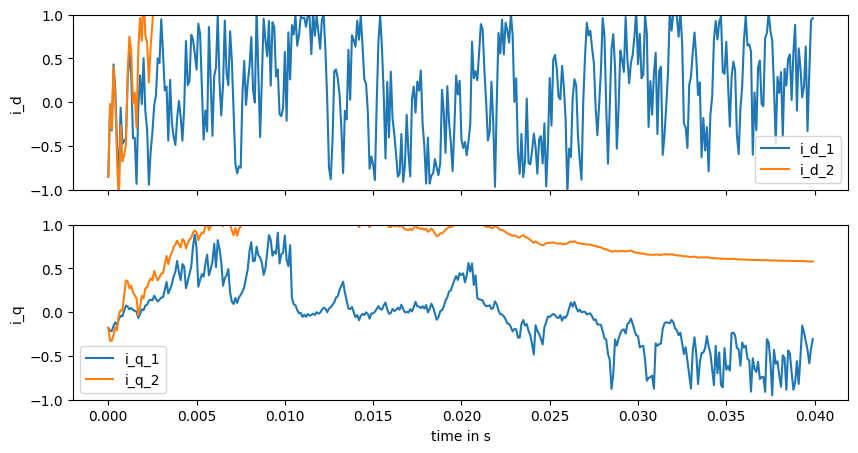

 20%|█▉        | 39942/200000 [01:22<04:19, 616.44it/s]

Current val_loss: 10.0973000236428


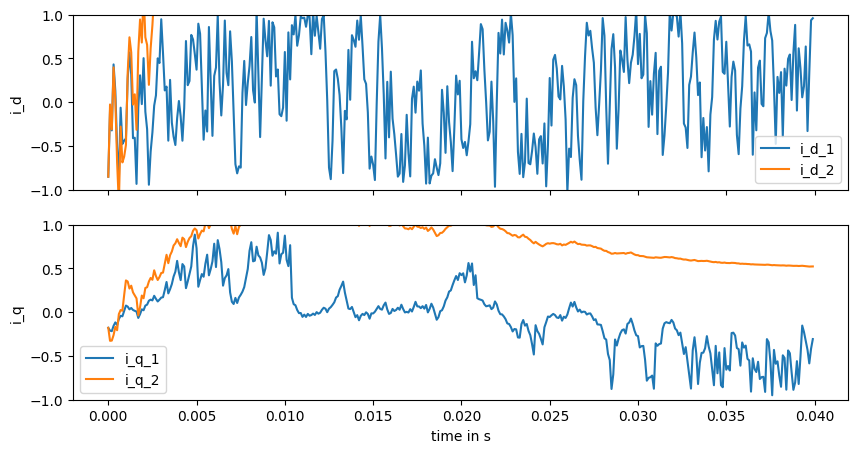

 22%|██▏       | 44991/200000 [01:31<04:09, 622.27it/s]

Current val_loss: 10.443975127086388


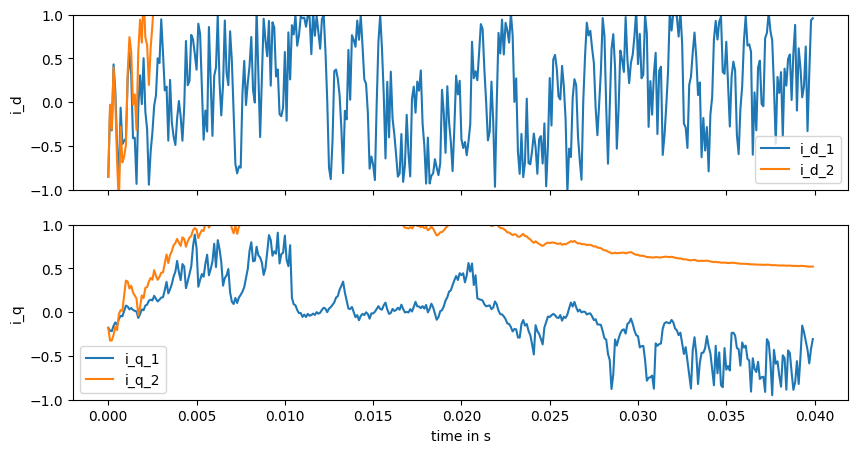

 25%|██▍       | 49944/200000 [01:39<04:02, 617.88it/s]

Current val_loss: 10.619165149603447


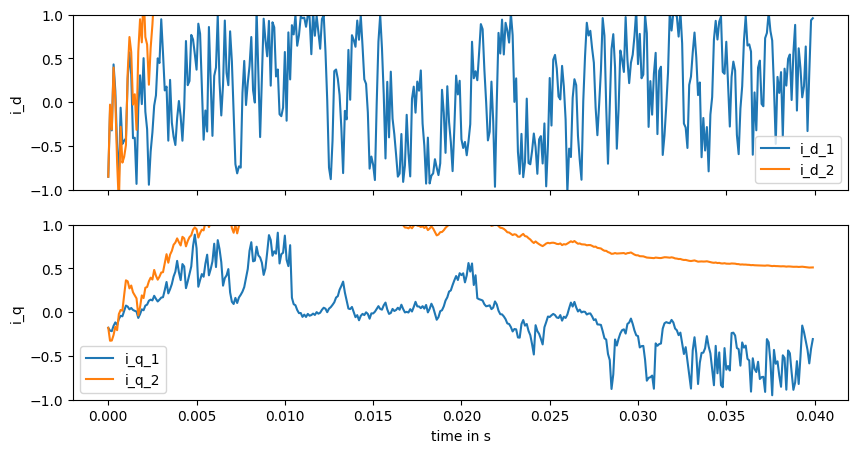

 27%|██▋       | 54992/200000 [01:48<03:52, 623.99it/s]

Current val_loss: 10.738359086592489


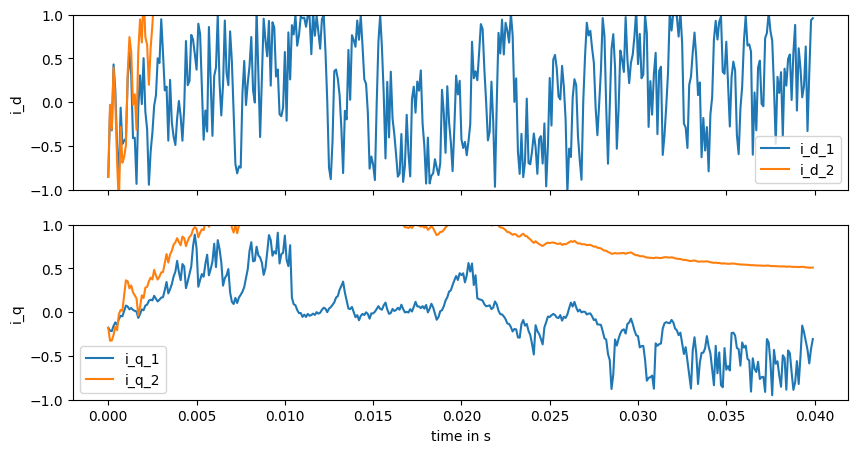

 30%|██▉       | 59963/200000 [01:57<03:48, 612.02it/s]

Current val_loss: 10.679252841471062


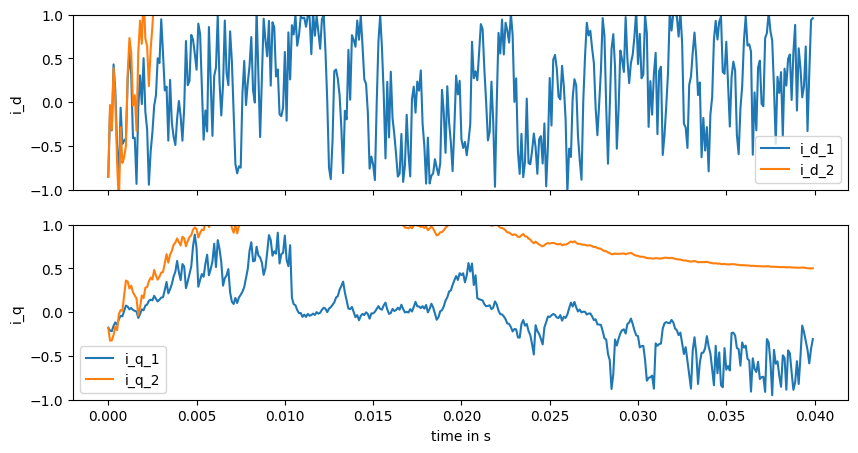

 32%|███▏      | 64974/200000 [02:05<03:30, 640.08it/s]

Current val_loss: 10.695887805918266


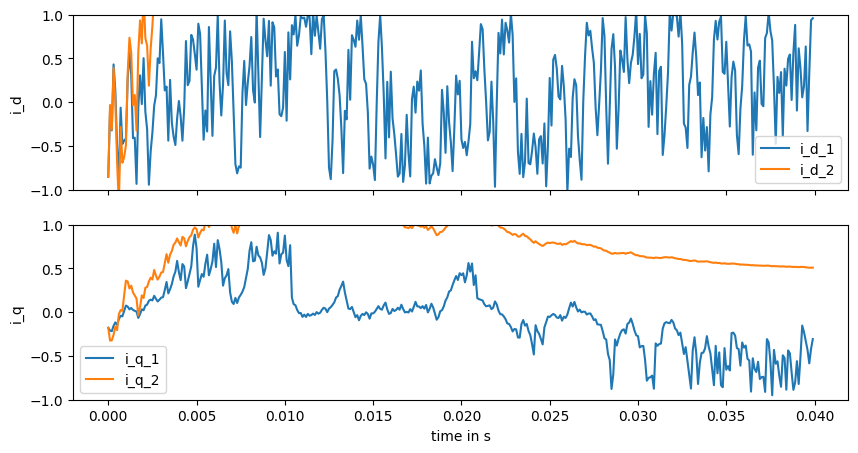

 35%|███▍      | 69978/200000 [02:14<03:23, 640.44it/s]

Current val_loss: 10.78497970579204


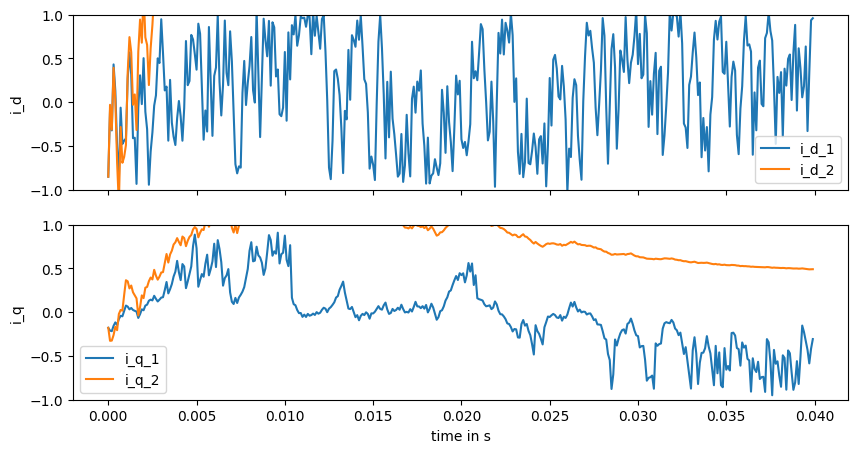

 37%|███▋      | 74948/200000 [02:22<03:25, 609.66it/s]

Current val_loss: 10.768510124451618


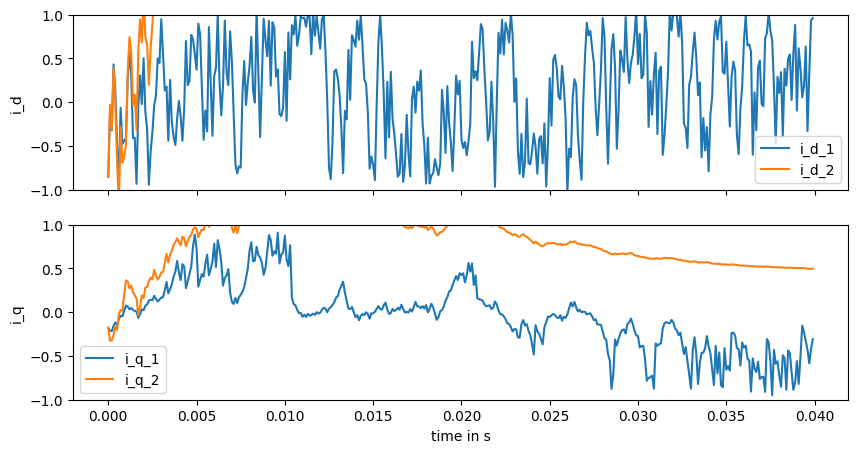

 40%|███▉      | 79966/200000 [02:31<03:12, 622.47it/s]

Current val_loss: 10.68364069381879


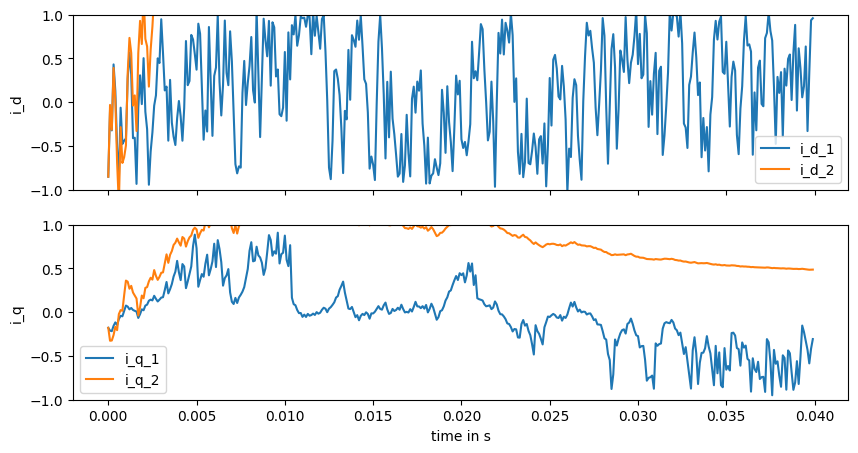

 42%|████▏     | 84939/200000 [02:40<03:05, 619.91it/s]

Current val_loss: 10.65581146349549


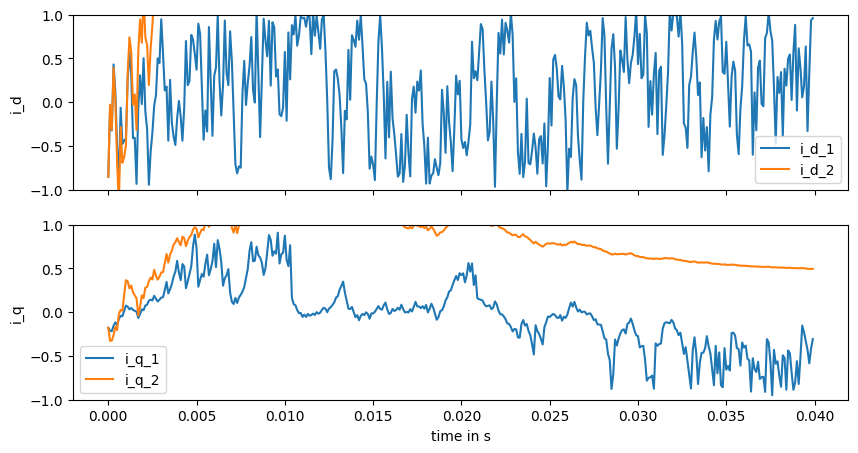

 45%|████▍     | 89965/200000 [02:49<02:57, 619.86it/s]

Current val_loss: 10.70194828471145


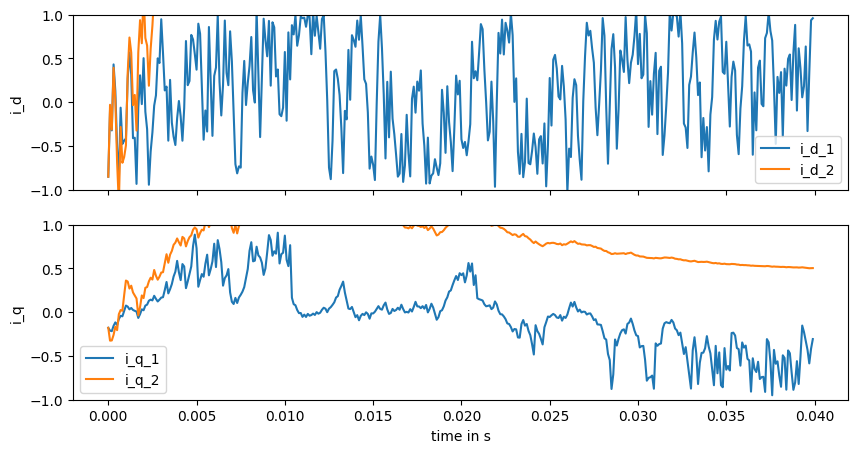

 47%|████▋     | 94996/200000 [02:59<02:48, 622.98it/s]

Current val_loss: 10.607561264822849


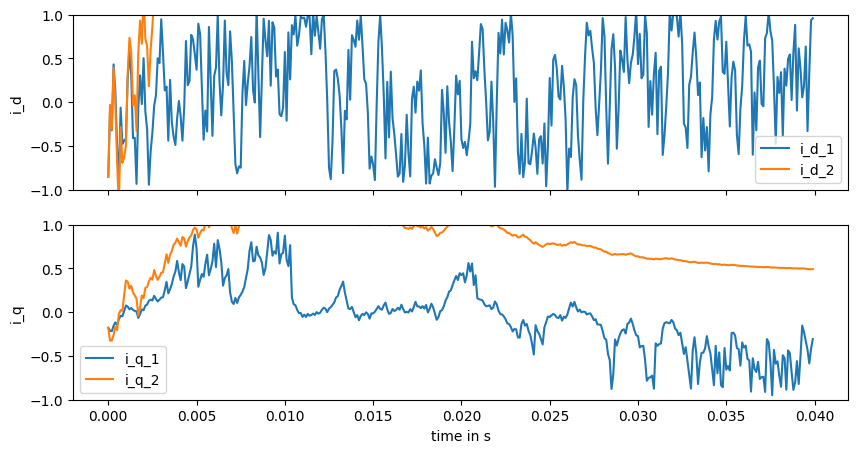

 50%|████▉     | 99975/200000 [03:08<02:45, 604.49it/s]

Current val_loss: 10.583006521023092


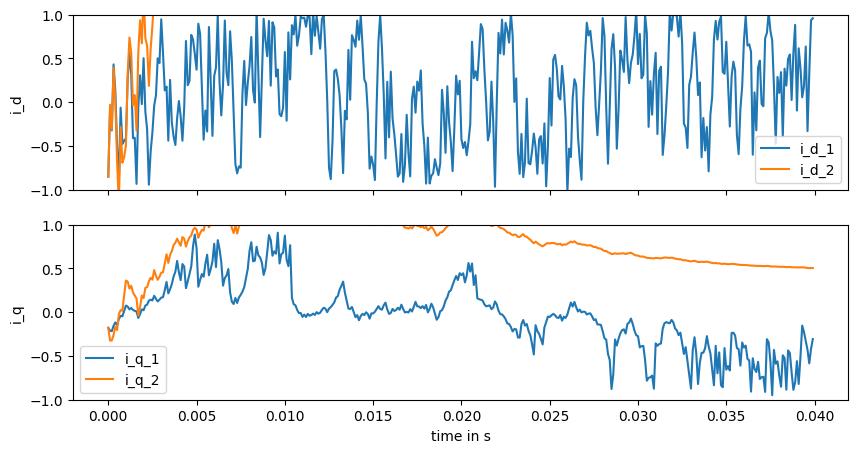

 52%|█████▏    | 104999/200000 [03:17<02:31, 628.62it/s]

Current val_loss: 10.767132185056031


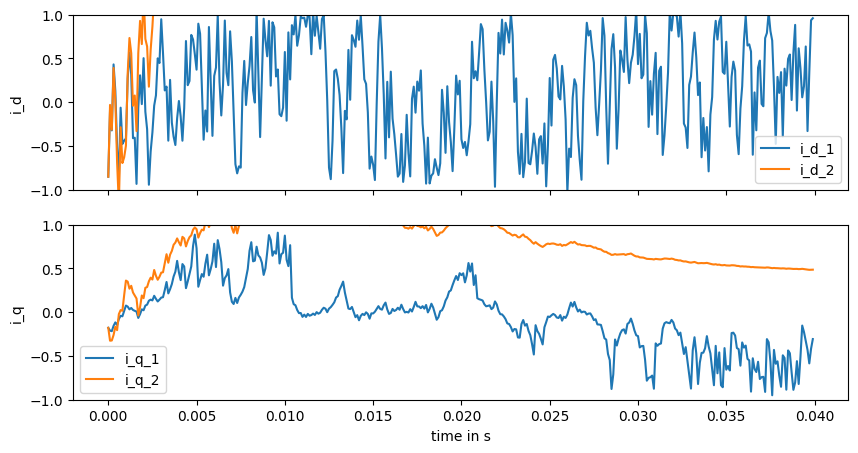

 55%|█████▍    | 109967/200000 [03:25<02:20, 642.03it/s]

Current val_loss: 10.763198164941892


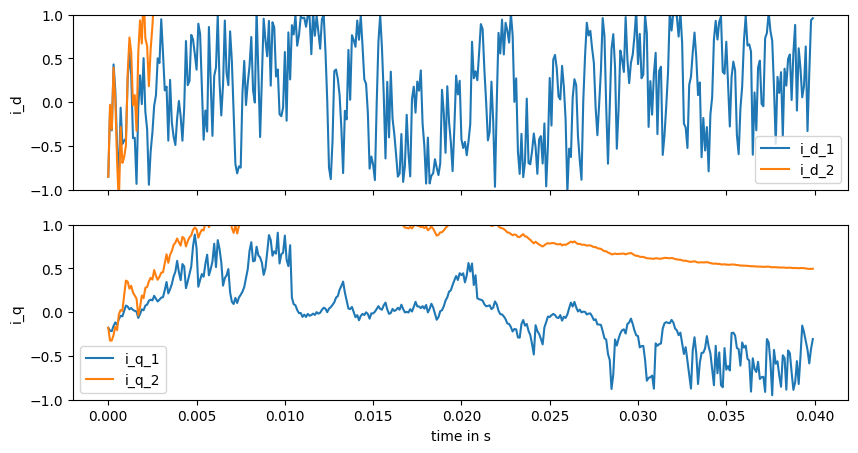

 57%|█████▋    | 114977/200000 [03:34<02:12, 641.97it/s]

Current val_loss: 10.663931363095248


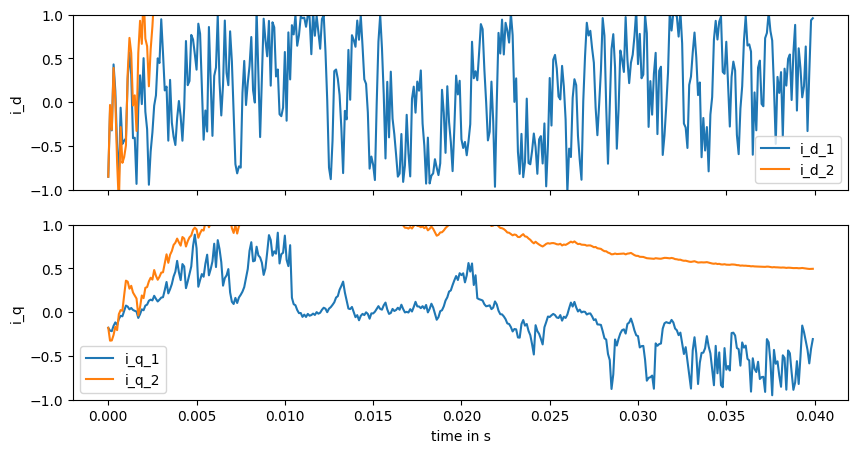

 60%|█████▉    | 119950/200000 [03:42<02:10, 614.33it/s]

Current val_loss: 10.611206946531192


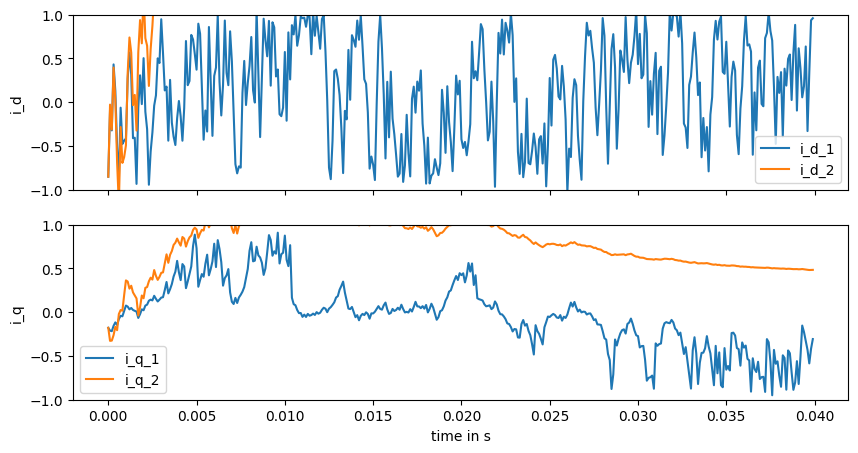

 62%|██████▏   | 124953/200000 [03:51<01:59, 627.25it/s]

Current val_loss: 10.615784968055122


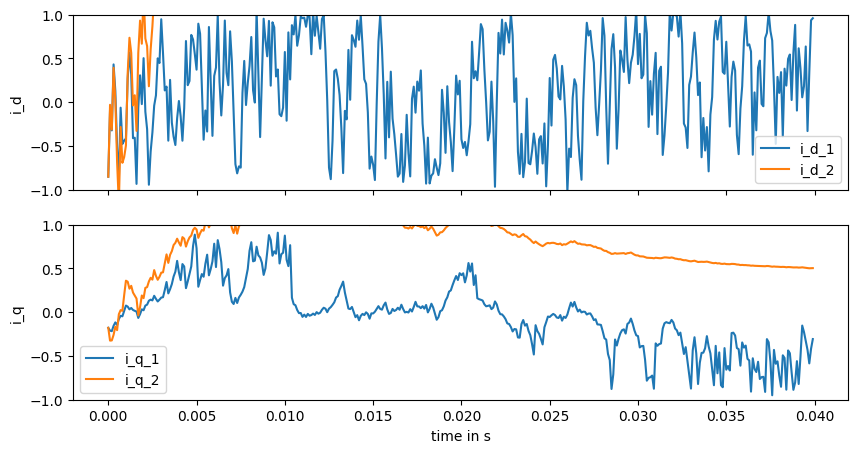

 65%|██████▍   | 129957/200000 [04:00<01:50, 634.94it/s]

Current val_loss: 10.72364072469431


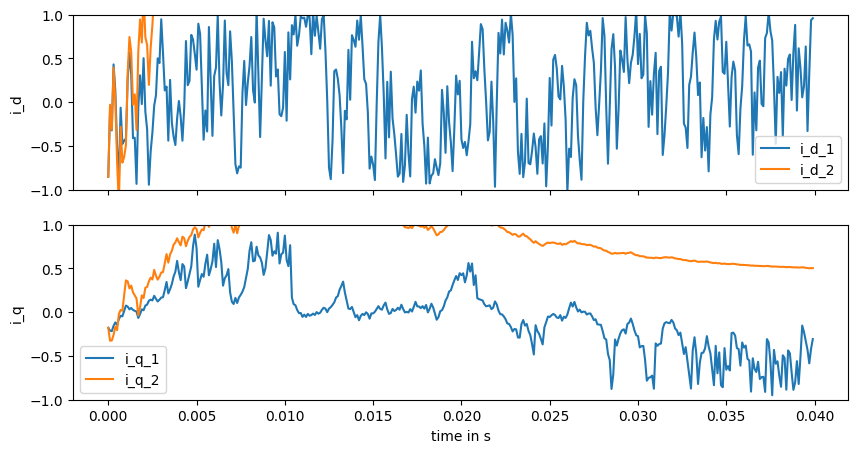

 67%|██████▋   | 134982/200000 [04:09<01:44, 622.84it/s]

Current val_loss: 10.672660187941165


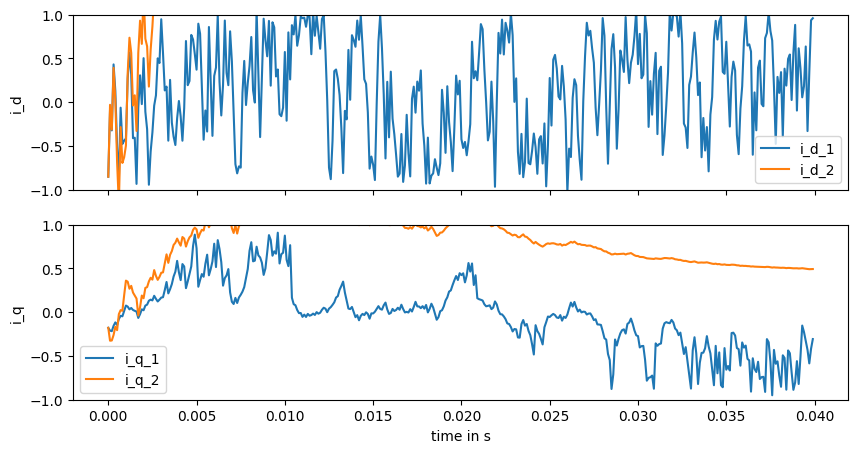

 70%|██████▉   | 139941/200000 [04:17<01:38, 611.64it/s]

Current val_loss: 10.705933762286847


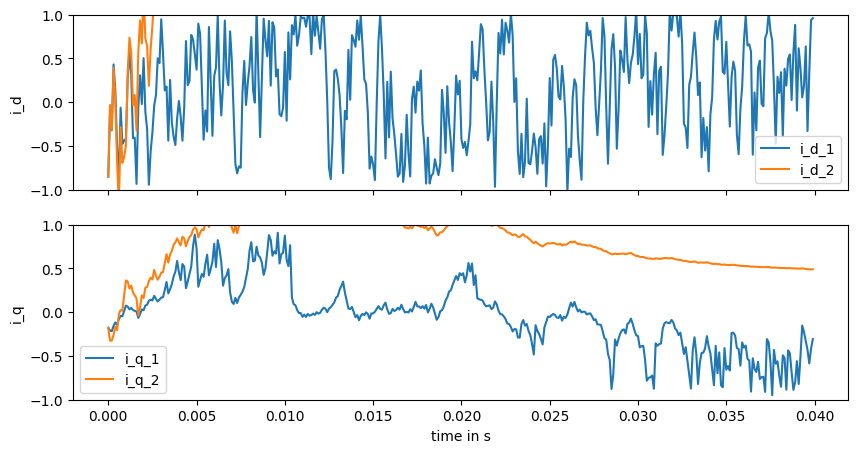

 72%|███████▏  | 144963/200000 [04:26<01:30, 611.33it/s]

Current val_loss: 10.641884523922537


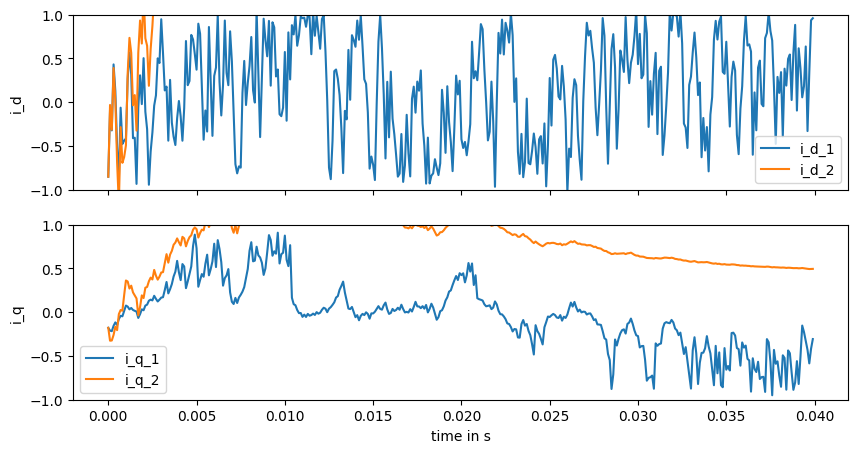

 75%|███████▍  | 149998/200000 [04:35<01:23, 602.35it/s]

Current val_loss: 10.600887029197056


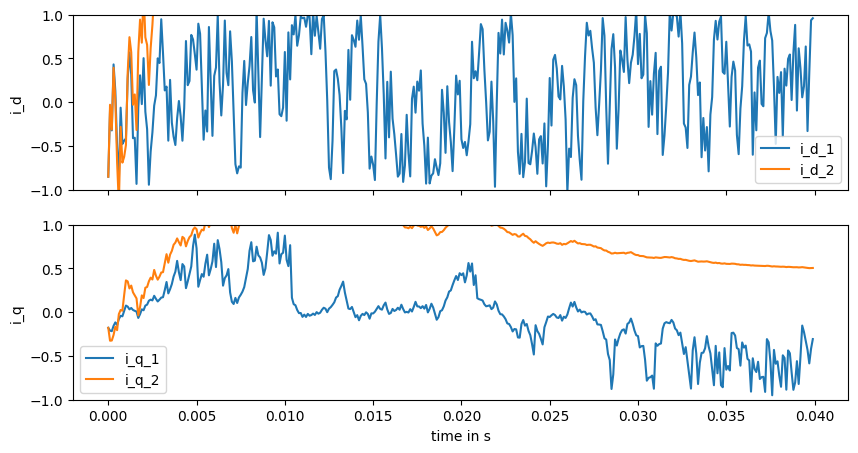

 77%|███████▋  | 154994/200000 [04:44<01:11, 628.61it/s]

Current val_loss: 10.778822555668539


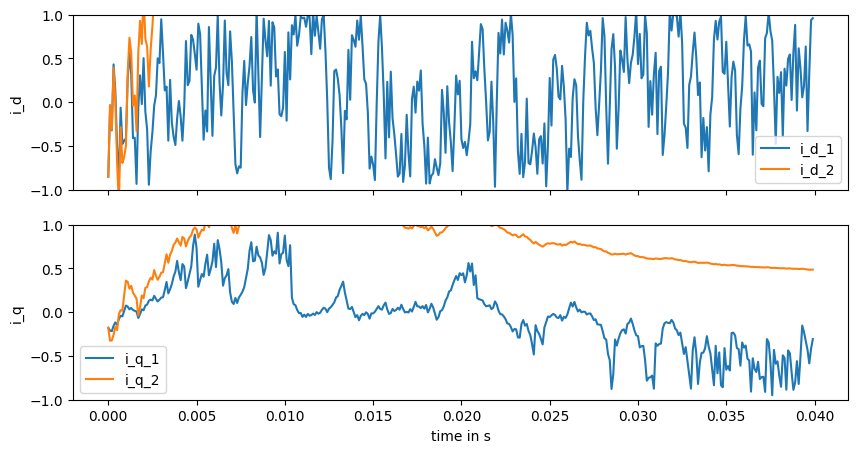

 80%|███████▉  | 159967/200000 [04:53<01:06, 603.73it/s]

Current val_loss: 10.605124050785438


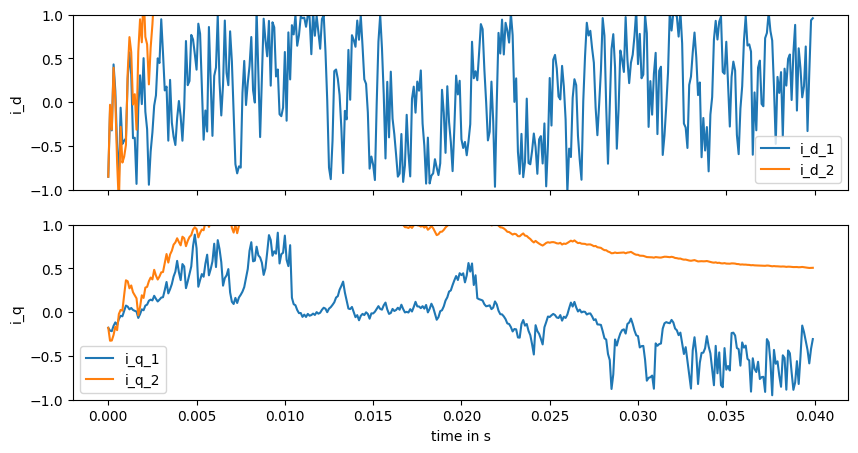

 82%|████████▏ | 164997/200000 [05:02<00:57, 612.86it/s]

Current val_loss: 10.689084030594616


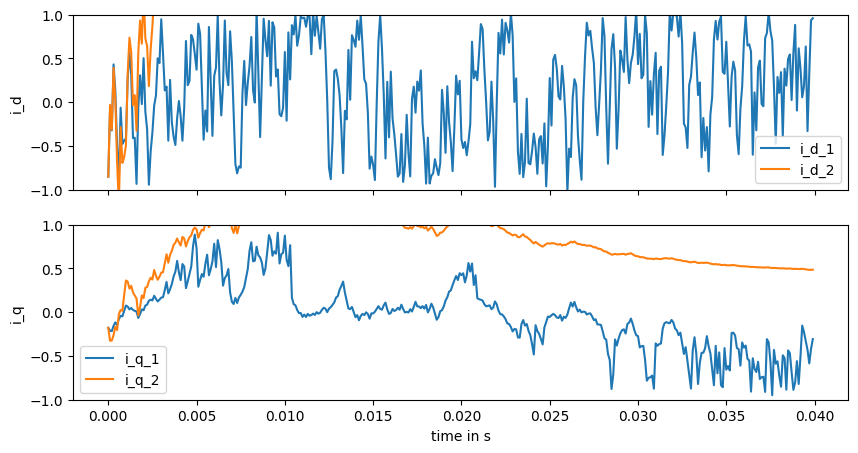

 85%|████████▍ | 169993/200000 [05:11<00:49, 603.97it/s]

Current val_loss: 10.644640316245406


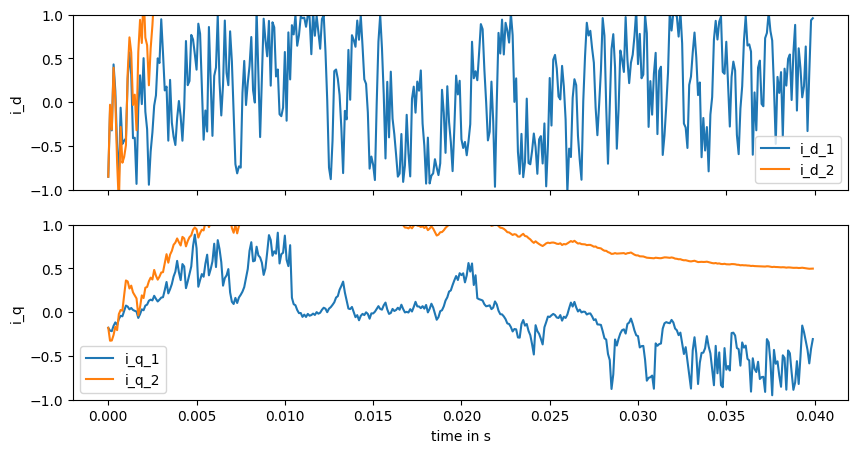

 87%|████████▋ | 174987/200000 [05:20<00:40, 620.39it/s]

Current val_loss: 10.748735655433837


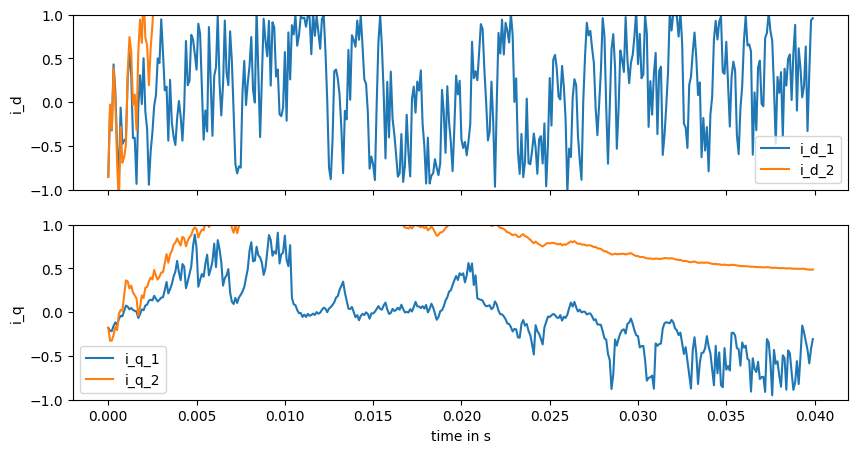

 90%|████████▉ | 179953/200000 [05:28<00:32, 609.69it/s]

Current val_loss: 10.906695074124649


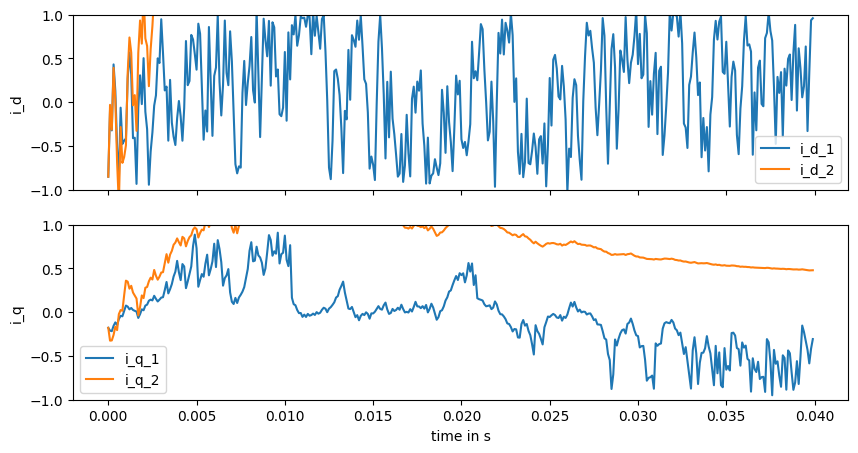

 92%|█████████▏| 184960/200000 [05:37<00:25, 594.78it/s]

Current val_loss: 10.915956203148367


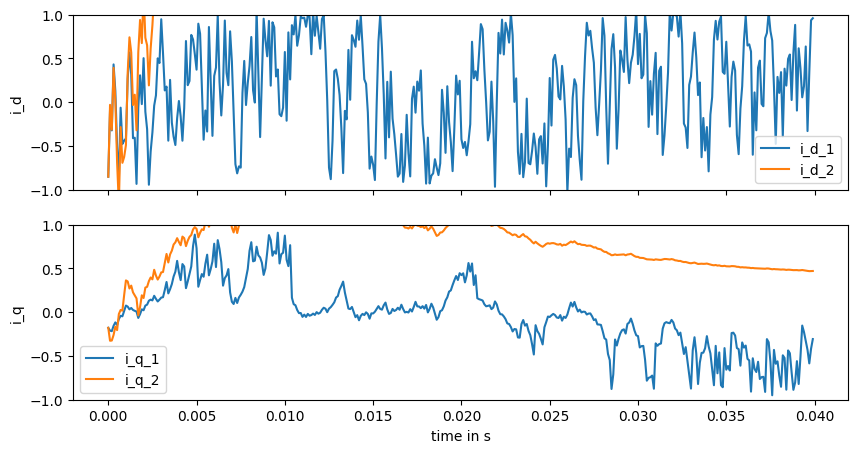

 95%|█████████▍| 189969/200000 [05:47<00:17, 572.55it/s]

Current val_loss: 10.85591182868295


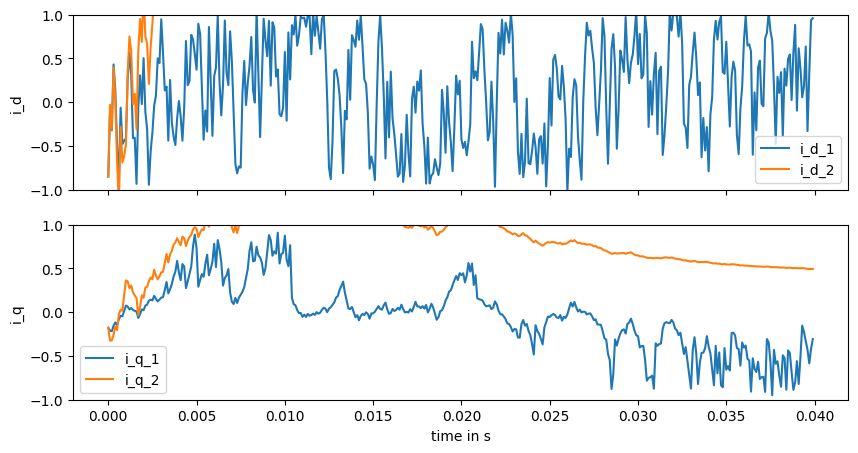

 97%|█████████▋| 194969/200000 [05:56<00:08, 567.81it/s]

Current val_loss: 10.940352461221766


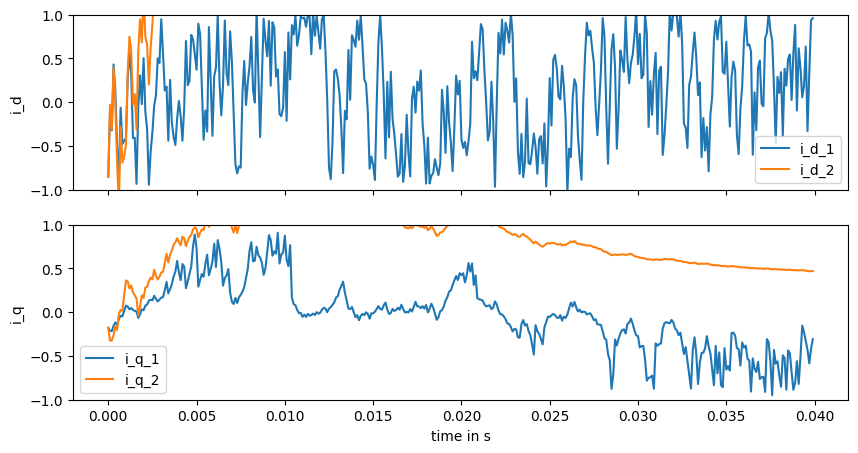

100%|██████████| 200000/200000 [06:06<00:00, 545.95it/s]


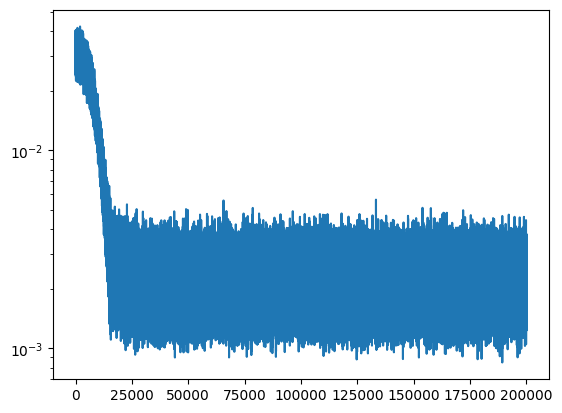

In [105]:
fin_node_1,fin_opt_state,fin_keys,losses, val_losses=mtrainer.fit_non_jit(node,opt_state,keys,plot_every=5000)
plt.plot(losses)
plt.yscale('log')

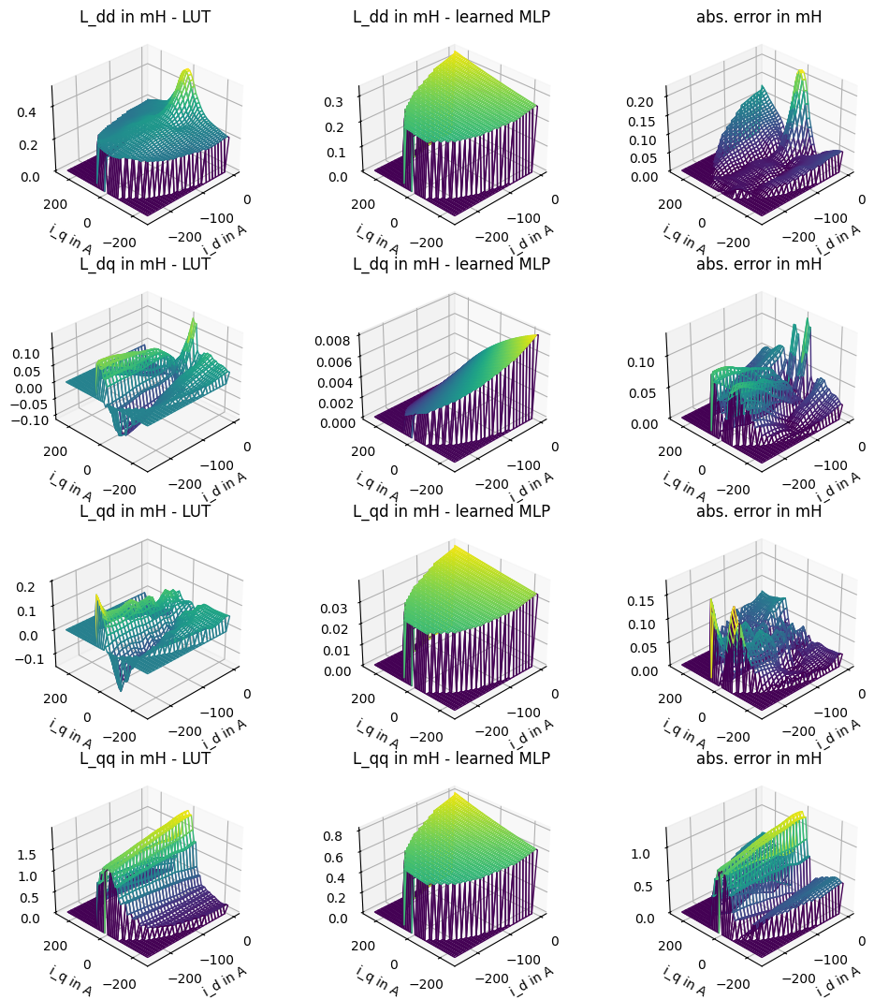

In [106]:
eval_L(fin_node_1)

In [8]:
motor_env = PMSM(
    saturated=True,
    LUT_motor_name="BRUSA",
    batch_size=1,
    control_state=[], 
    static_params = {
            "p": 3,
            "r_s": 15e-3,
            "l_d": 0.37e-3,
            "l_q": 1.2e-3,
            "psi_p": 65.6e-3,
            "deadtime": 0,
    })

In [9]:
@eqx.filter_jit
def reset_env(env,rng):
    obs, _ = env.reset(env.env_properties, rng)  #
    obs = obs.at[2].set((3*1500 / 60 * 2 * jnp.pi) / (2 * jnp.pi * 3 * 11000 / 60))
    return obs

In [10]:
@eqx.filter_jit
def motor_env_dat_gen_sin(env,reset_env, rng, traj_len):
    rng, subkey = jax.random.split(rng)
    ref_obs = reset_env(env,subkey) 
    rng, subkey = jax.random.split(rng)
    init_obs = reset_env(env,subkey)  
    return init_obs, ref_obs, rng

In [11]:
@eqx.filter_jit
def featurize(obs,ref_obs, featurize_state=jnp.array([0,0])):
    feat_obs=jnp.concatenate([obs[0:2],ref_obs[0:2],ref_obs[0:2]-obs[0:2],featurize_state])#jnp.concatenate([obs[0:2],obs[6:8],ref_obs[0:2],ref_obs[0:2]-obs[0:2],featurize_state])
    featurize_state=jnp.clip(featurize_state + ref_obs[0:2]-obs[0:2],min=-1,max=1) * (jnp.sign(0.01-jnp.sum((ref_obs[0:2]-obs[0:2])**2))*0.5+0.5)
    return feat_obs,featurize_state

In [12]:
@eqx.filter_jit
def mse_loss(feat_obs):
    loss=jnp.mean(jnp.sum((feat_obs[:,4:6])**2,axis=1))#be aware of idx if changing featurize
    return loss

In [13]:
@eqx.filter_jit
def penalty_loss(feat_obs):
    loss=jnp.array([0])
    return loss

In [14]:
jax_key = jax.random.PRNGKey(2)
policy=MLP([8,64,64,64,2],key=jax_key)
optimizer = optax.adam(5e-4)
opt_state = optimizer.init(policy)

In [15]:
data_batch_size=100
trainer=DPCTrainer(
    batch_size=data_batch_size,
    train_steps=1000,
    horizon_length=50,
    reset_env=reset_env,
    data_gen_sin=motor_env_dat_gen_sin,
    featurize=featurize,
    policy_optimizer=optimizer,
    ref_loss=mse_loss,
    constr_penalty=penalty_loss,
    ref_loss_weight=1)
keys=jax.vmap(jax.random.PRNGKey)(np.random.randint(0, 2**31, size=(data_batch_size,)))
#key=jax.vmap(jax.random.PRNGKey)(jnp.linspace(0,1000,1001).astype(int))

In [16]:
import matplotlib.pyplot as plt
from utils.evaluation import steps_eval

100%|██████████| 1000/1000 [01:58<00:00,  8.43it/s]


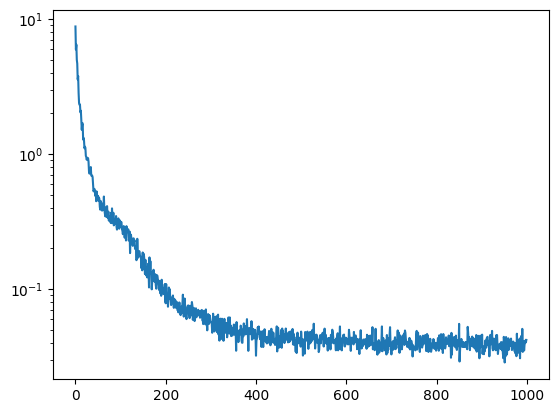

In [17]:
fin_policy2,fin_opt_state2,fin_keys2,losses2=trainer.fit_non_jit(policy,motor_env,keys,opt_state)
plt.plot(losses2)
plt.yscale('log')

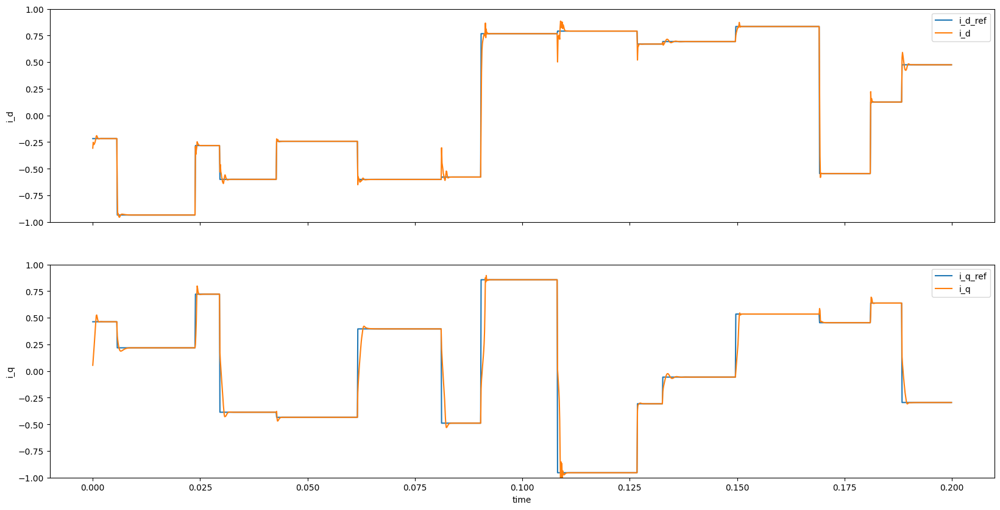

In [18]:
obs,obs2,acts=steps_eval(motor_env,reset_env,fin_policy2,featurize,jax.random.PRNGKey(765),2000)

In [22]:
from utils.signals import steps_ref_traj
from utils.interactions import rollout_traj_env_policy

rng=jax.random.PRNGKey(24)
ref_len=50000
rng, subkey = jax.random.split(rng)
obs_ref = steps_ref_traj(motor_env, reset_env, subkey, ref_len, step_lens=[20,100])
rng, subkey = jax.random.split(rng)
init_obs= reset_env(motor_env,subkey)
long_obs, long_acts = rollout_traj_env_policy(fin_policy2, init_obs, obs_ref, ref_len, motor_env, featurize)

def data_gen_single(rng, sequence_len):
    rng, subkey = jax.random.split(rng)
    idx = jax.random.randint(subkey, shape=(1,),minval=0, maxval=(long_obs.shape[0]-sequence_len-1))

    slice = jnp.linspace(
            start=idx, stop=idx + sequence_len, num=sequence_len+1, dtype=int
        ).T
    act_slice = jnp.linspace(
            start=idx, stop=idx + sequence_len-1, num=sequence_len, dtype=int
        ).T
    
    obs=long_obs[slice][0]
    acts=long_acts[act_slice][0]
    return obs,acts,rng

def data_gen_single_non_predef(rng, sequence_len):
    rng, subkey = jax.random.split(rng)
    ref_obs = reset_env(motor_env,subkey) 
    rng, subkey = jax.random.split(rng)
    init_obs = reset_env(motor_env,subkey)
    obs,acts=rollout_traj_env_policy(fin_policy2, init_obs, ref_obs, sequence_len, motor_env, featurize)
    return obs,acts,rng

rng=jax.random.PRNGKey(245)
ref_len=400
rng, subkey = jax.random.split(rng)
obs_ref_val = steps_ref_traj(motor_env, reset_env, subkey, ref_len, step_lens=[20,50])
rng, subkey = jax.random.split(rng)
init_obs_val = reset_env(motor_env,subkey)
obs_val, acts_val = rollout_traj_env_policy(fin_policy2, init_obs_val, obs_ref_val, ref_len, motor_env, featurize)
@eqx.filter_jit
def val_data_gen_single(rng, sequence_len):
    obs=obs_val
    acts=acts_val
    return obs,acts,rng

In [23]:
jax_key = jax.random.PRNGKey(4)
node = ExpertModel(motor_env=motor_env,psi_layer_sizes=[2,32,32,1],L_layer_sizes=[2,32,32,4],key=jax_key)#NeuralEulerODE([4,128,128,128,128,2],key=jax_key)
optimizer_node = optax.adam(1e-4)
opt_state = optimizer_node.init(node)

In [34]:
batch_size=100
mtrainer=ModelTrainer(
    train_steps=300_000,
    batch_size=batch_size,
    sequence_len=1,
    featurize=featurize_node,
    train_data_gen_sin=data_gen_single_non_predef,
    val_data_gen_sin= val_data_gen_single,
    model_optimizer=optimizer_node,
    tau= motor_env.tau
    )
keys=jax.vmap(jax.random.PRNGKey)(np.random.randint(0, 2**31, size=(batch_size,)))

  0%|          | 0/300000 [00:00<?, ?it/s]

Current val_loss: 0.3524147622579626


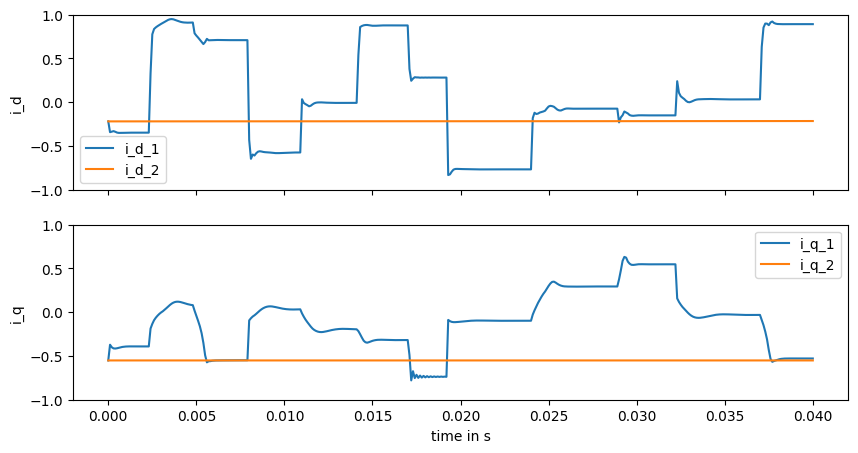

  1%|          | 1979/300000 [00:07<16:40, 297.89it/s]

Current val_loss: 0.44940076626132314


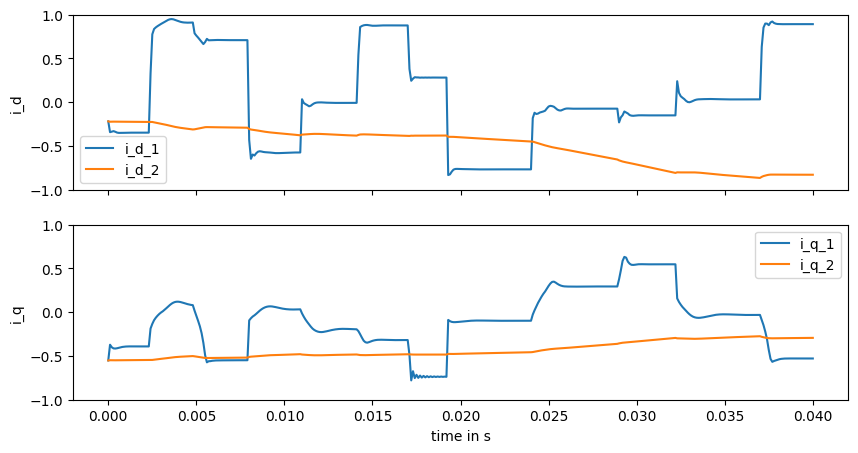

  1%|▏         | 3994/300000 [00:14<15:17, 322.62it/s]

Current val_loss: 0.8567699061712561


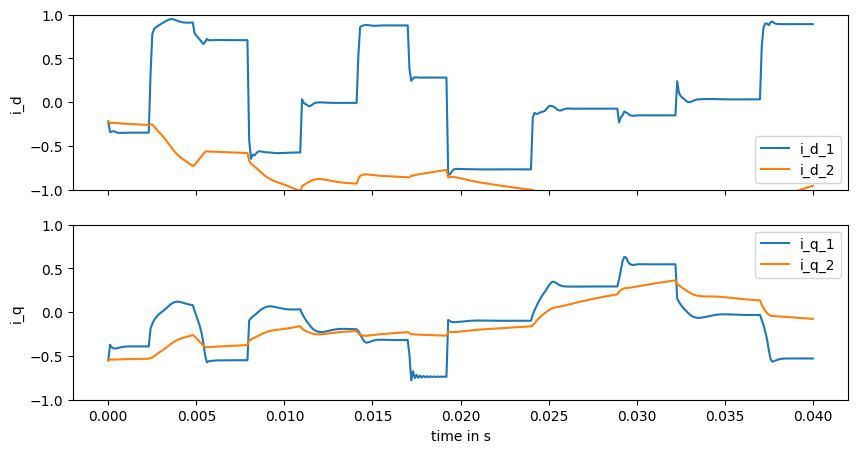

  2%|▏         | 5995/300000 [00:21<14:44, 332.36it/s]

Current val_loss: 0.5662921085856202


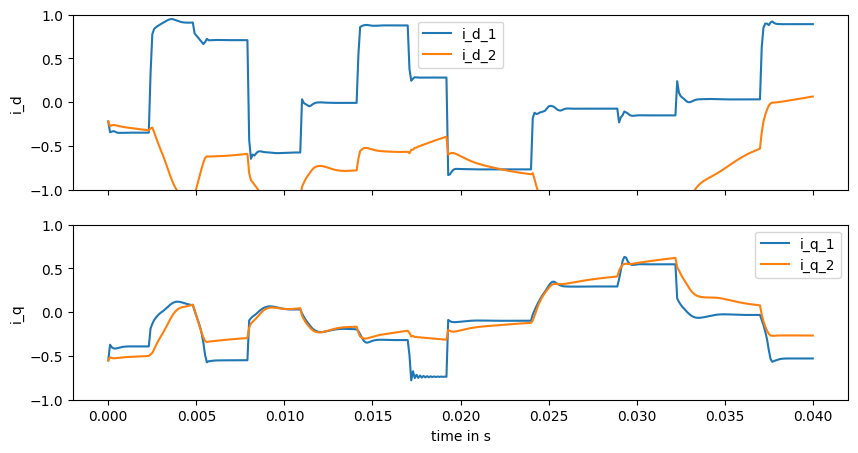

  3%|▎         | 7999/300000 [00:28<15:21, 316.86it/s]

Current val_loss: 0.25022116349661827


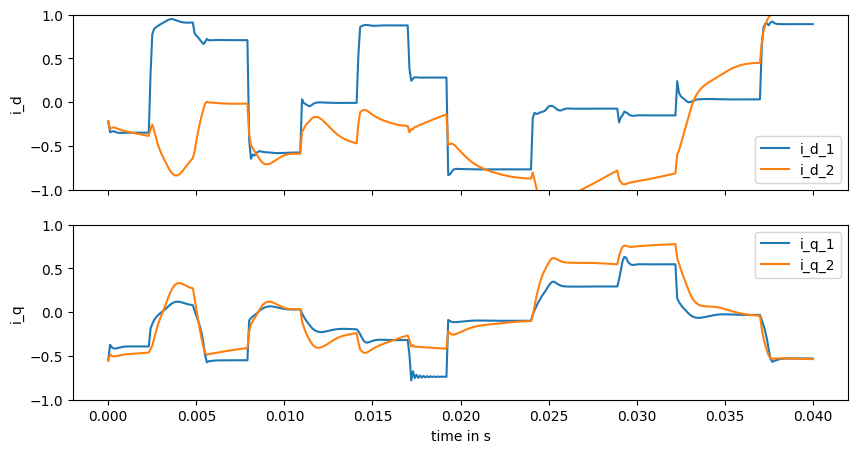

  3%|▎         | 9999/300000 [00:35<15:28, 312.32it/s]

Current val_loss: 0.22105419167032883


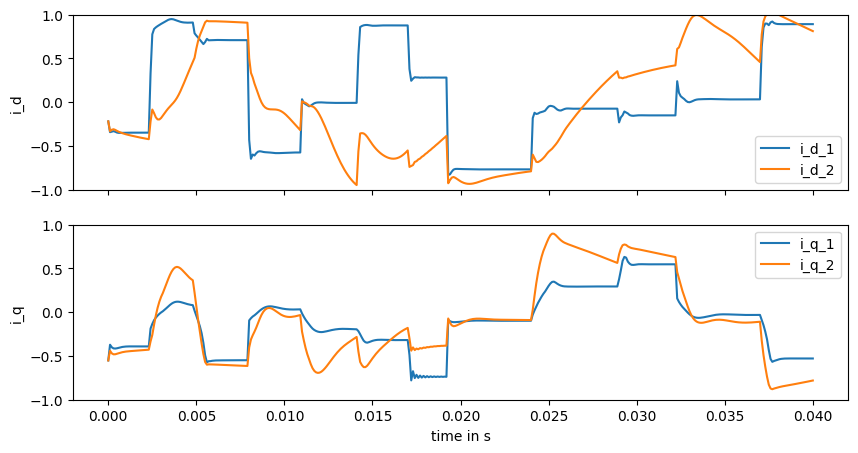

  4%|▍         | 11977/300000 [00:42<15:05, 318.10it/s]

Current val_loss: 0.6467529736703226


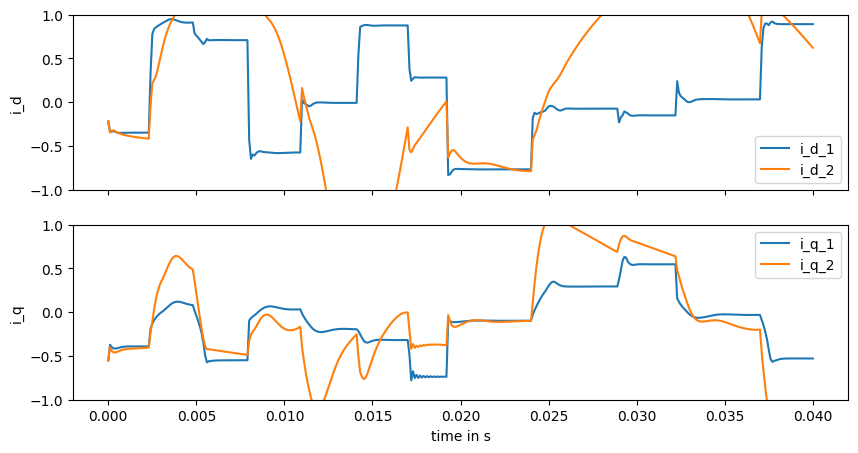

  5%|▍         | 13993/300000 [00:49<14:39, 325.27it/s]

Current val_loss: 1.7427134384679444


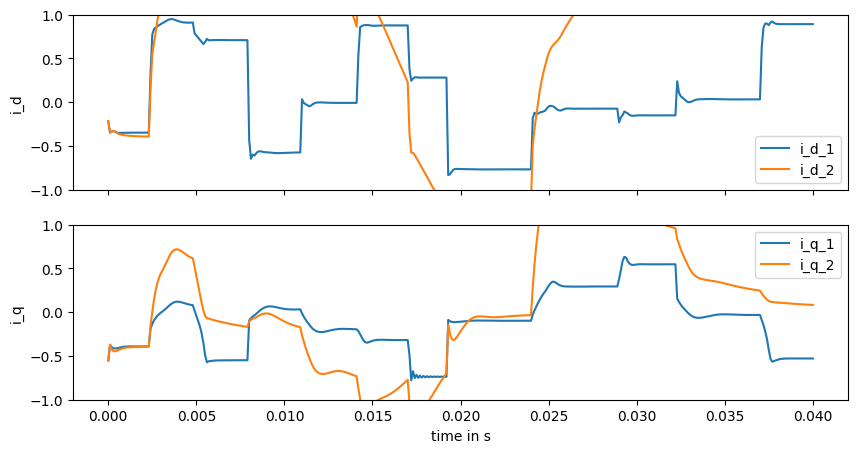

  5%|▌         | 15970/300000 [00:55<14:50, 319.06it/s]

Current val_loss: 2.4919924341782904


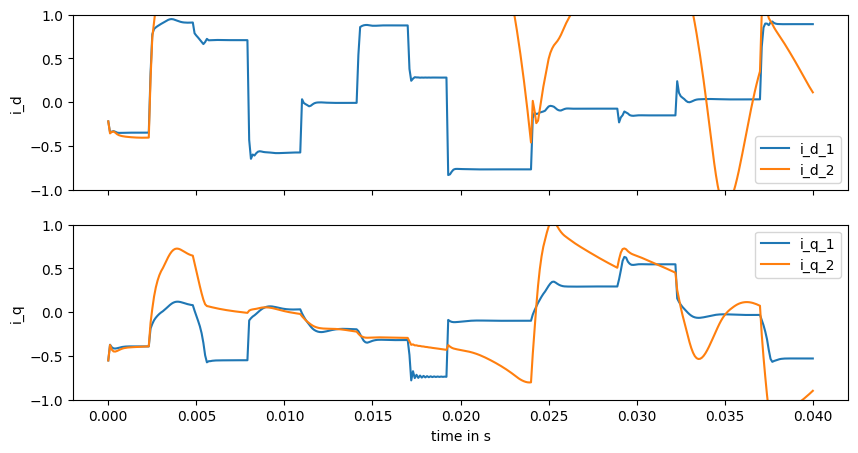

  6%|▌         | 17977/300000 [01:02<14:57, 314.39it/s]

Current val_loss: 3.8225558297437705


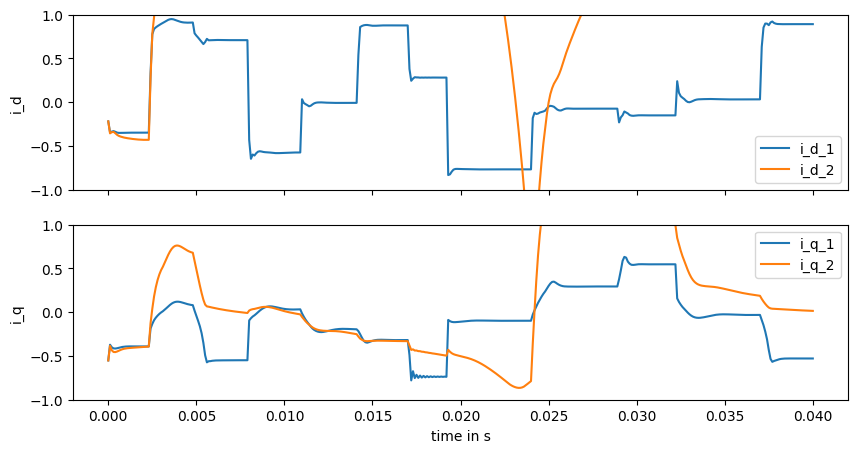

  7%|▋         | 19986/300000 [01:09<14:18, 326.14it/s]

Current val_loss: 6.081599449827417


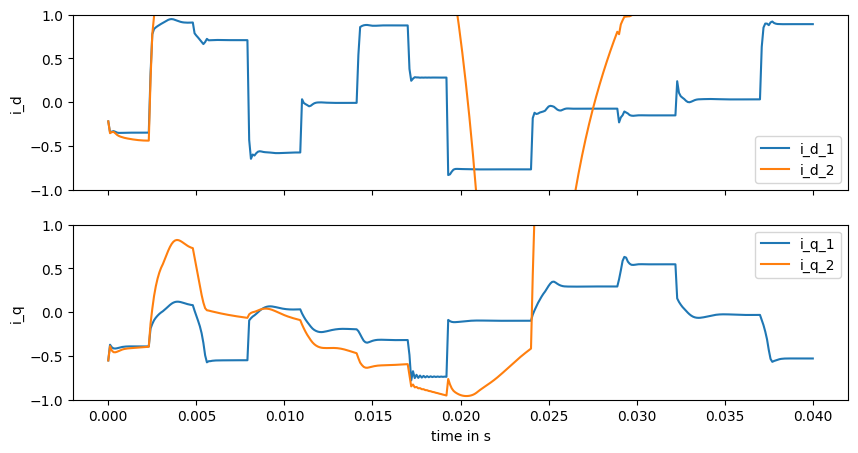

  7%|▋         | 21995/300000 [01:16<14:26, 320.84it/s]

Current val_loss: 6.861142155695671


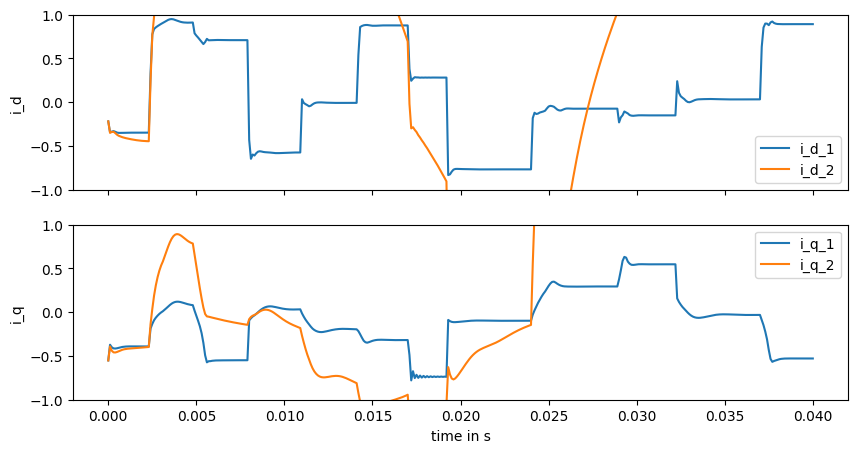

  8%|▊         | 23993/300000 [01:23<14:14, 323.07it/s]

Current val_loss: 3.1602245568419898


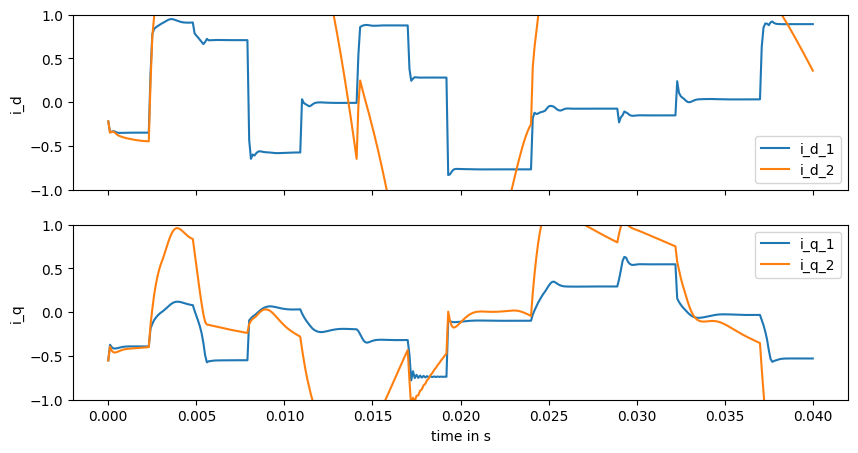

  9%|▊         | 25972/300000 [01:30<13:58, 327.00it/s]

Current val_loss: 3.0180912448510373


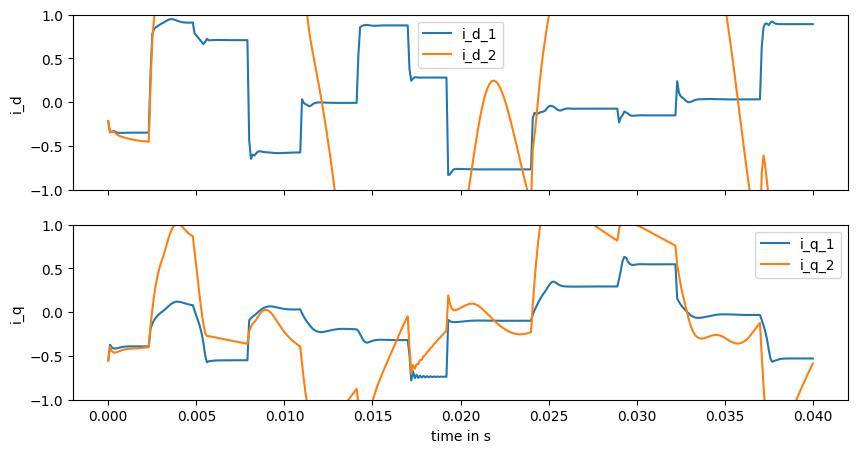

  9%|▉         | 27982/300000 [01:37<14:01, 323.18it/s]

Current val_loss: 3.5418008607660063


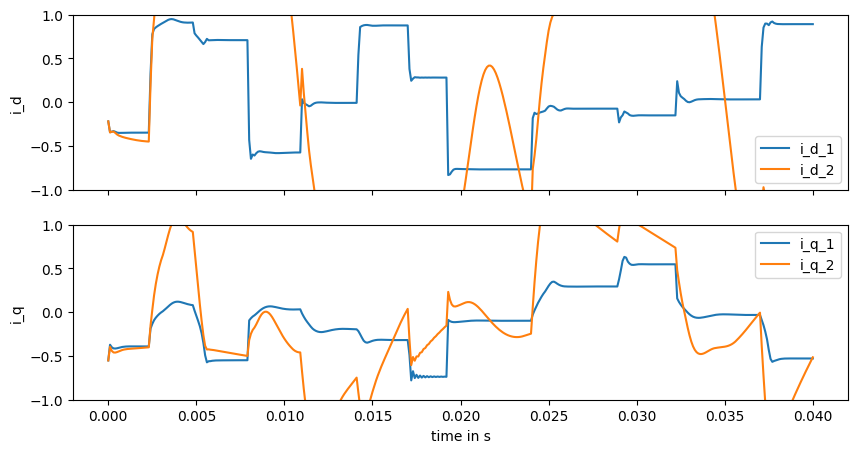

 10%|▉         | 29987/300000 [01:44<13:56, 322.66it/s]

Current val_loss: 4.349963825337287


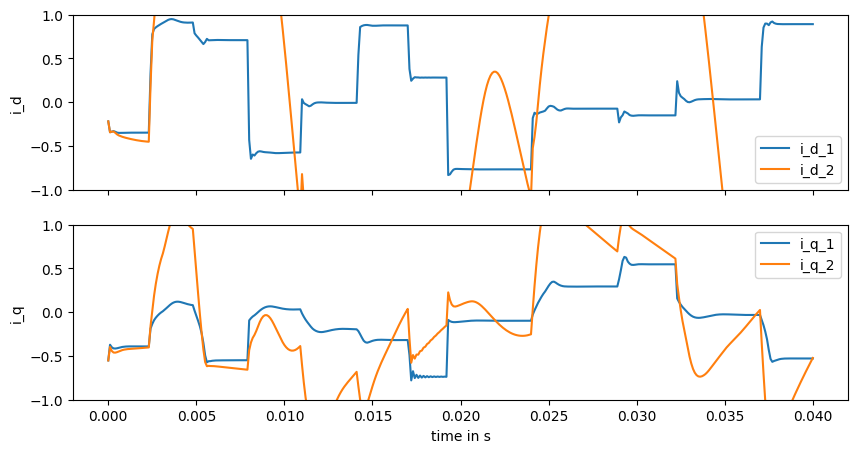

 11%|█         | 31999/300000 [01:51<13:49, 323.20it/s]

Current val_loss: 5.321306105394367


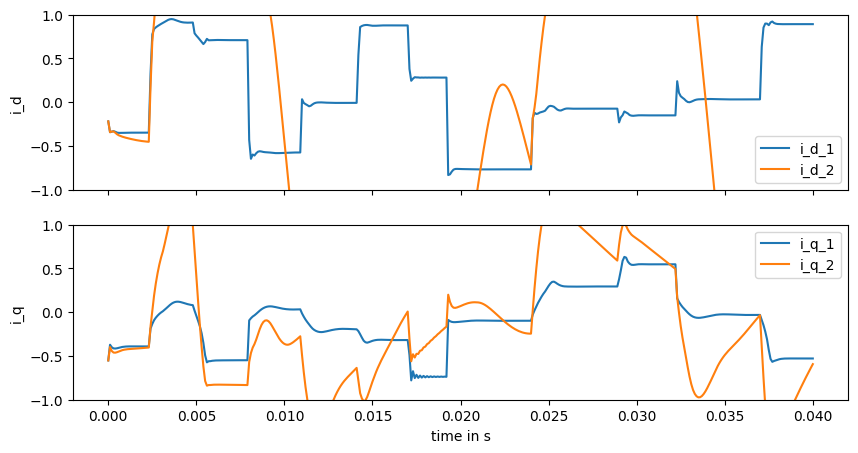

 11%|█▏        | 33977/300000 [01:58<13:46, 321.80it/s]

Current val_loss: 6.112391229559428


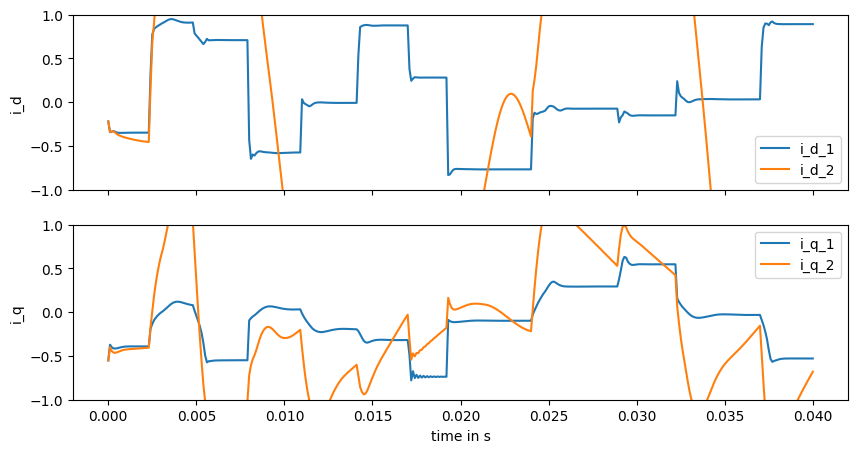

 12%|█▏        | 35988/300000 [02:05<13:38, 322.71it/s]

Current val_loss: 7.046743986049333


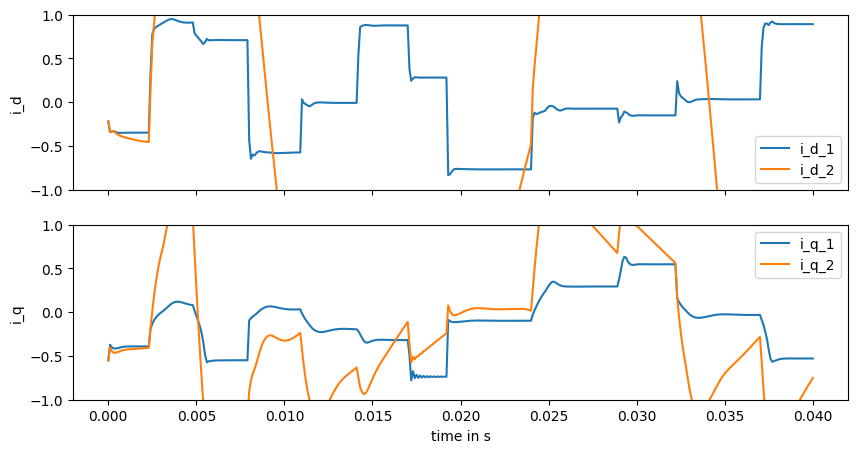

 13%|█▎        | 38000/300000 [02:12<13:37, 320.39it/s]

Current val_loss: 7.276648221453939


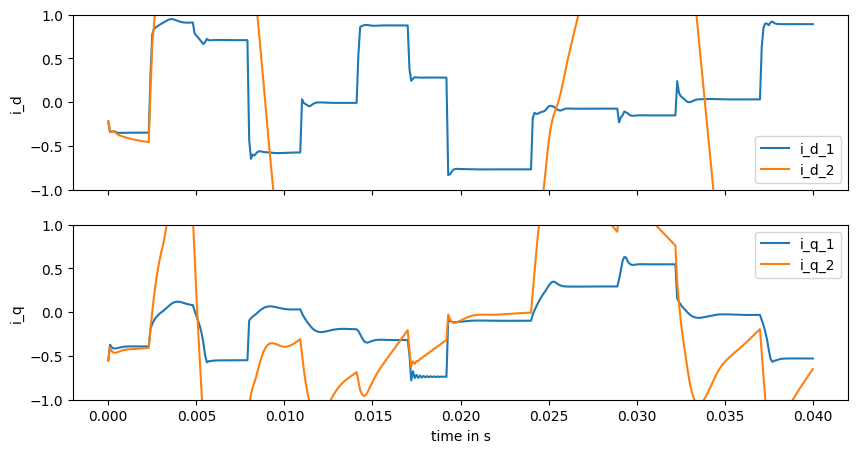

 13%|█▎        | 39985/300000 [02:18<13:37, 318.16it/s]

Current val_loss: 7.60383819752475


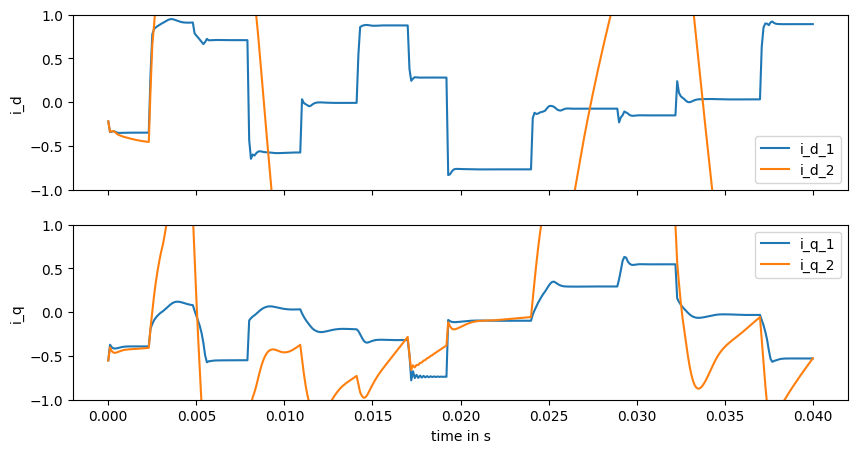

 14%|█▍        | 41978/300000 [02:26<13:48, 311.42it/s]

Current val_loss: 8.020936405974089


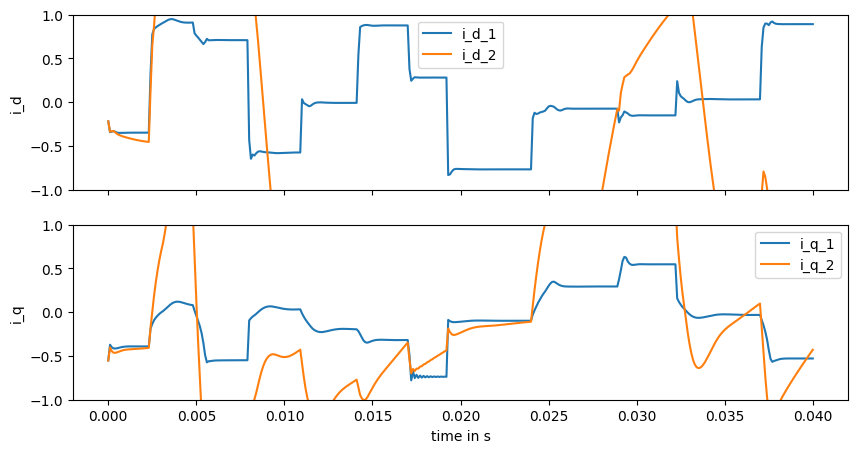

 15%|█▍        | 43971/300000 [02:32<13:04, 326.35it/s]

Current val_loss: 8.45108595079864


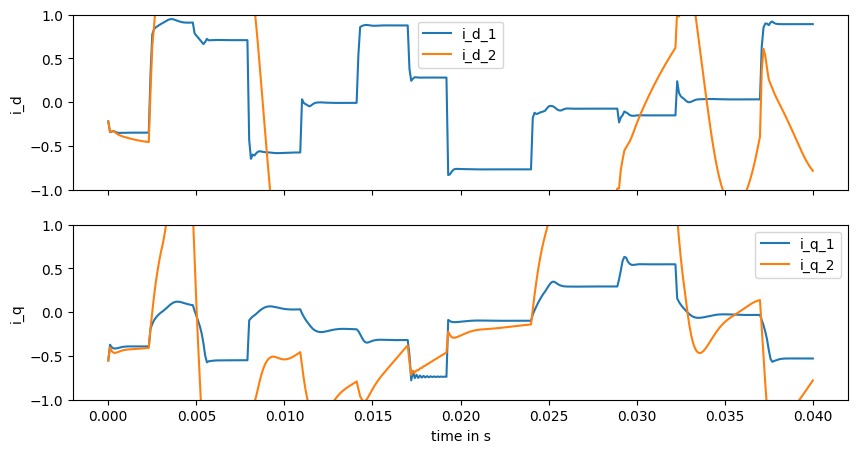

 15%|█▌        | 45980/300000 [02:39<13:09, 321.83it/s]

Current val_loss: 8.657806980138169


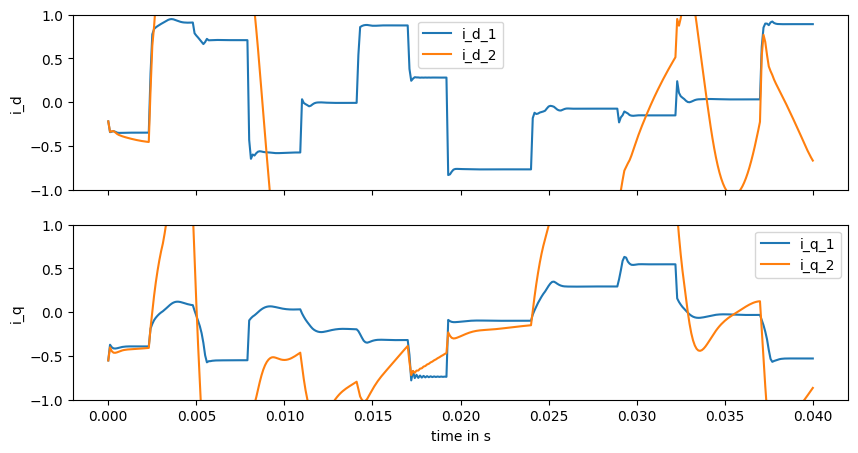

 16%|█▌        | 47980/300000 [02:46<13:05, 320.82it/s]

Current val_loss: 8.772759989785682


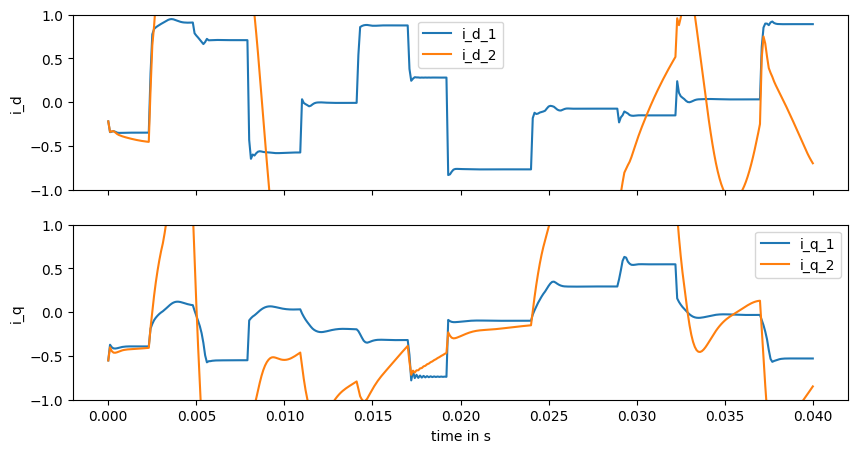

 17%|█▋        | 49977/300000 [02:53<12:58, 320.97it/s]

Current val_loss: 8.601178430423277


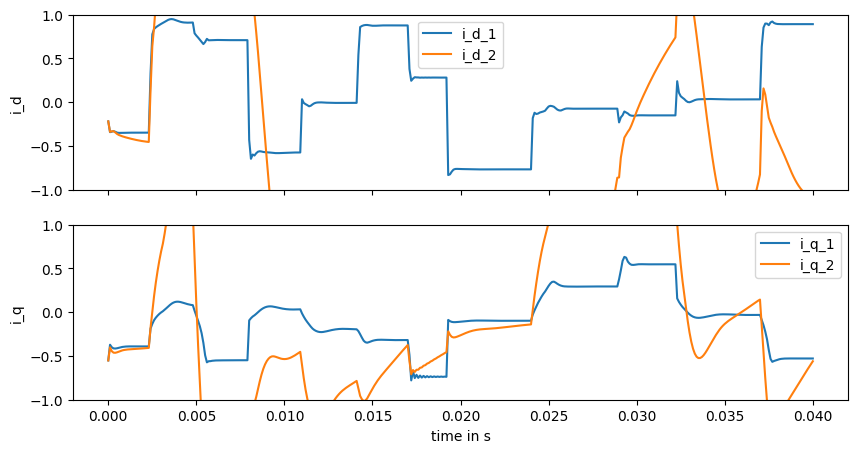

 17%|█▋        | 51986/300000 [03:00<12:49, 322.22it/s]

Current val_loss: 8.492648306936761


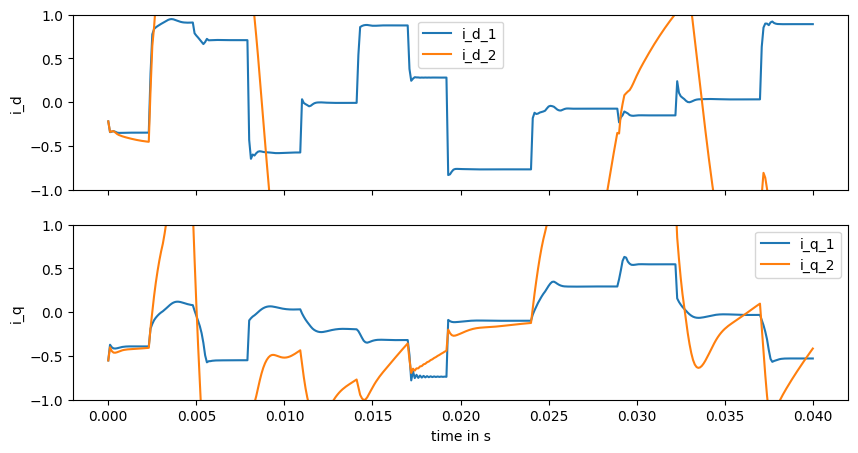

 18%|█▊        | 53995/300000 [03:07<12:46, 320.76it/s]

Current val_loss: 8.501390653703837


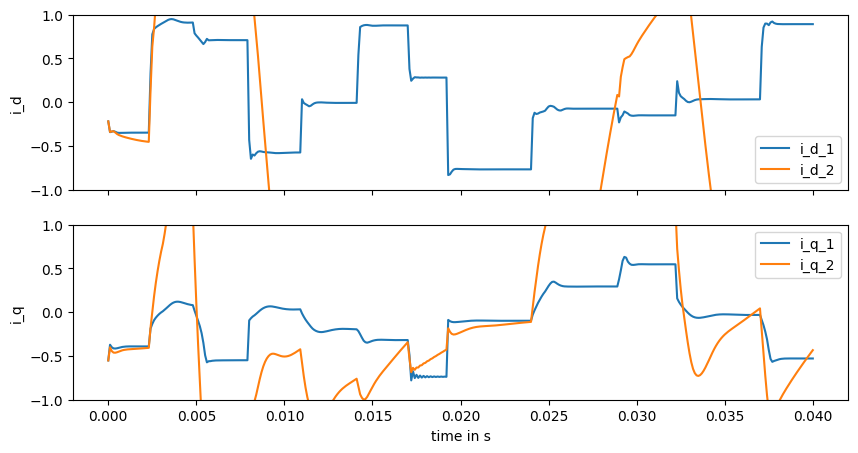

 19%|█▊        | 55973/300000 [03:14<12:33, 323.65it/s]

Current val_loss: 8.49135031450581


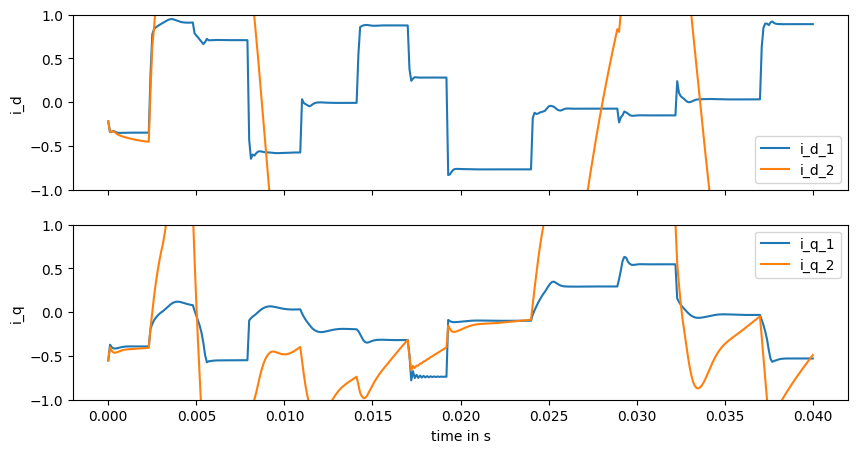

 19%|█▉        | 57987/300000 [03:21<12:55, 312.07it/s]

Current val_loss: 8.384026700578657


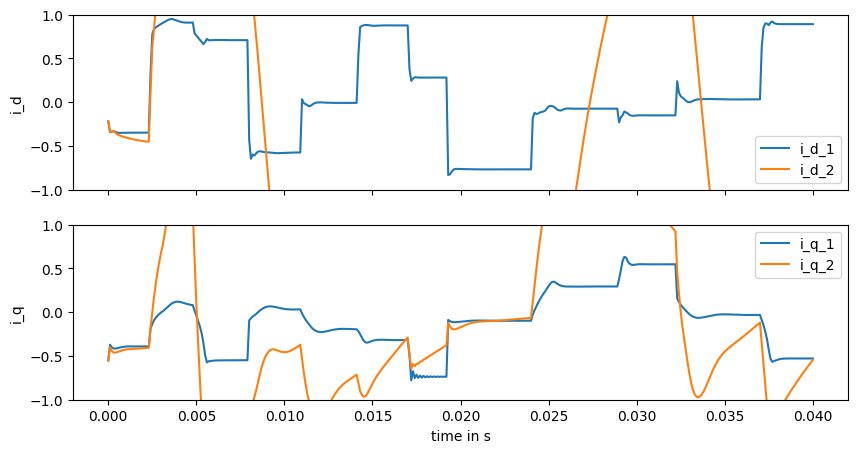

 20%|█▉        | 59995/300000 [03:28<12:24, 322.47it/s]

Current val_loss: 8.38239828627725


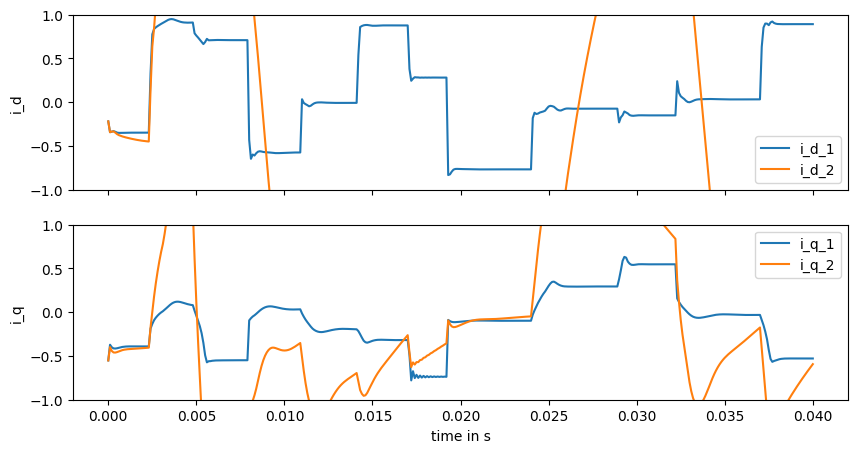

 21%|██        | 61998/300000 [03:36<18:41, 212.30it/s]

Current val_loss: 8.166105489017804


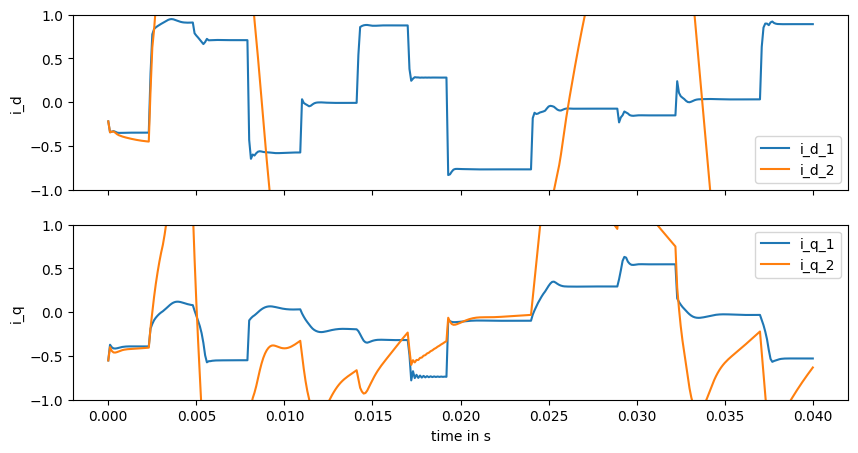

 21%|██▏       | 63972/300000 [03:43<12:13, 321.66it/s]

Current val_loss: 8.003679406227356


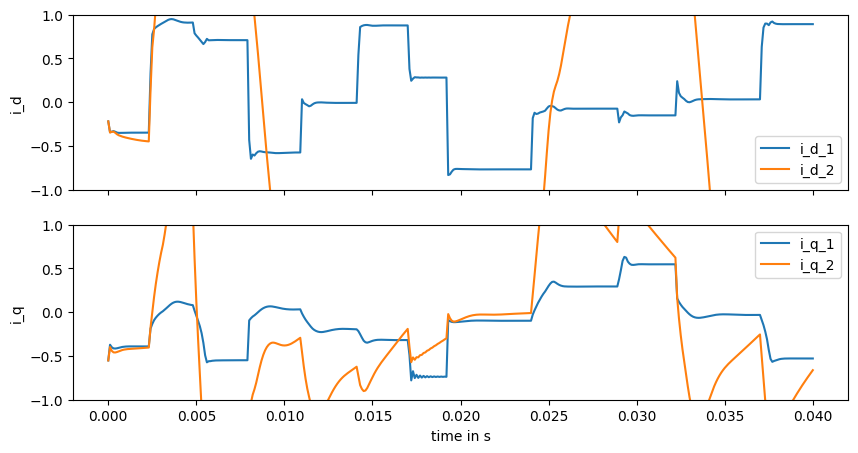

 22%|██▏       | 65975/300000 [03:50<12:18, 317.00it/s]

Current val_loss: 7.849109339051147


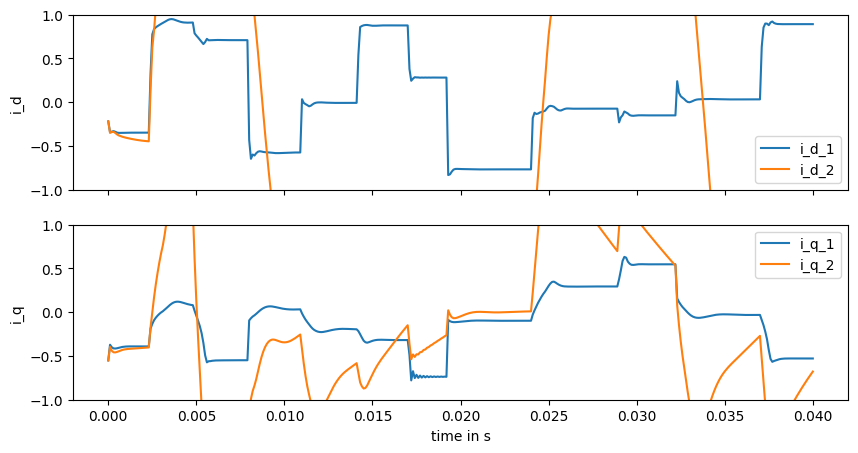

 23%|██▎       | 67976/300000 [03:57<11:52, 325.65it/s]

Current val_loss: 7.650081340538919


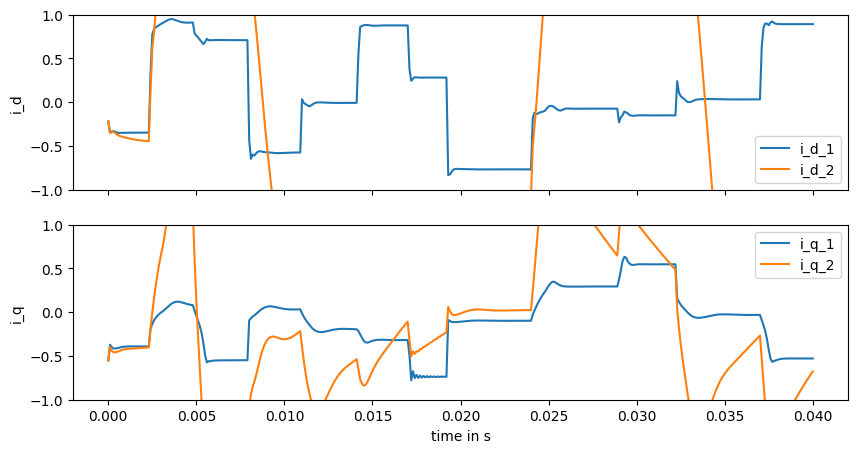

 23%|██▎       | 69981/300000 [04:04<11:53, 322.39it/s]

Current val_loss: 7.463435114036644


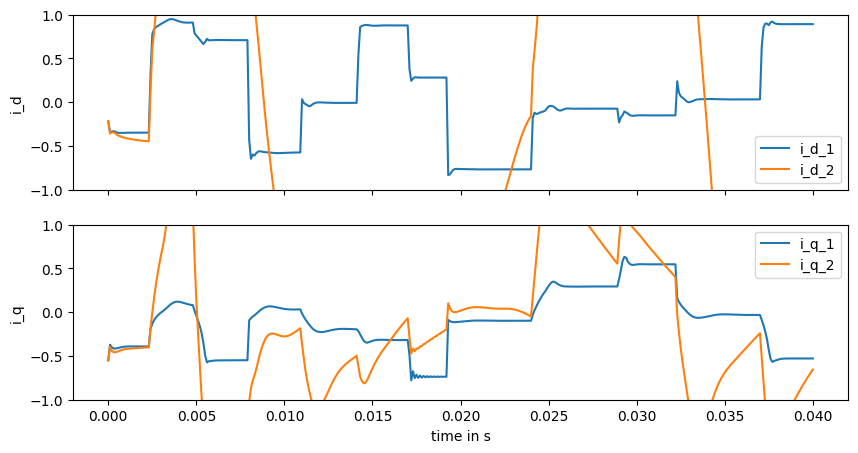

 24%|██▍       | 71990/300000 [04:11<11:50, 320.77it/s]

Current val_loss: 6.884089013911907


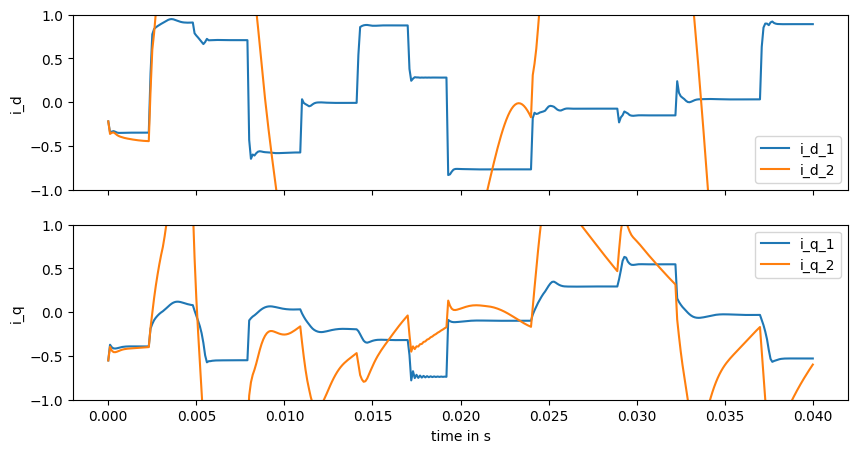

 25%|██▍       | 73969/300000 [04:17<11:31, 326.76it/s]

Current val_loss: 6.301732975998964


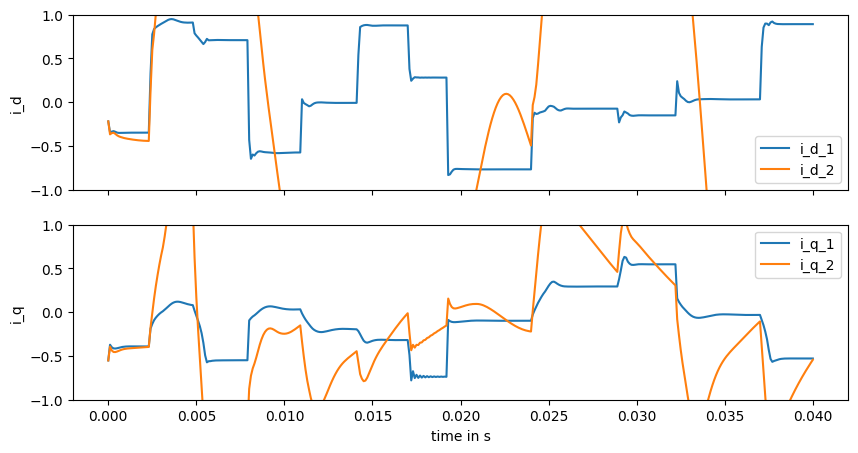

 25%|██▌       | 75978/300000 [04:24<11:34, 322.49it/s]

Current val_loss: 5.88729552667167


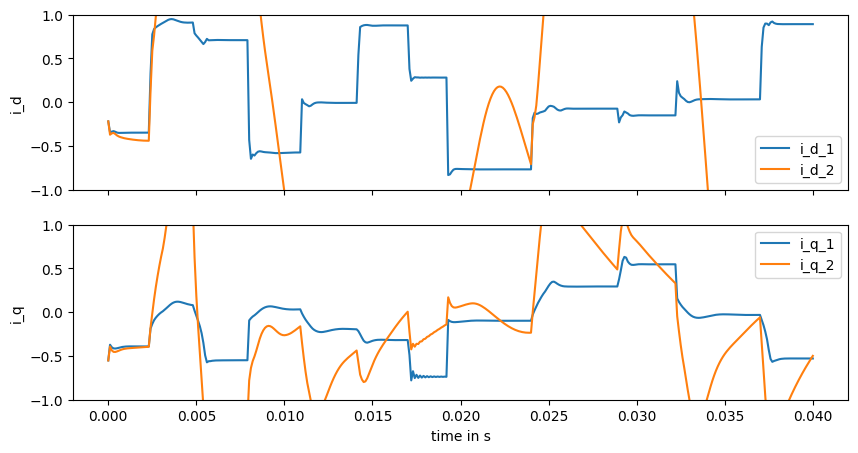

 26%|██▌       | 77989/300000 [04:31<11:28, 322.27it/s]

Current val_loss: 5.755502232960836


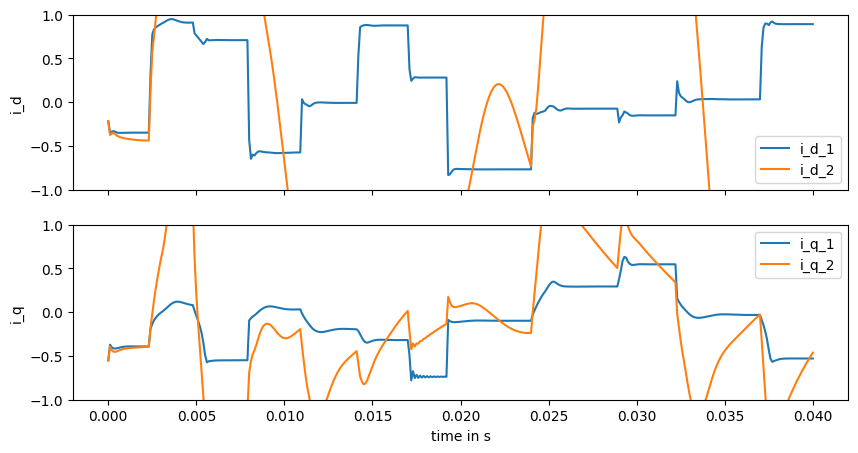

 27%|██▋       | 79987/300000 [04:38<11:25, 320.95it/s]

Current val_loss: 5.785321810810724


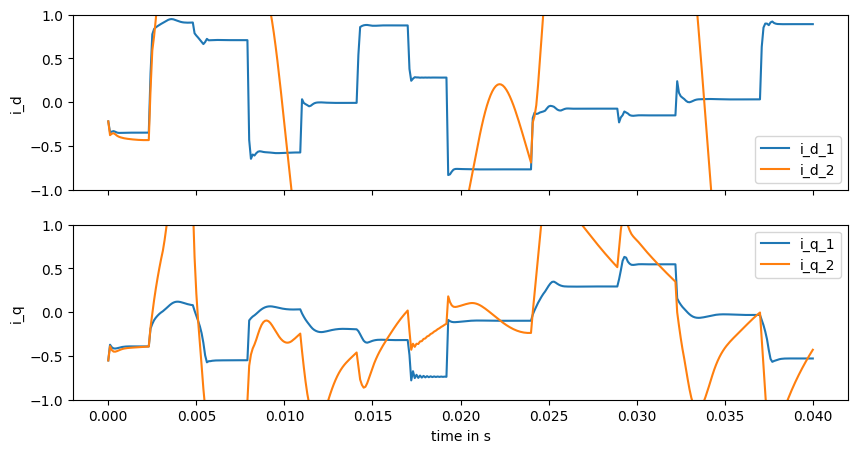

 27%|██▋       | 81992/300000 [04:45<11:20, 320.33it/s]

Current val_loss: 5.6759558102780385


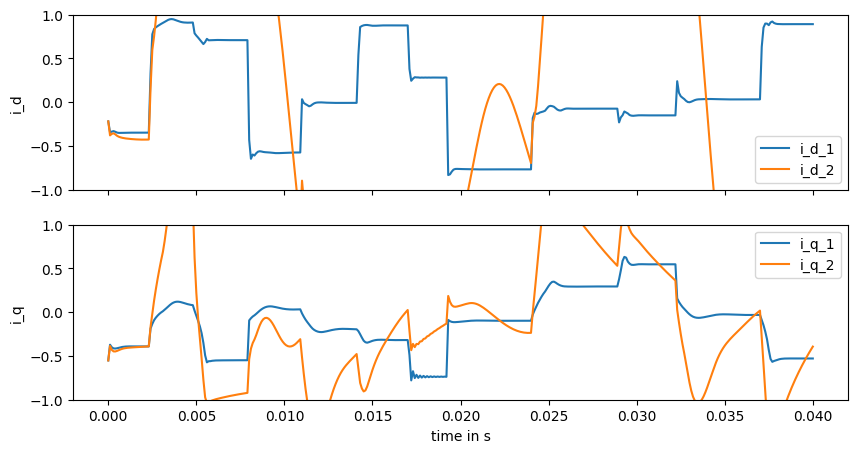

 28%|██▊       | 83998/300000 [04:52<11:14, 320.35it/s]

Current val_loss: 5.6096704625547025


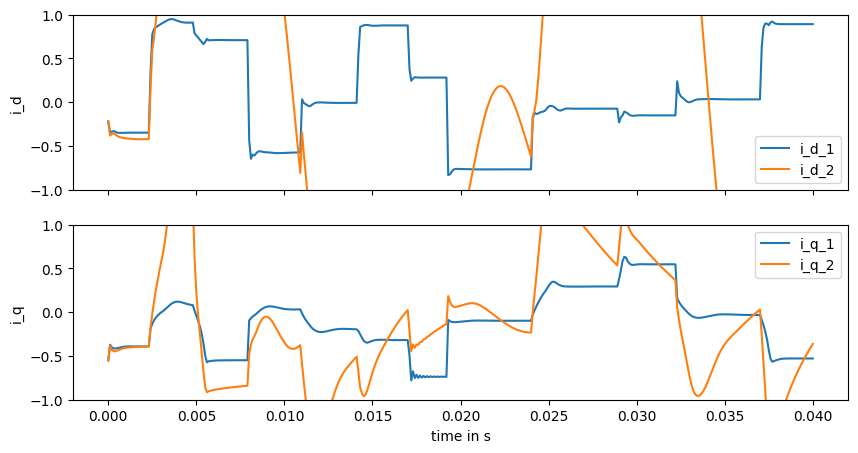

 29%|██▊       | 85973/300000 [04:59<11:09, 319.81it/s]

Current val_loss: 5.53505707403712


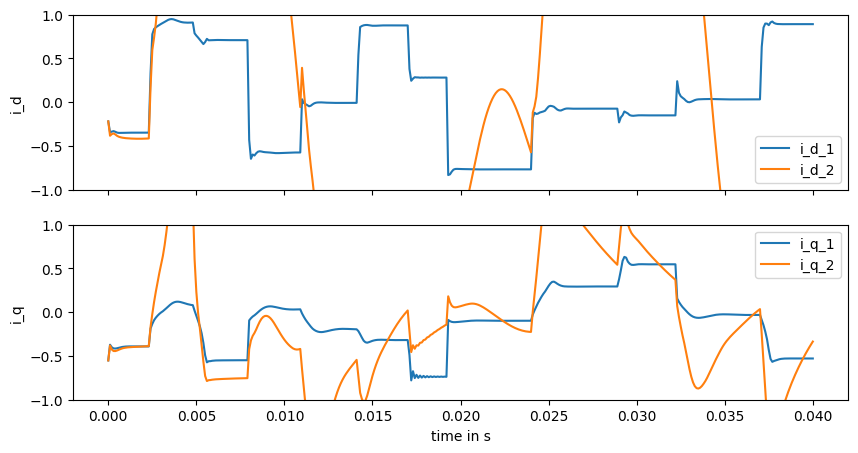

 29%|██▉       | 87978/300000 [05:06<11:01, 320.50it/s]

Current val_loss: 5.42920177797379


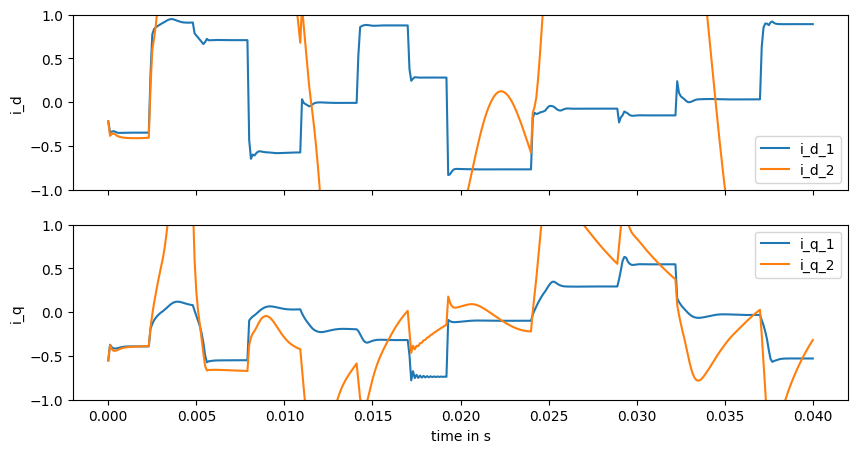

 30%|██▉       | 89989/300000 [05:13<10:55, 320.62it/s]

Current val_loss: 5.353769189788533


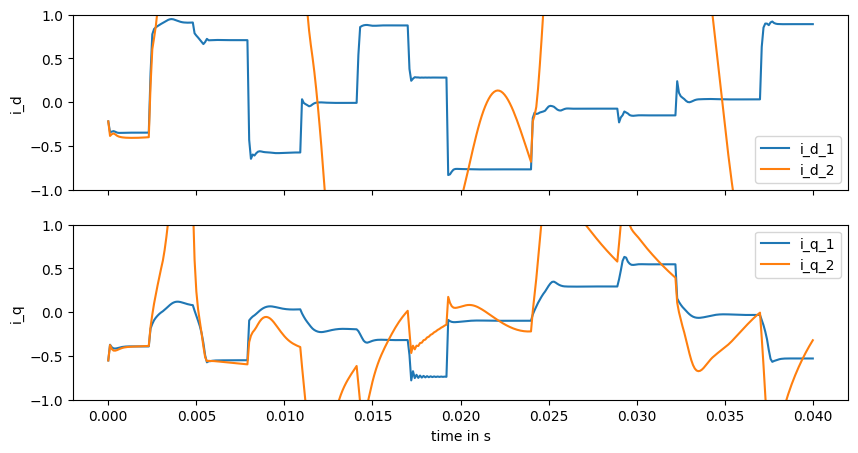

 31%|███       | 91995/300000 [05:20<10:51, 319.20it/s]

Current val_loss: 5.326013575553191


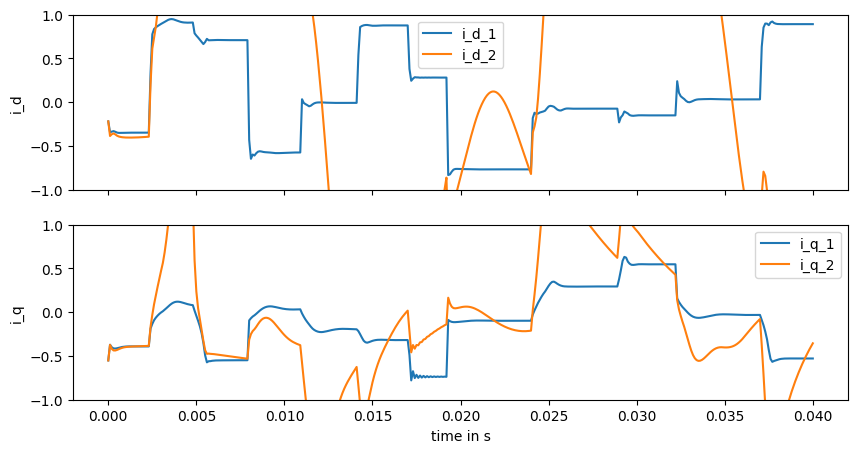

 31%|███▏      | 93993/300000 [05:27<10:42, 320.69it/s]

Current val_loss: 5.3959075647092485


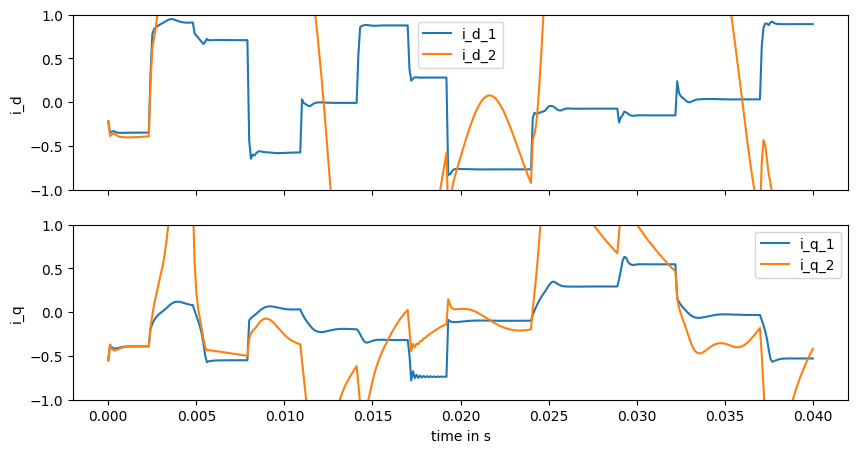

 32%|███▏      | 95971/300000 [05:34<11:09, 304.95it/s]

Current val_loss: 5.325847930762777


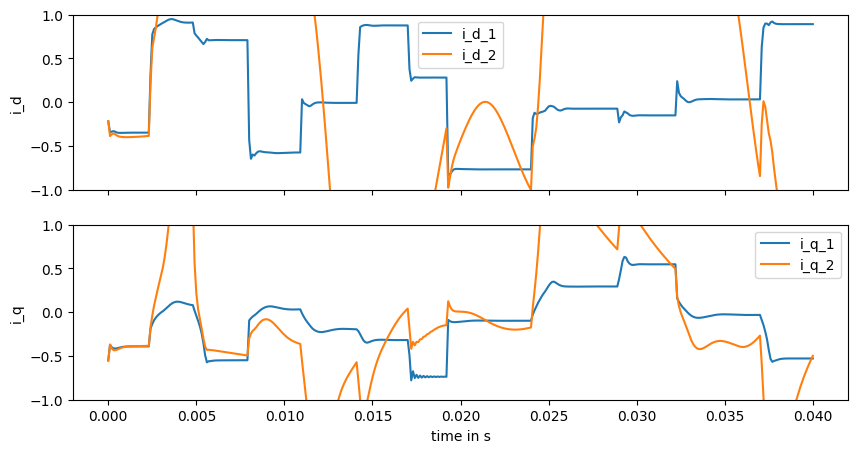

 33%|███▎      | 97970/300000 [05:41<10:57, 307.49it/s]

Current val_loss: 5.313038900747236


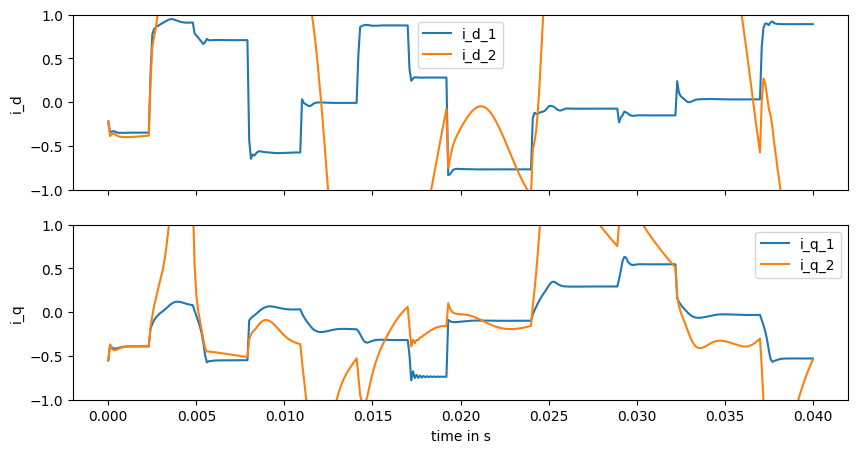

 33%|███▎      | 99991/300000 [05:48<10:22, 321.23it/s]

Current val_loss: 5.2049817018496025


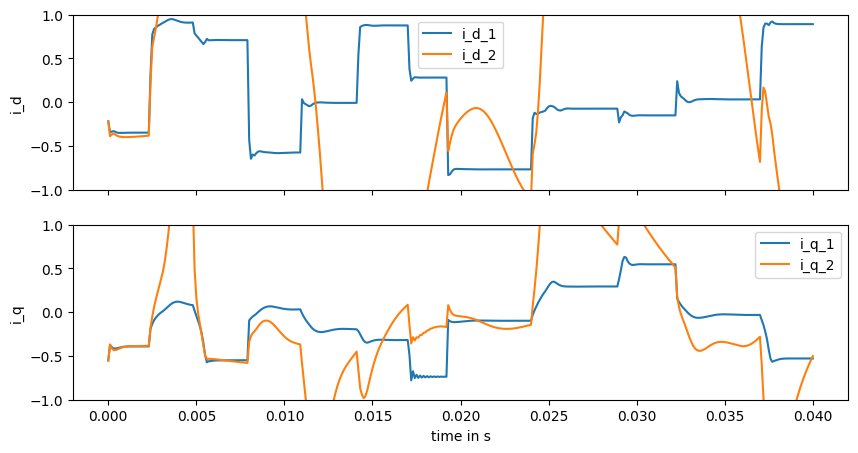

 34%|███▍      | 101970/300000 [05:55<10:15, 321.62it/s]

Current val_loss: 5.077768031237964


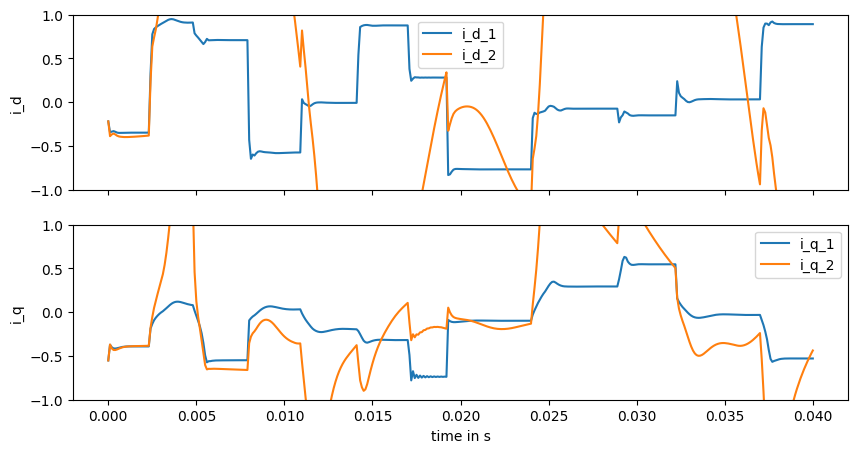

 35%|███▍      | 103975/300000 [06:02<10:13, 319.65it/s]

Current val_loss: 4.842696315193185


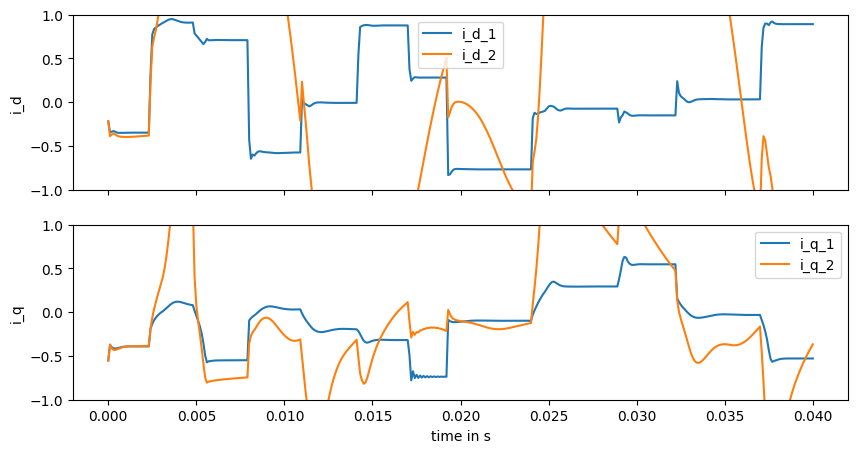

 35%|███▌      | 105992/300000 [06:09<10:16, 314.45it/s]

Current val_loss: 4.4893940291351555


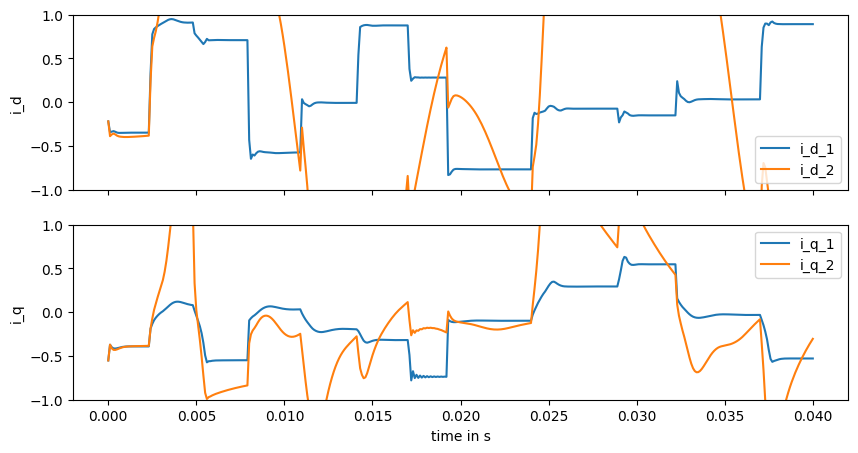

 36%|███▌      | 107990/300000 [06:16<10:00, 319.74it/s]

Current val_loss: 3.9127927039820687


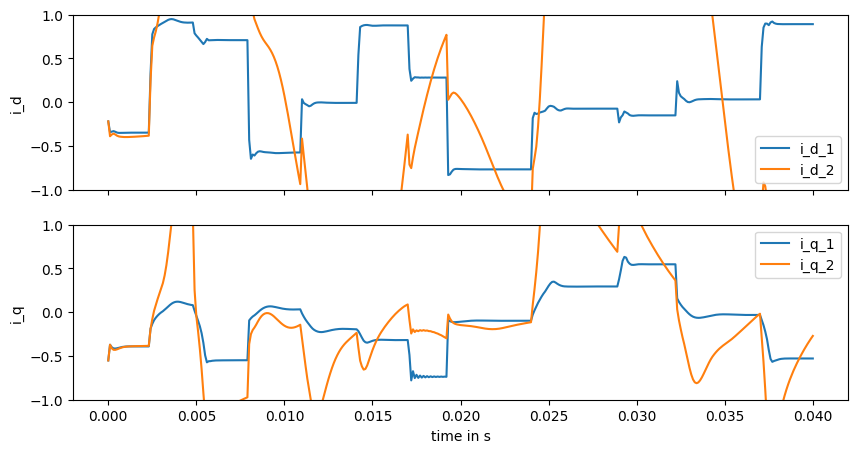

 37%|███▋      | 109975/300000 [06:23<10:07, 313.04it/s]

Current val_loss: 3.149114118637943


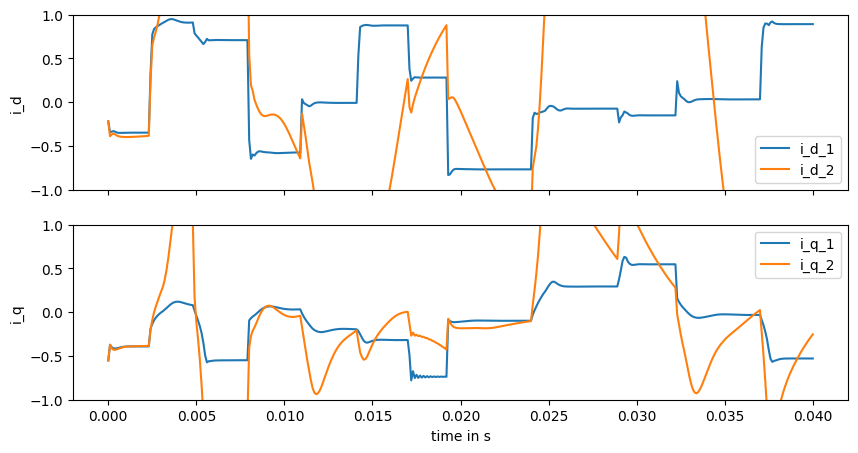

 37%|███▋      | 111991/300000 [06:30<09:54, 316.09it/s]

Current val_loss: 2.7028165353250255


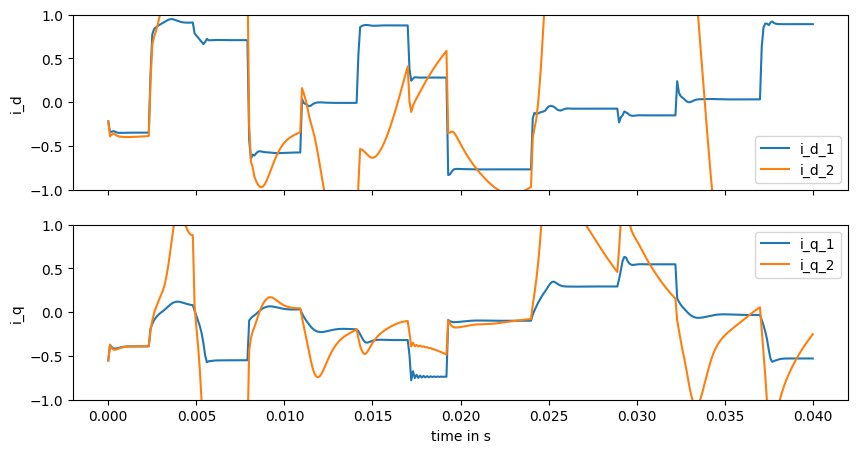

 38%|███▊      | 113983/300000 [06:37<09:44, 318.36it/s]

Current val_loss: 2.46132849883191


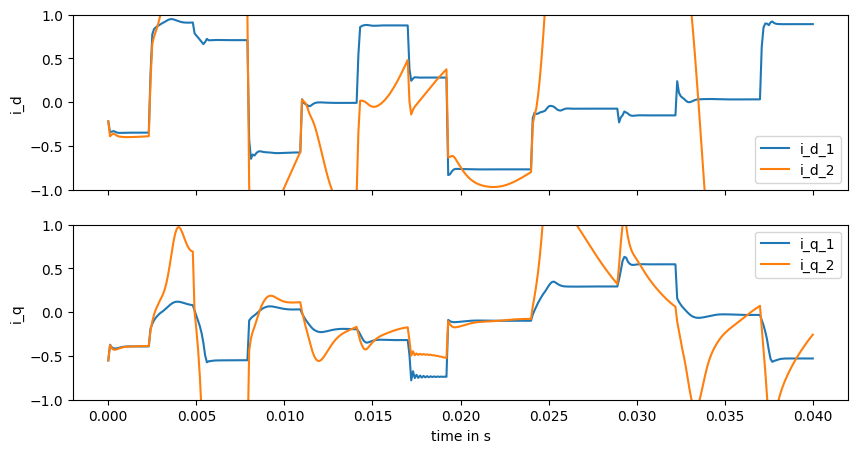

 39%|███▊      | 115971/300000 [06:43<09:42, 315.78it/s]

Current val_loss: 2.324325565648879


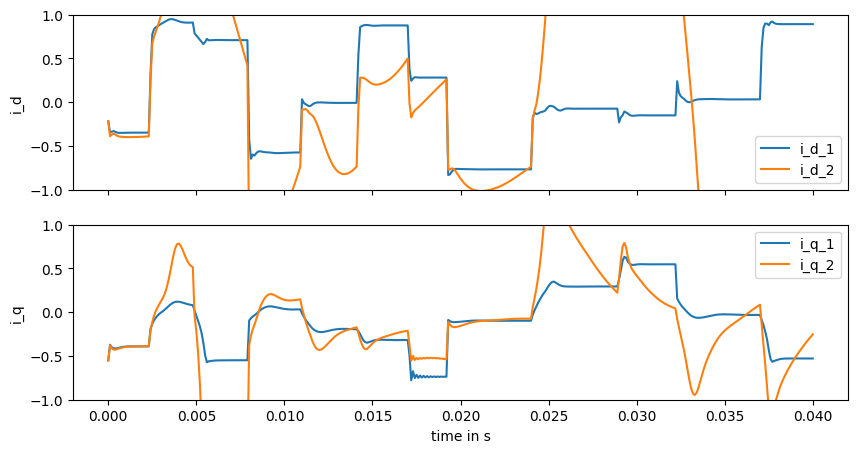

 39%|███▉      | 117991/300000 [06:50<09:31, 318.47it/s]

Current val_loss: 2.14815864388923


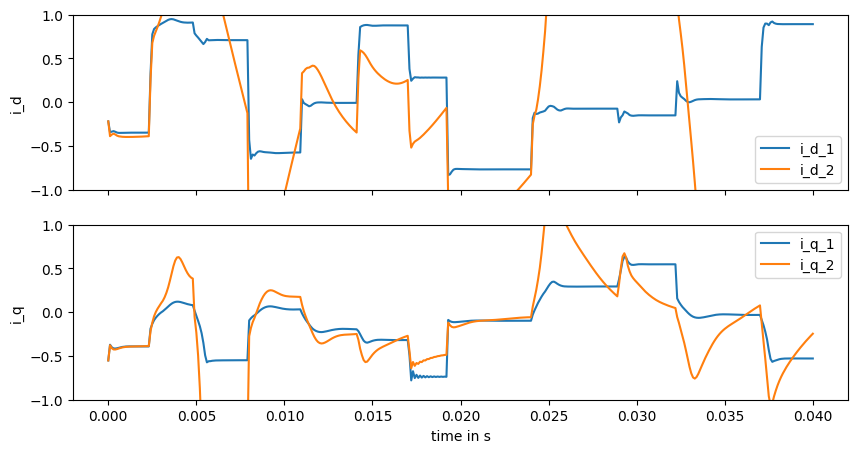

 40%|███▉      | 119977/300000 [06:57<09:34, 313.16it/s]

Current val_loss: 1.3494812033225225


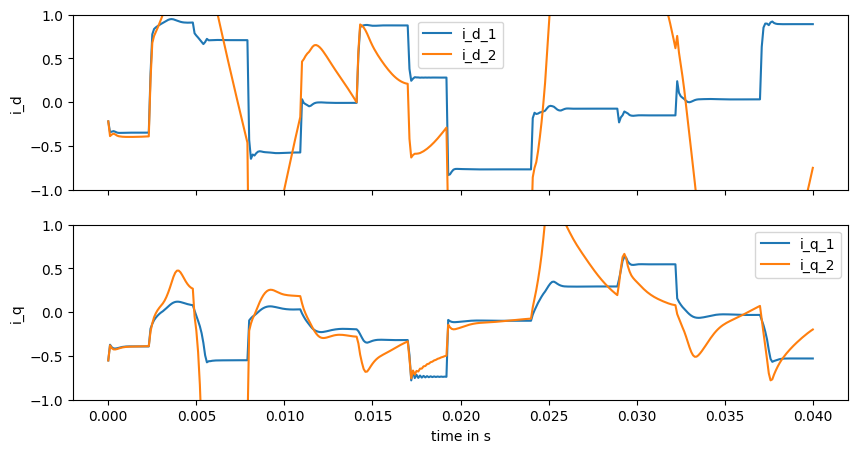

 41%|████      | 121991/300000 [07:04<09:22, 316.53it/s]

Current val_loss: 0.8130761842374264


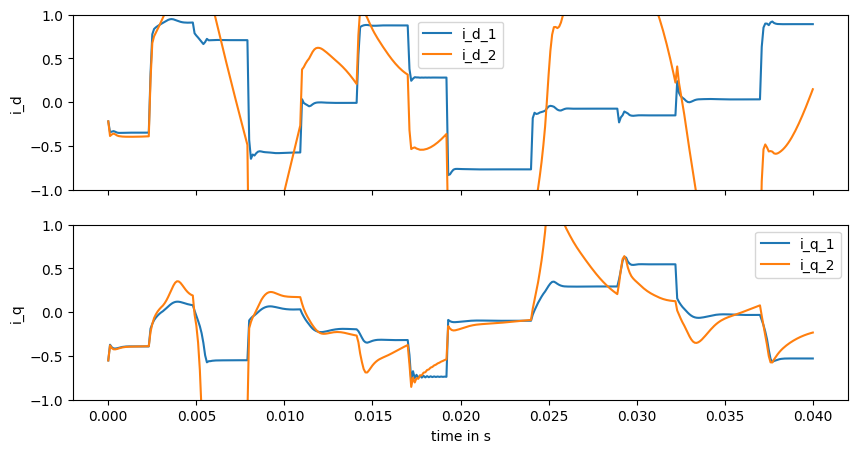

 41%|████▏     | 123976/300000 [07:11<09:14, 317.58it/s]

Current val_loss: 0.554244766639487


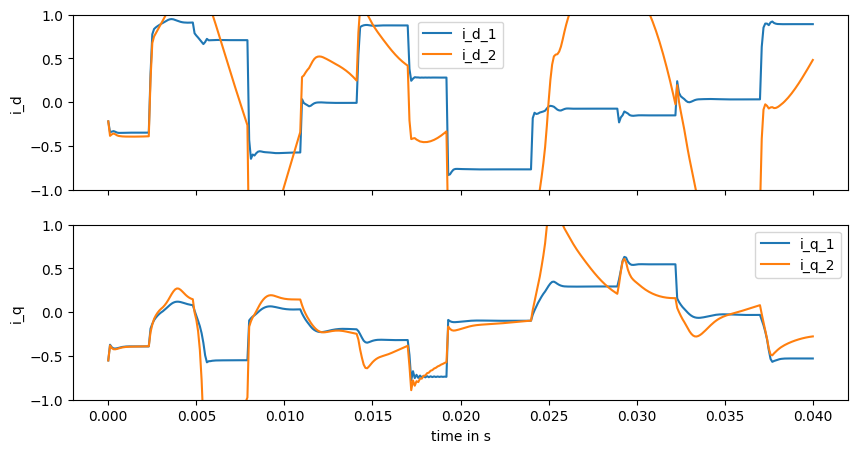

 42%|████▏     | 125994/300000 [07:19<09:13, 314.59it/s]

Current val_loss: 0.34564409836789967


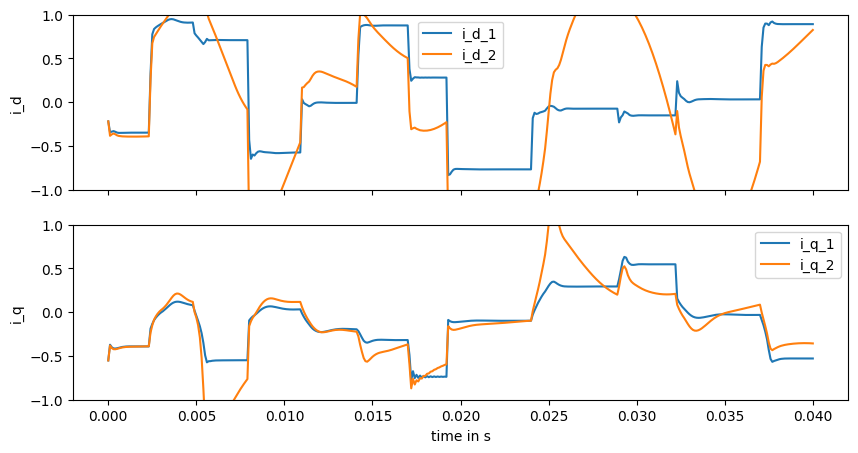

 43%|████▎     | 127975/300000 [07:27<09:07, 314.09it/s]

Current val_loss: 0.24701579203009646


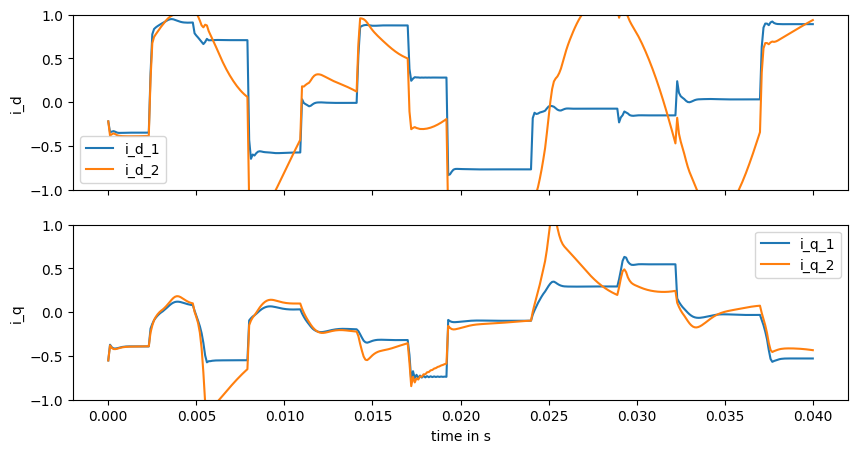

 43%|████▎     | 129991/300000 [07:34<08:55, 317.61it/s]

Current val_loss: 0.1857621300103318


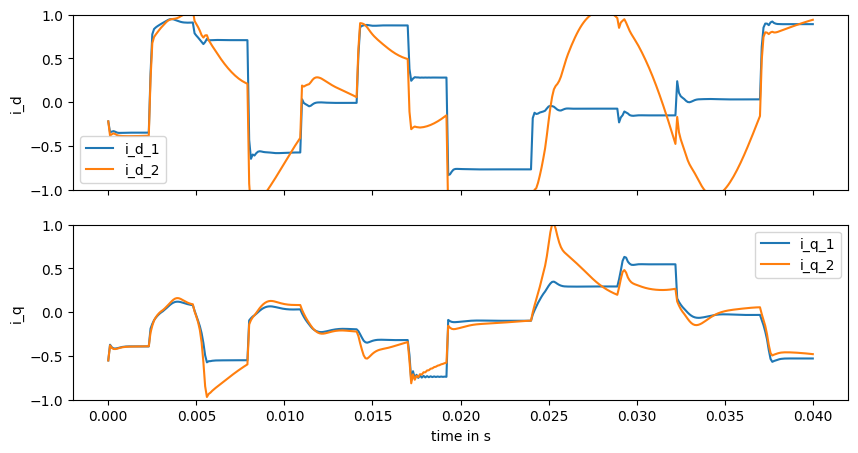

 44%|████▍     | 131998/300000 [07:41<08:33, 327.35it/s]

Current val_loss: 0.12671542270457548


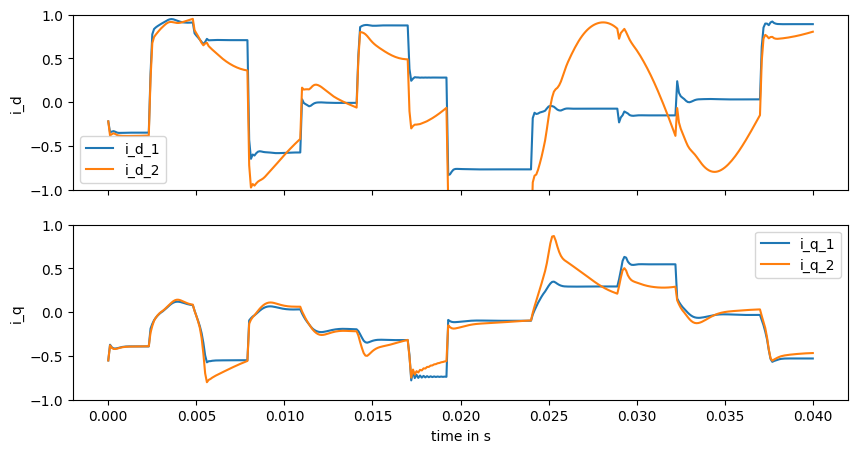

 45%|████▍     | 133989/300000 [07:48<08:43, 316.94it/s]

Current val_loss: 0.0995547218097004


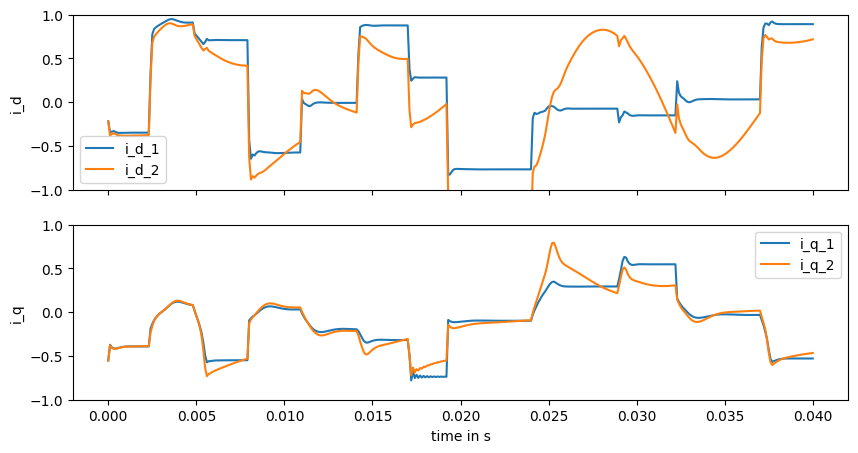

 45%|████▌     | 135973/300000 [07:55<08:37, 317.16it/s]

Current val_loss: 0.08374543247686377


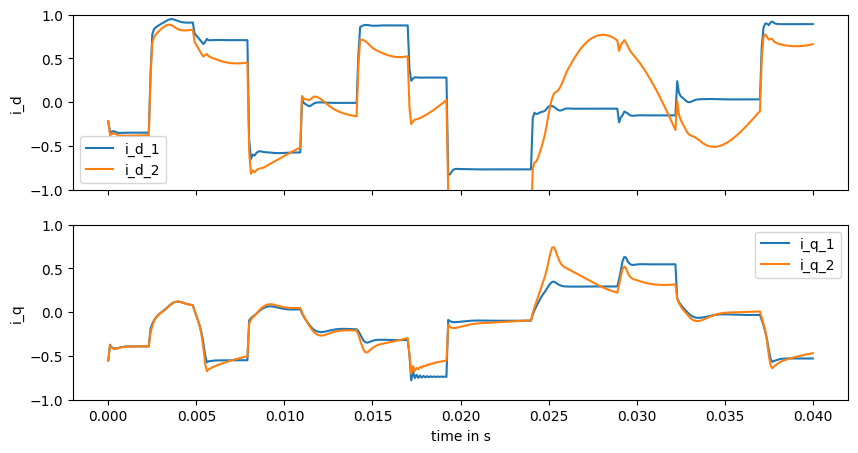

 46%|████▌     | 137983/300000 [08:02<08:37, 312.89it/s]

Current val_loss: 0.06962443900471381


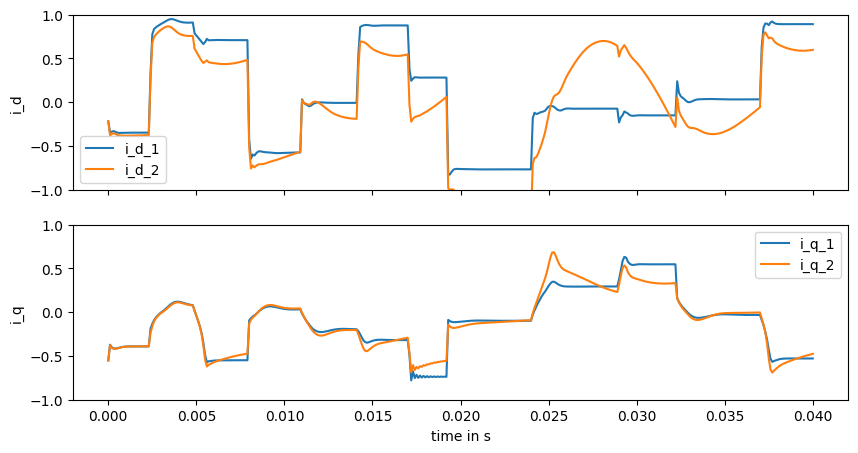

 47%|████▋     | 139997/300000 [08:09<08:27, 314.99it/s]

Current val_loss: 0.06292216985165733


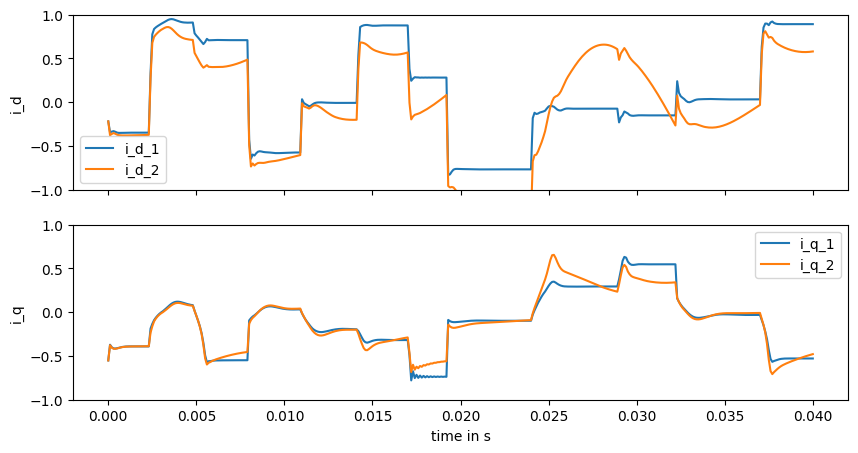

 47%|████▋     | 141991/300000 [08:16<08:26, 311.83it/s]

Current val_loss: 0.05878113462468728


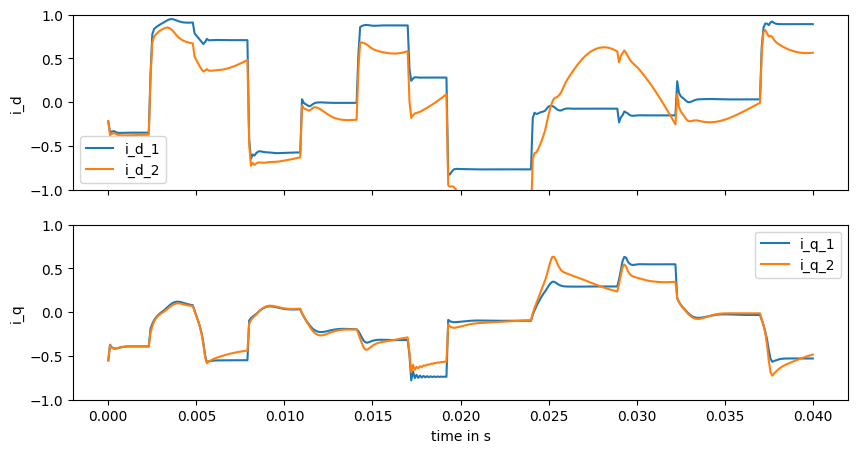

 48%|████▊     | 143975/300000 [08:23<08:13, 316.17it/s]

Current val_loss: 0.05667468989054861


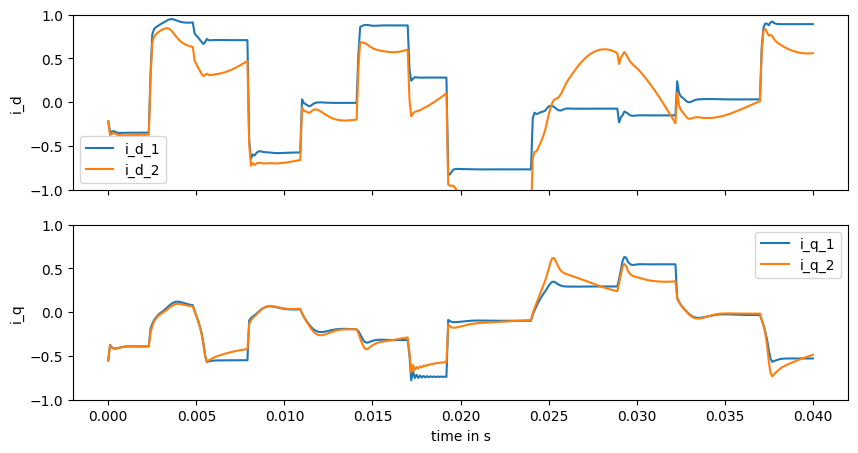

 49%|████▊     | 145984/300000 [08:30<08:17, 309.81it/s]

Current val_loss: 0.05279170590800172


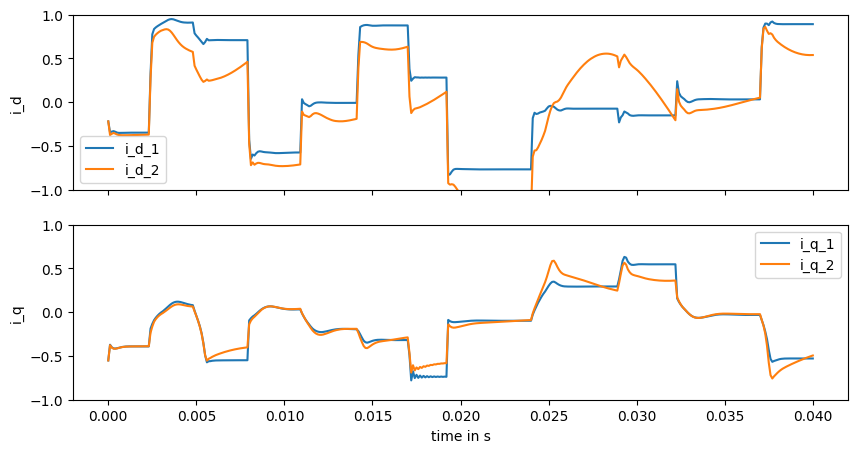

 49%|████▉     | 147979/300000 [08:37<07:58, 317.38it/s]

Current val_loss: 0.05044735600190209


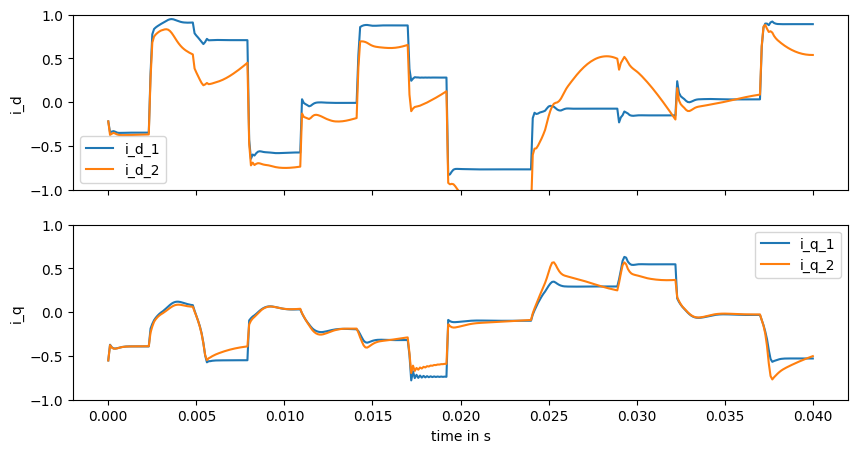

 50%|████▉     | 149981/300000 [08:44<07:45, 321.98it/s]

Current val_loss: 0.049885042605363916


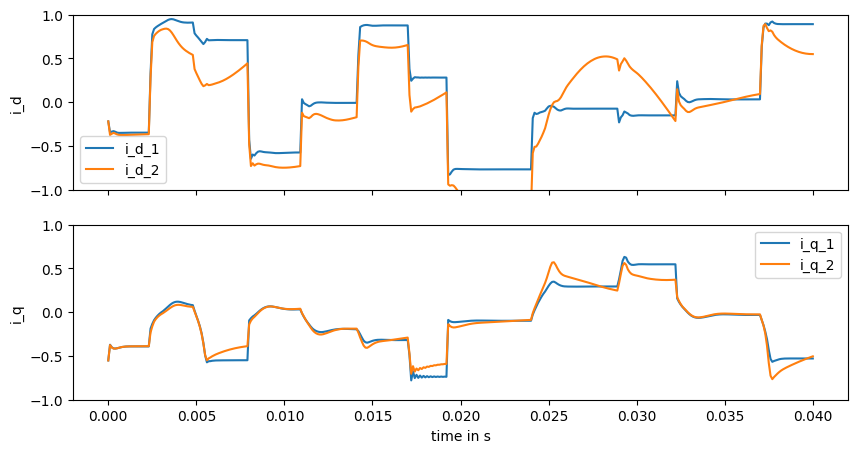

 51%|█████     | 151994/300000 [08:51<07:42, 319.78it/s]

Current val_loss: 0.05009310737635884


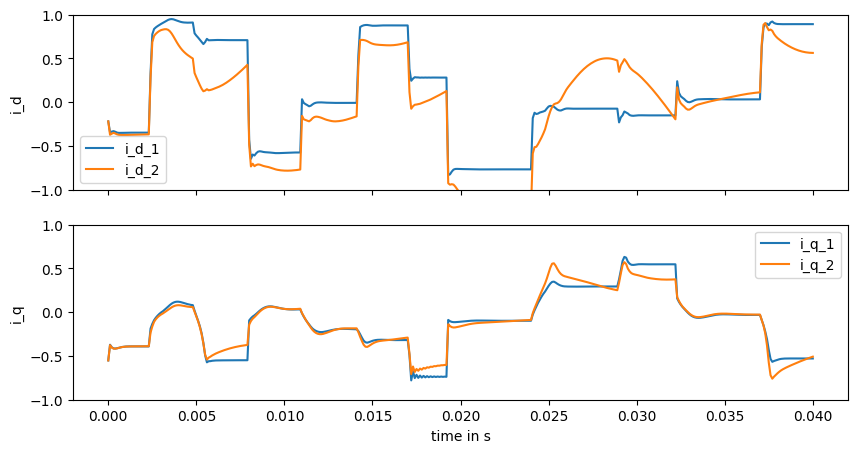

 51%|█████▏    | 153978/300000 [08:58<07:44, 314.51it/s]

Current val_loss: 0.0494388144064003


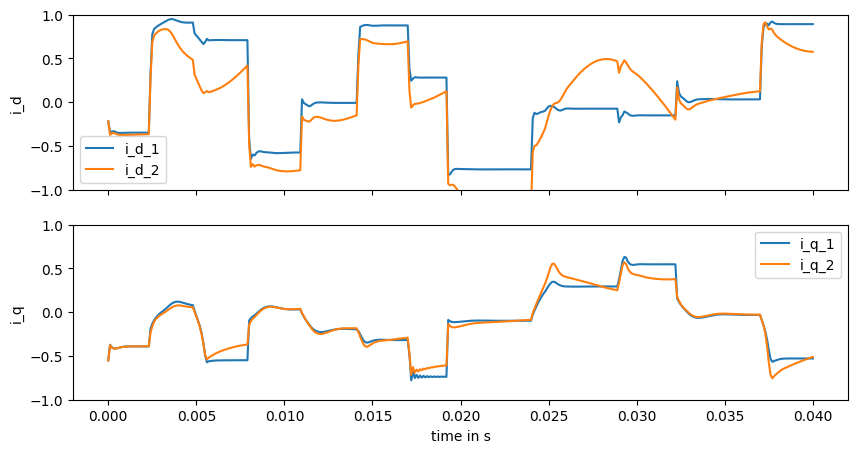

 52%|█████▏    | 155979/300000 [09:05<07:28, 321.20it/s]

Current val_loss: 0.046383096223598555


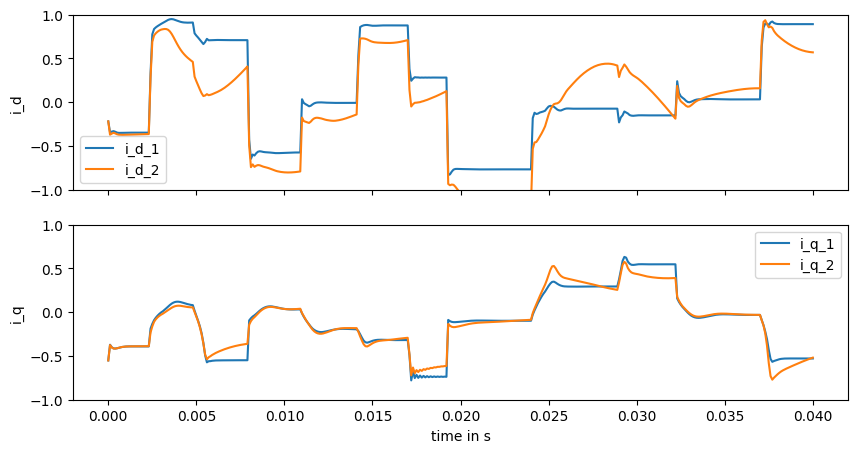

 53%|█████▎    | 157974/300000 [09:12<07:47, 303.52it/s]

Current val_loss: 0.04742970240032923


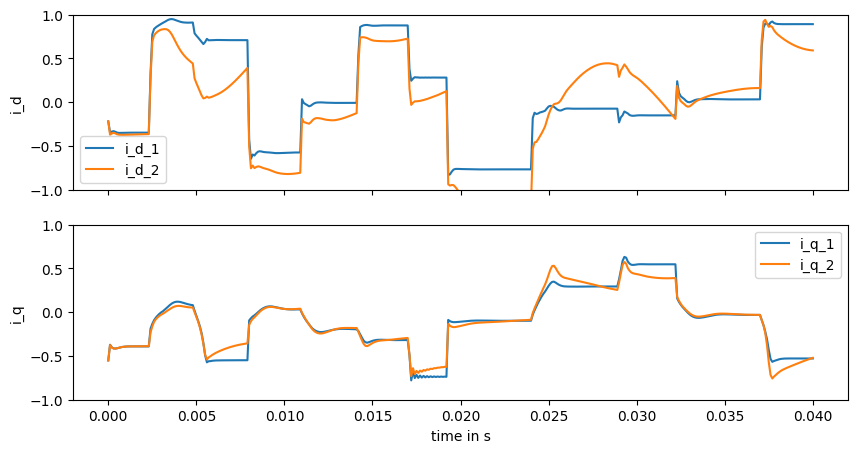

 53%|█████▎    | 159975/300000 [09:19<07:16, 320.55it/s]

Current val_loss: 0.04655289979961996


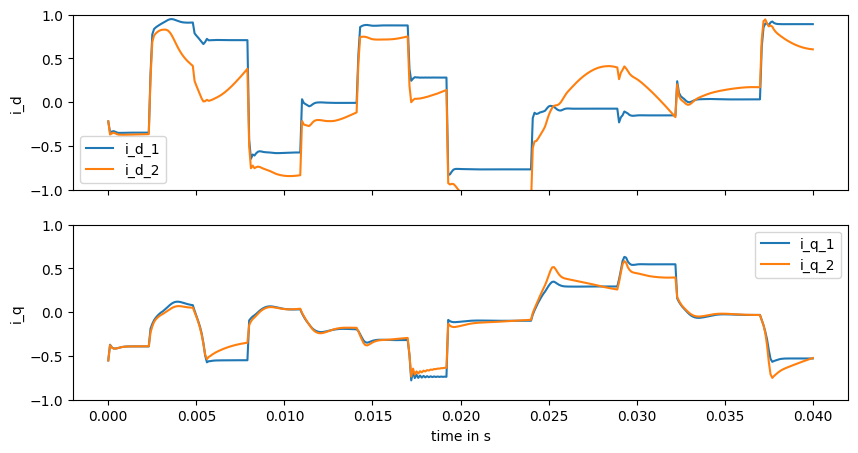

 54%|█████▍    | 161980/300000 [09:26<07:11, 319.79it/s]

Current val_loss: 0.04445805176395452


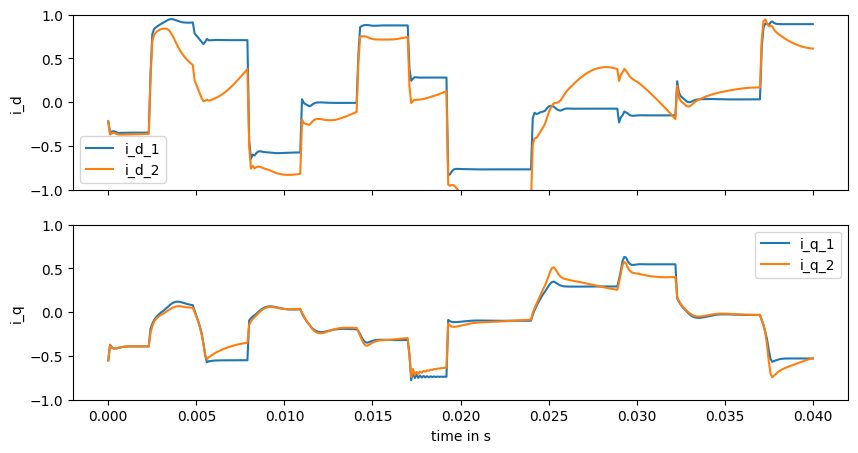

 55%|█████▍    | 163982/300000 [09:33<07:09, 316.44it/s]

Current val_loss: 0.04250169795084515


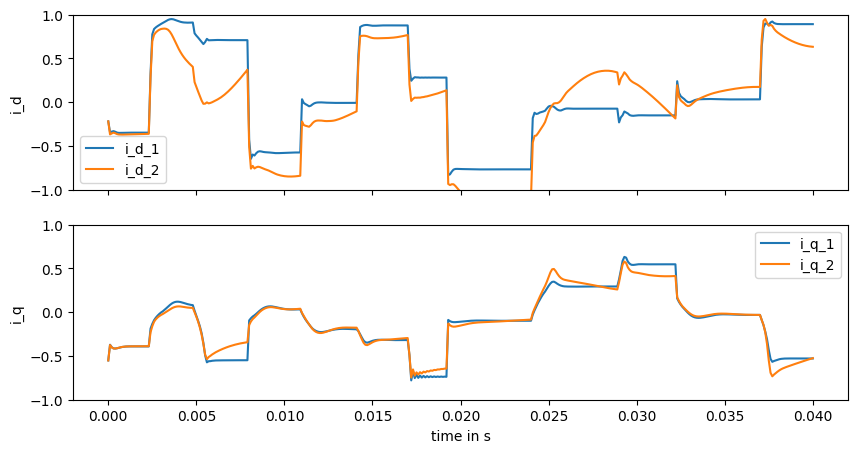

 55%|█████▌    | 165976/300000 [09:40<07:02, 317.40it/s]

Current val_loss: 0.040368376210740214


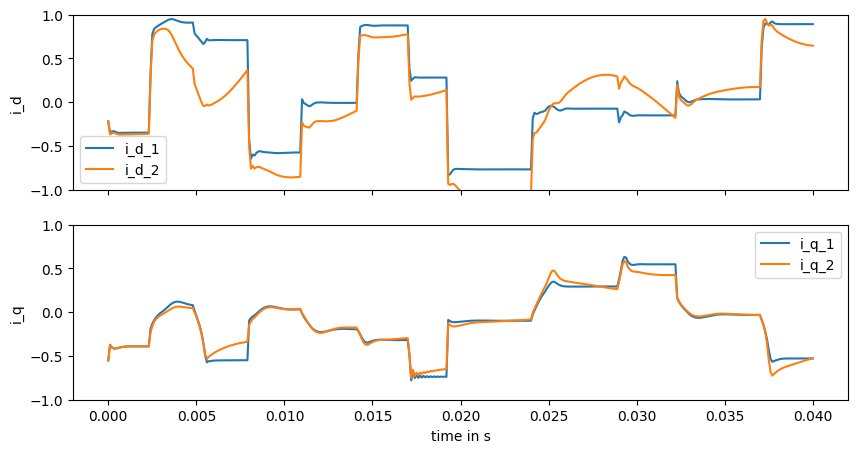

 56%|█████▌    | 167987/300000 [09:47<07:01, 313.39it/s]

Current val_loss: 0.04169975705508158


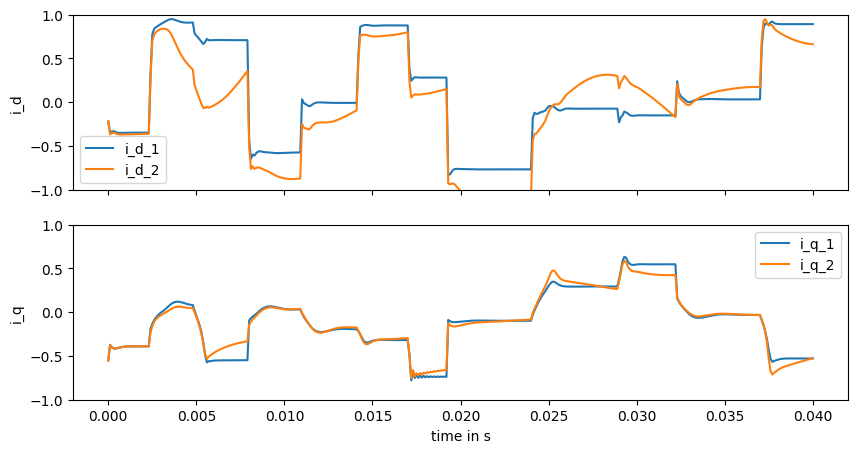

 57%|█████▋    | 169971/300000 [09:54<06:48, 318.62it/s]

Current val_loss: 0.042837985936337086


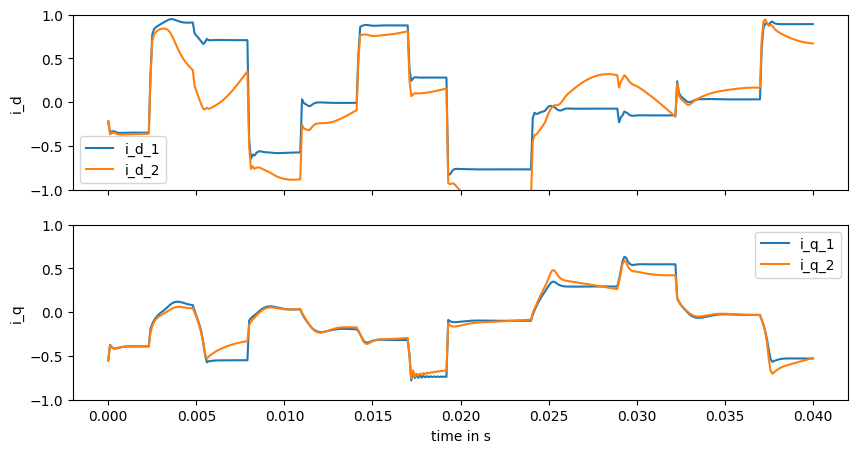

 57%|█████▋    | 171986/300000 [10:01<06:42, 318.05it/s]

Current val_loss: 0.04488675409363103


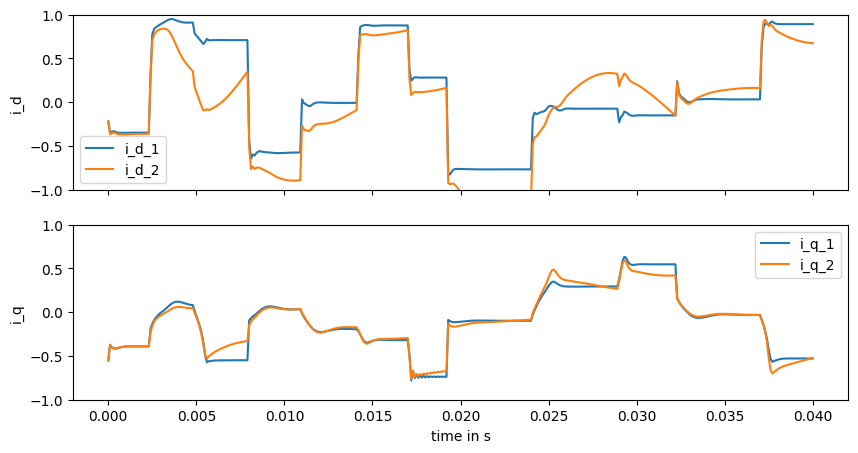

 58%|█████▊    | 173992/300000 [10:08<06:45, 311.03it/s]

Current val_loss: 0.04423810933579321


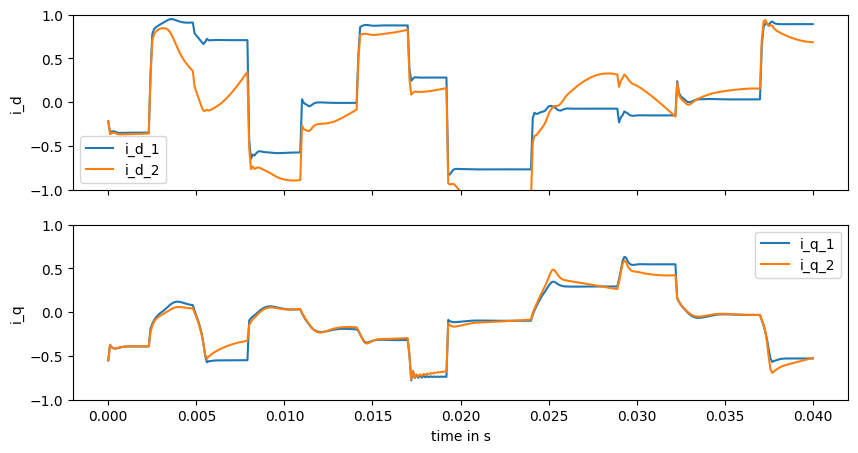

 59%|█████▊    | 175984/300000 [10:15<06:39, 310.47it/s]

Current val_loss: 0.045732483644210044


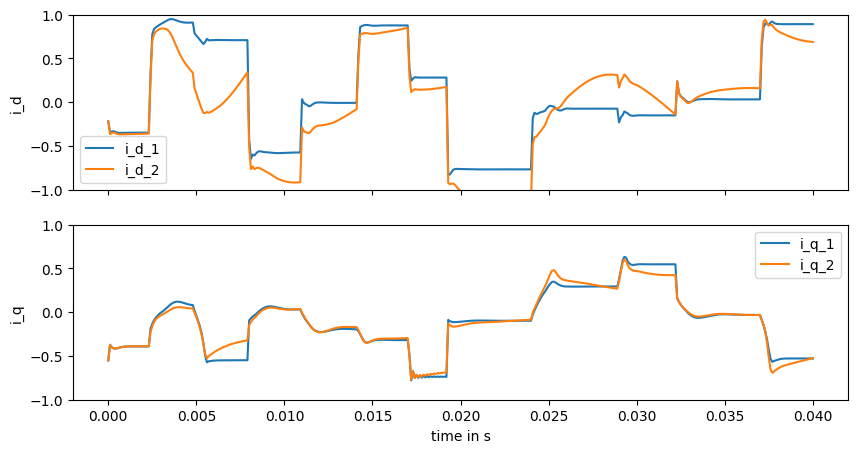

 59%|█████▉    | 177984/300000 [10:22<06:27, 314.65it/s]

Current val_loss: 0.047670029629312584


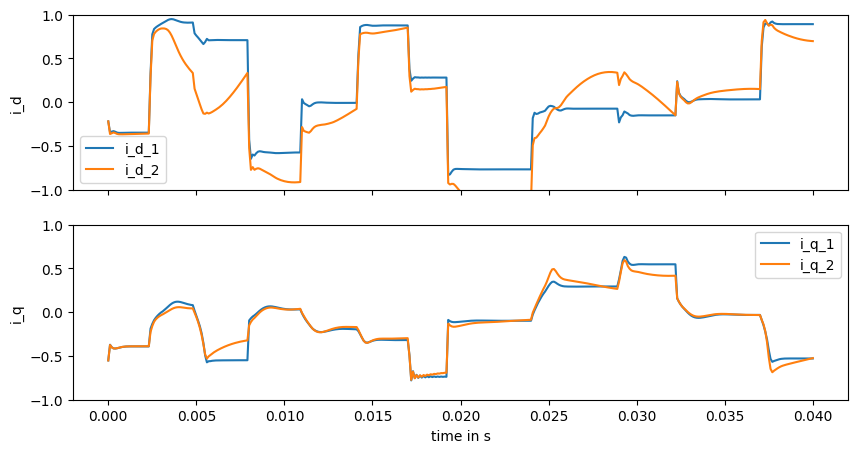

 60%|█████▉    | 179970/300000 [10:29<06:19, 316.65it/s]

Current val_loss: 0.04621835573558326


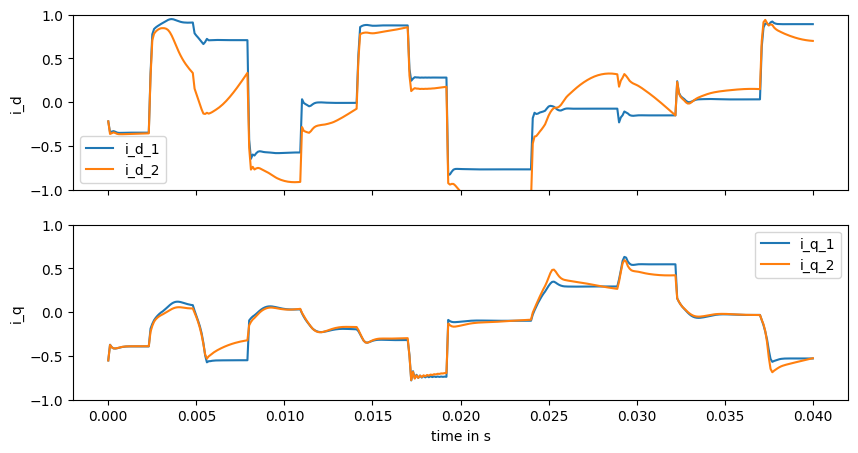

 61%|██████    | 181986/300000 [10:36<06:13, 316.16it/s]

Current val_loss: 0.04912002527912983


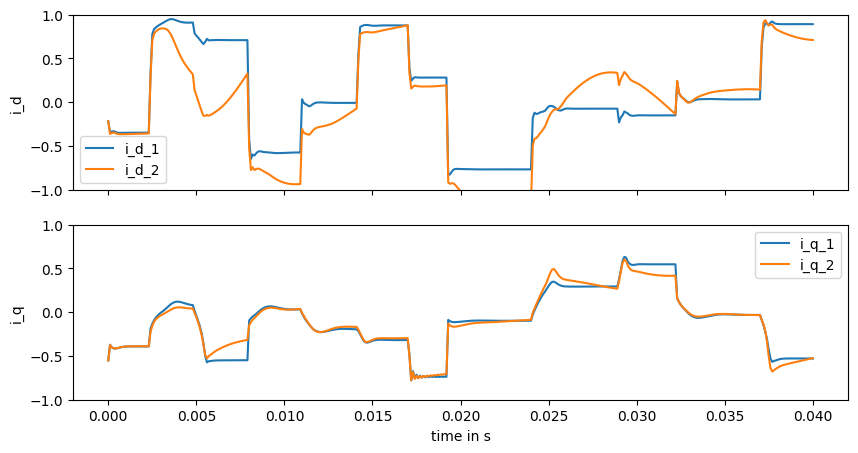

 61%|██████▏   | 183969/300000 [10:43<06:07, 316.02it/s]

Current val_loss: 0.05042500126784324


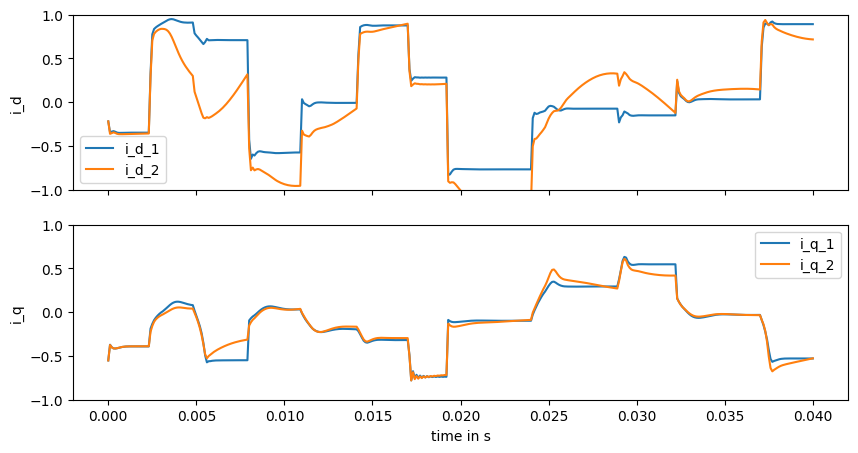

 62%|██████▏   | 185984/300000 [10:50<06:03, 313.74it/s]

Current val_loss: 0.05294951723626539


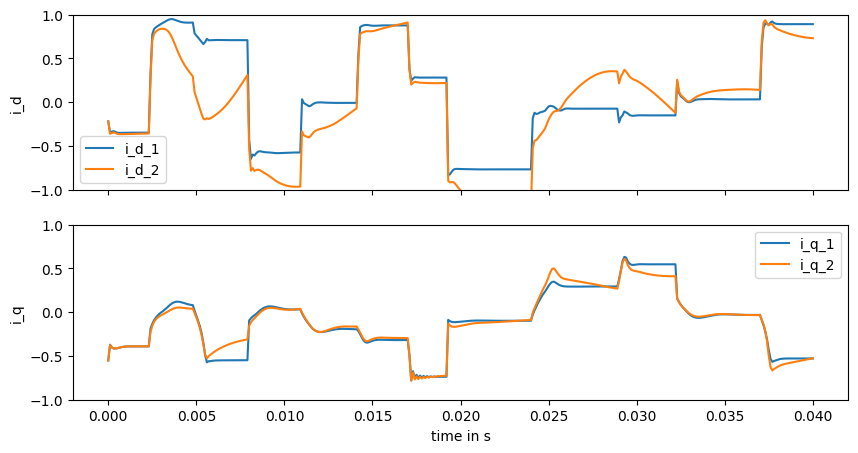

 63%|██████▎   | 187970/300000 [10:57<05:52, 317.64it/s]

Current val_loss: 0.0505237313061907


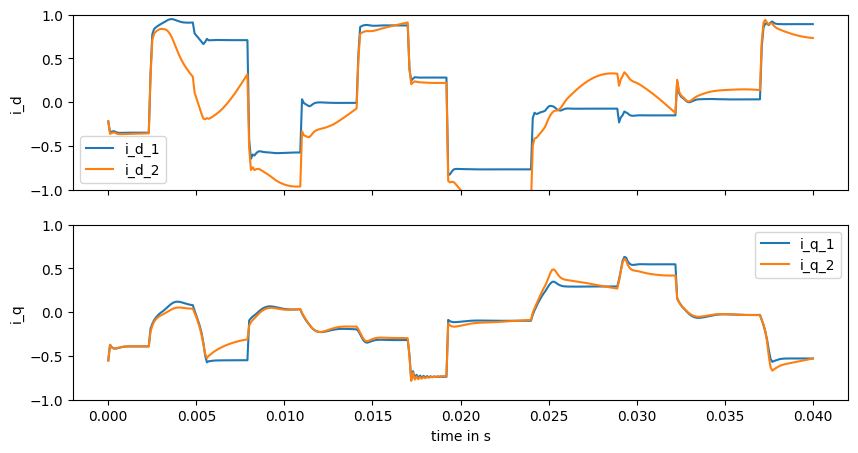

 63%|██████▎   | 189992/300000 [11:04<05:46, 317.85it/s]

Current val_loss: 0.05144737312432255


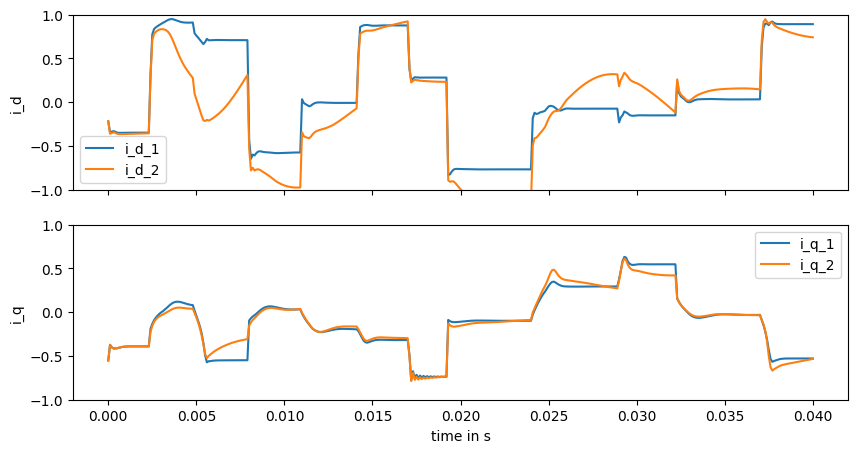

 64%|██████▍   | 191976/300000 [11:11<05:48, 310.40it/s]

Current val_loss: 0.05551668866186259


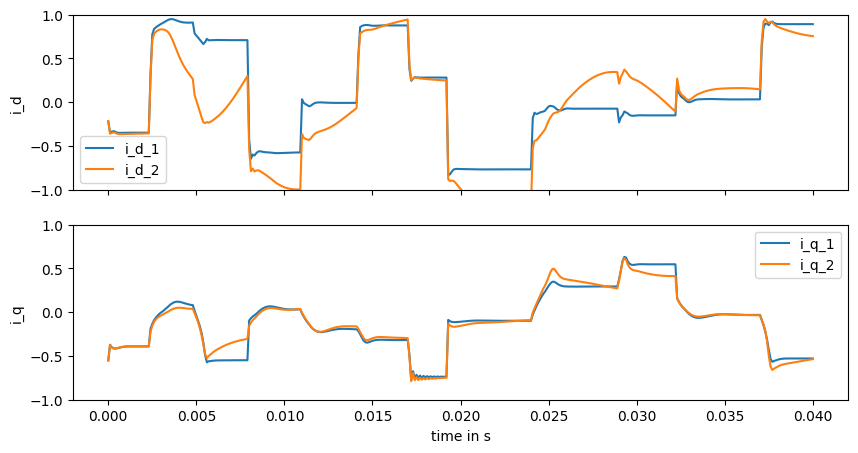

 65%|██████▍   | 193974/300000 [11:18<05:28, 322.36it/s]

Current val_loss: 0.056115114427876644


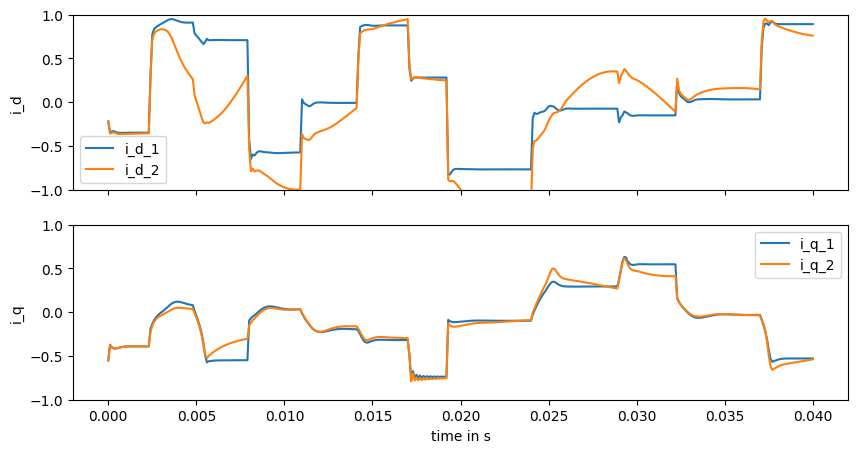

 65%|██████▌   | 195982/300000 [11:27<05:21, 323.30it/s]

Current val_loss: 0.057417653893316836


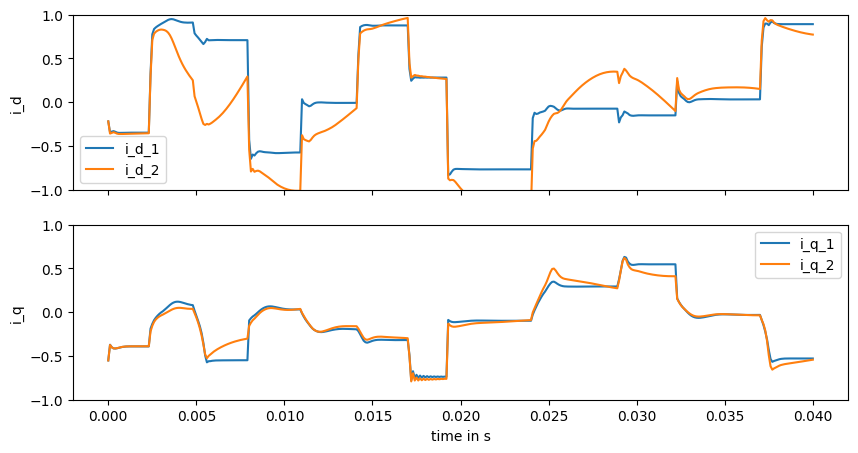

 66%|██████▌   | 197974/300000 [11:34<05:28, 310.58it/s]

Current val_loss: 0.05468174461975504


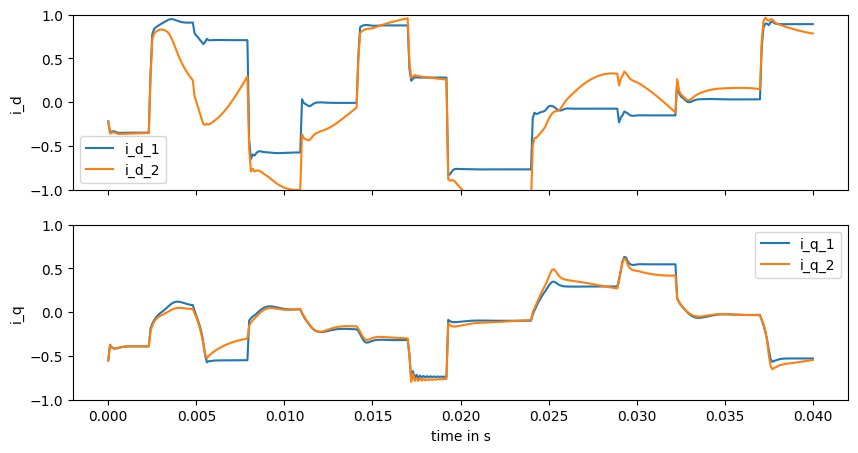

 67%|██████▋   | 199991/300000 [11:41<05:16, 316.33it/s]

Current val_loss: 0.058111868391298595


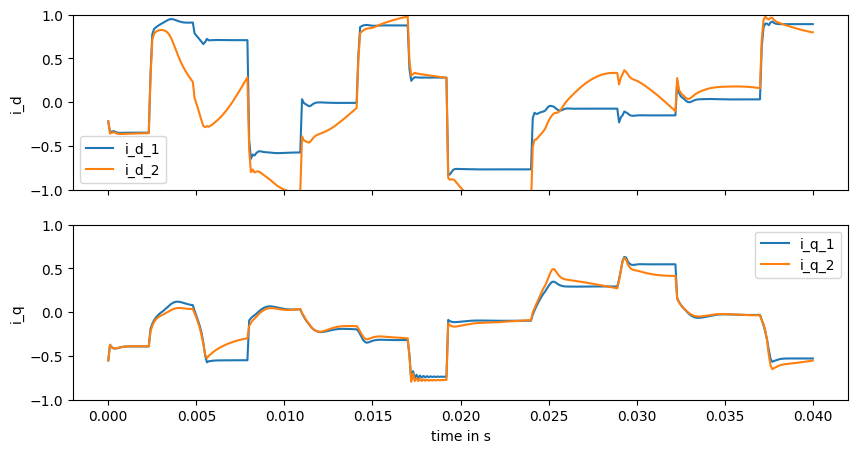

 67%|██████▋   | 201992/300000 [11:48<05:14, 311.49it/s]

Current val_loss: 0.05899759396315627


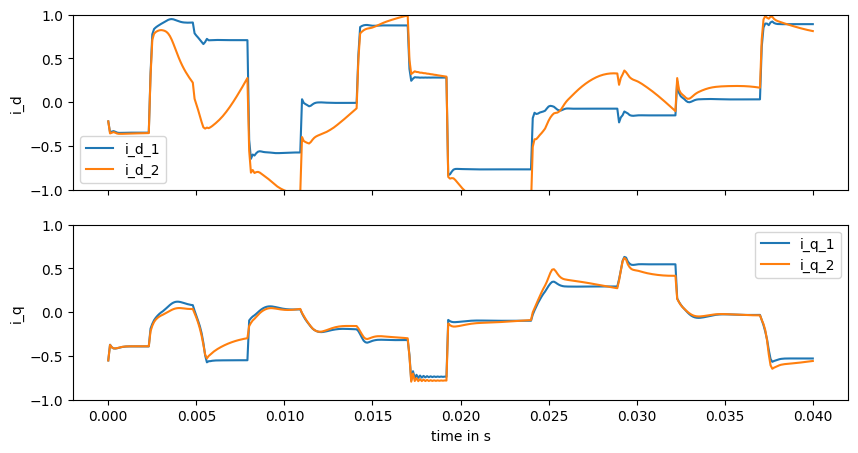

 68%|██████▊   | 203983/300000 [11:55<04:59, 320.35it/s]

Current val_loss: 0.058373445669898896


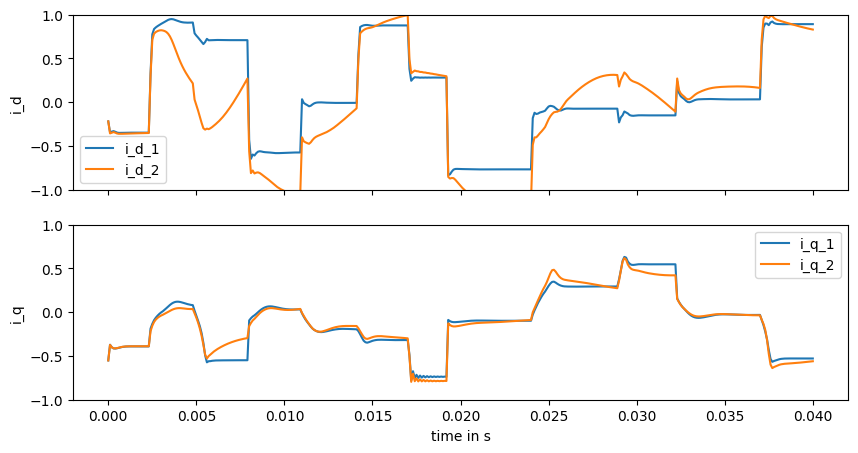

 69%|██████▊   | 205991/300000 [12:02<04:53, 320.37it/s]

Current val_loss: 0.05890926267159976


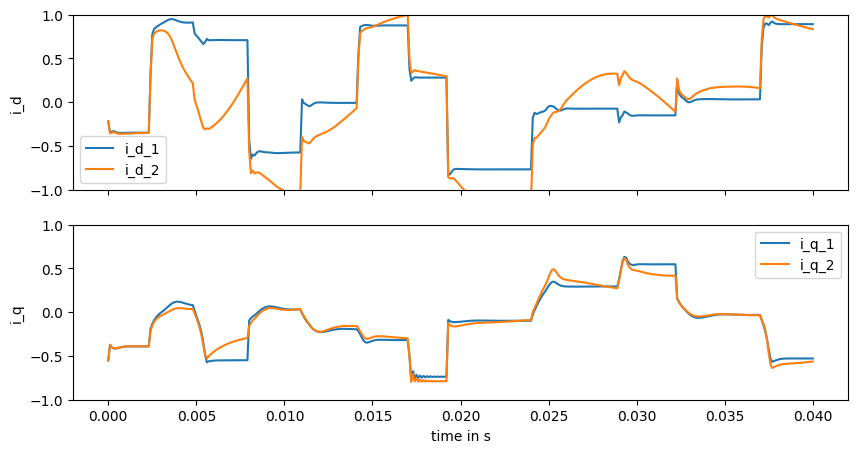

 69%|██████▉   | 207969/300000 [12:08<04:46, 321.65it/s]

Current val_loss: 0.06611981069582526


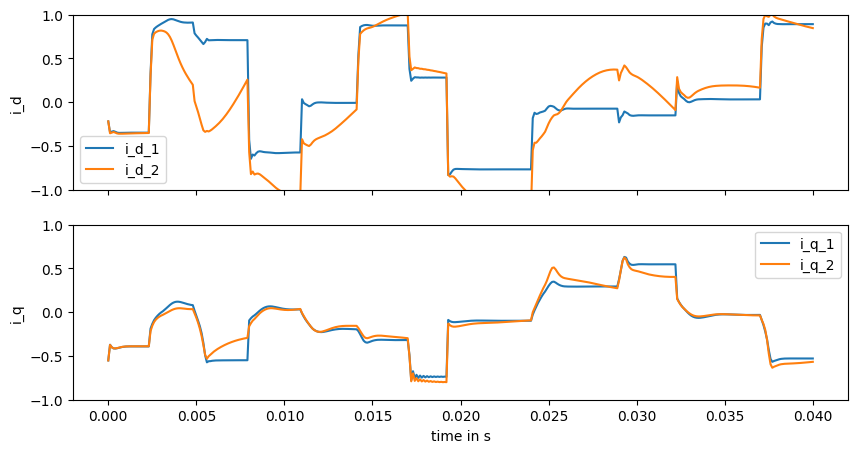

 70%|██████▉   | 209983/300000 [12:15<04:38, 323.76it/s]

Current val_loss: 0.06681328709401488


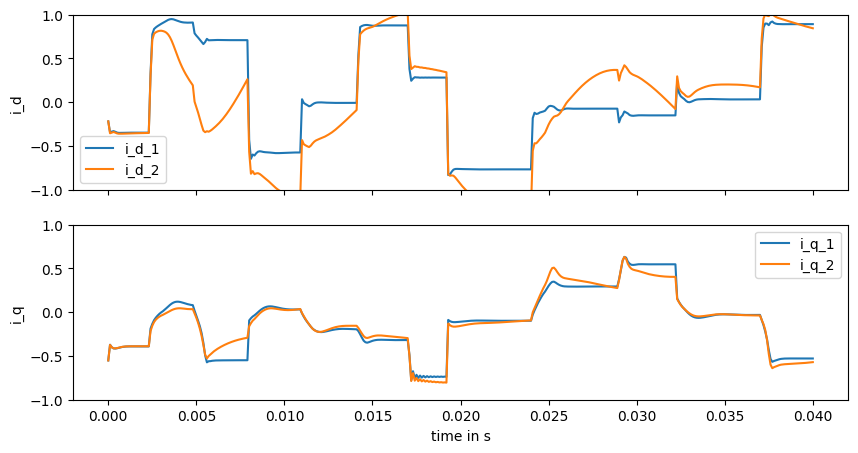

 71%|███████   | 211998/300000 [12:22<04:39, 315.23it/s]

Current val_loss: 0.06905464810530713


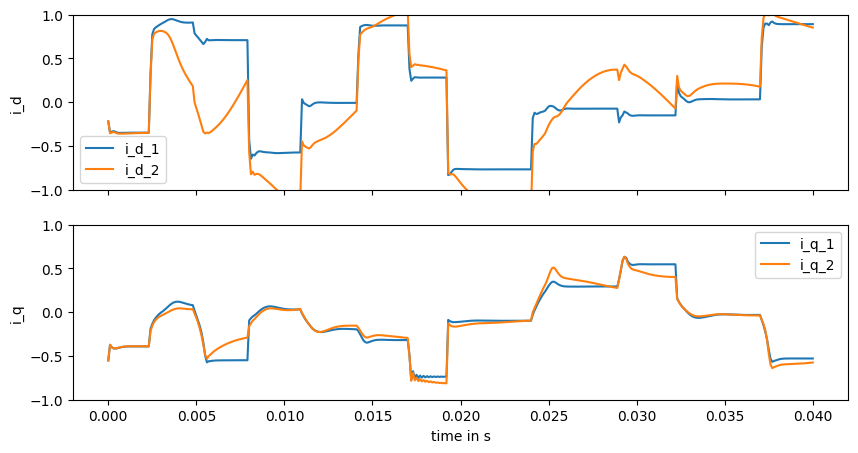

 71%|███████▏  | 213982/300000 [12:29<04:34, 313.30it/s]

Current val_loss: 0.06761176616659059


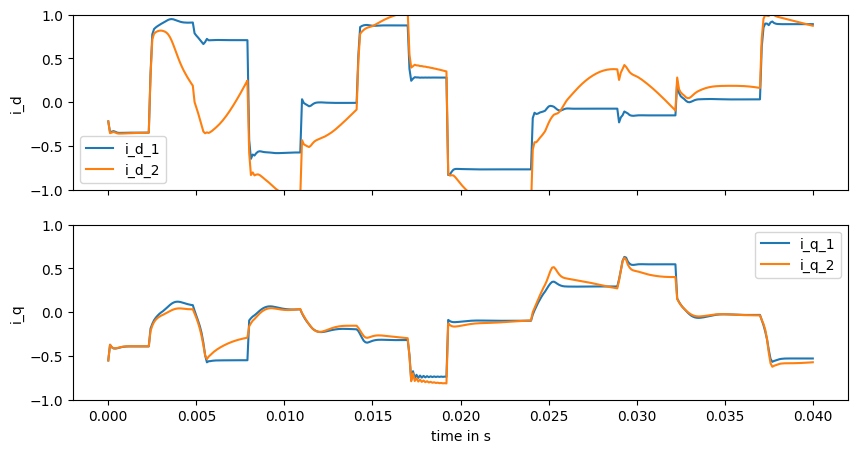

 72%|███████▏  | 215973/300000 [12:36<04:20, 322.09it/s]

Current val_loss: 0.07906819841985313


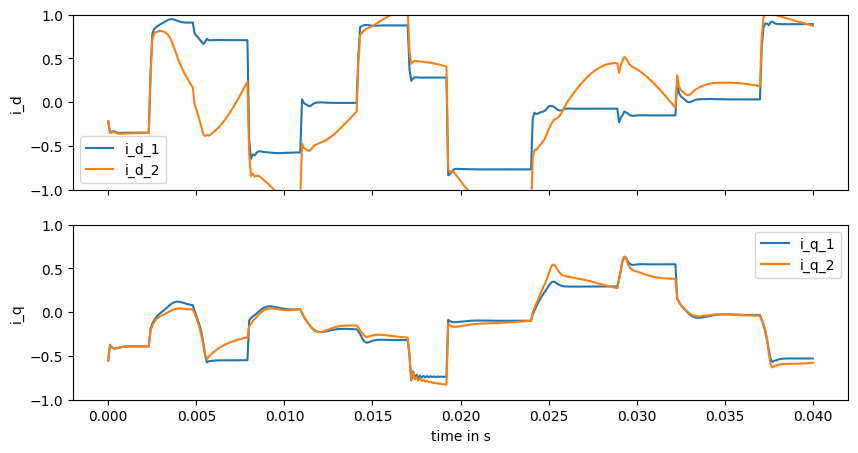

 73%|███████▎  | 217993/300000 [12:43<04:19, 316.58it/s]

Current val_loss: 0.07719501117892771


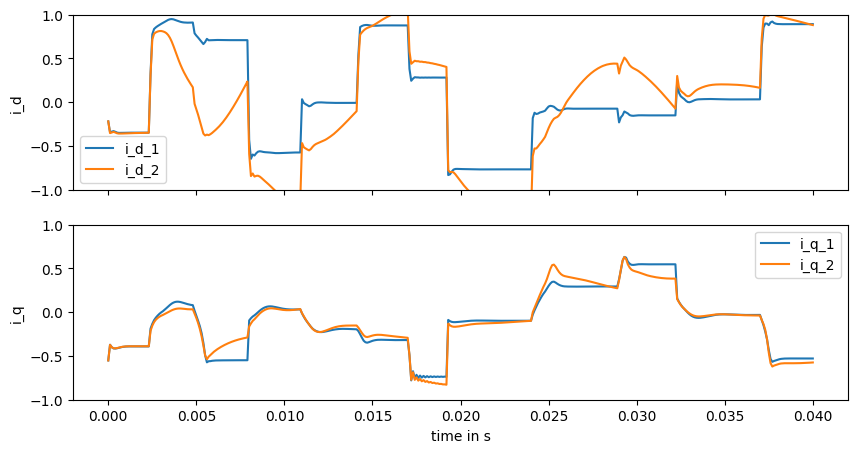

 73%|███████▎  | 219983/300000 [12:50<04:12, 317.36it/s]

Current val_loss: 0.08020606656627861


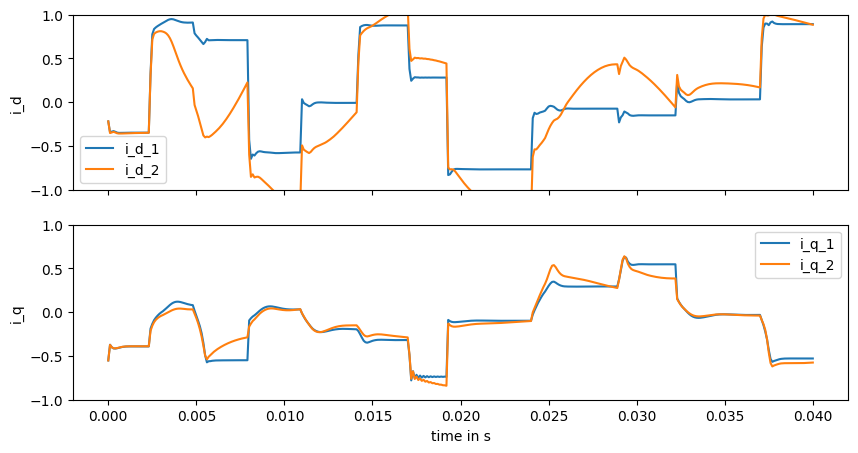

 74%|███████▍  | 222000/300000 [12:57<04:06, 317.05it/s]

Current val_loss: 0.08179775535483676


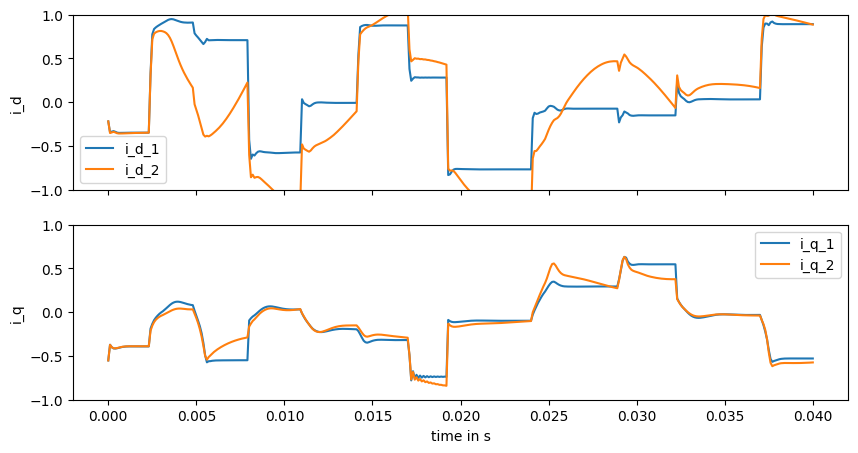

 75%|███████▍  | 223990/300000 [13:04<03:59, 317.73it/s]

Current val_loss: 0.08521023872673698


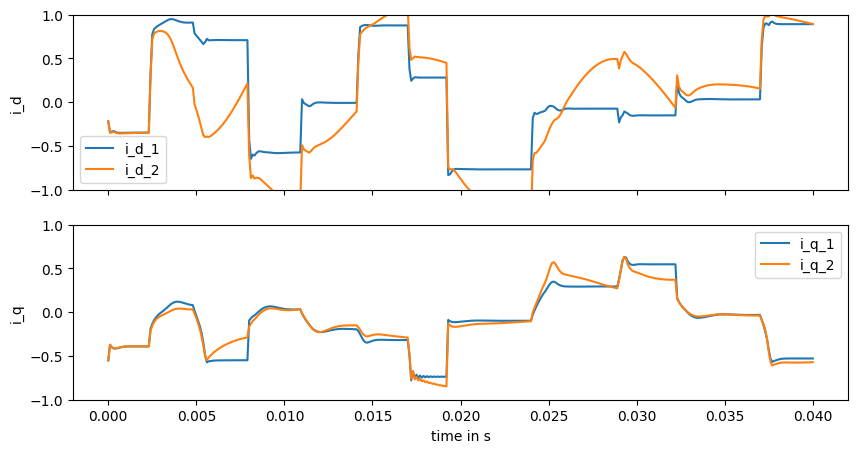

 75%|███████▌  | 225986/300000 [13:11<03:55, 314.71it/s]

Current val_loss: 0.08729512262732192


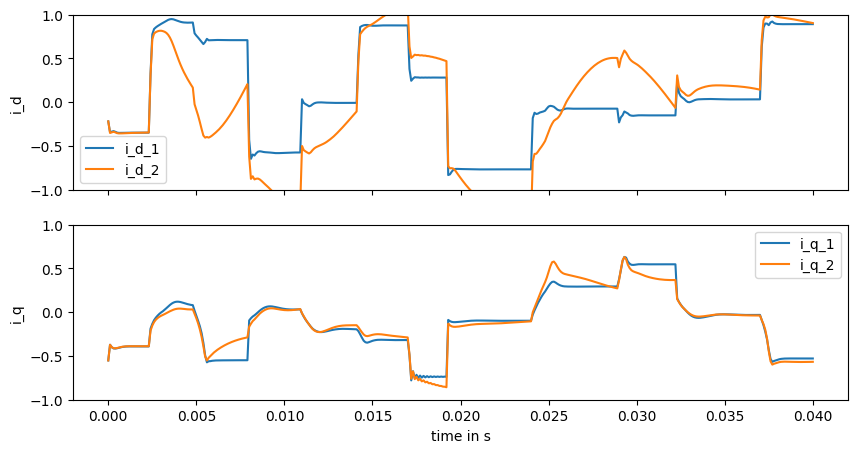

 76%|███████▌  | 227972/300000 [13:18<03:45, 319.41it/s]

Current val_loss: 0.0965700378733751


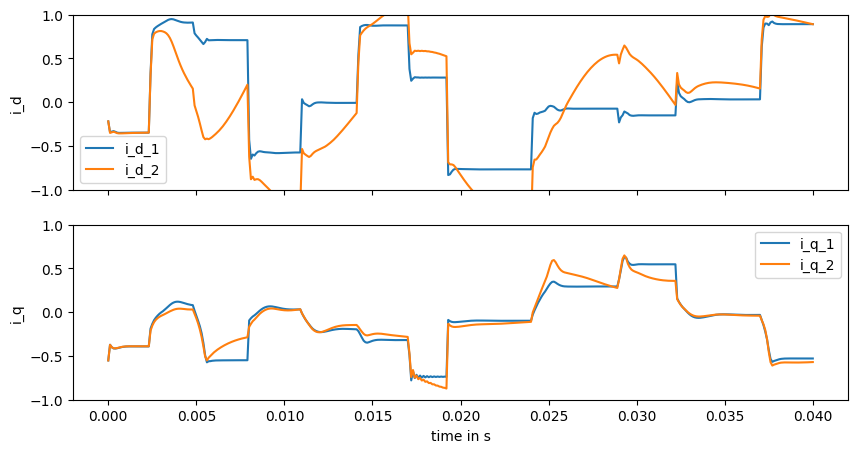

 77%|███████▋  | 230000/300000 [13:25<03:40, 318.14it/s]

Current val_loss: 0.10105893421825729


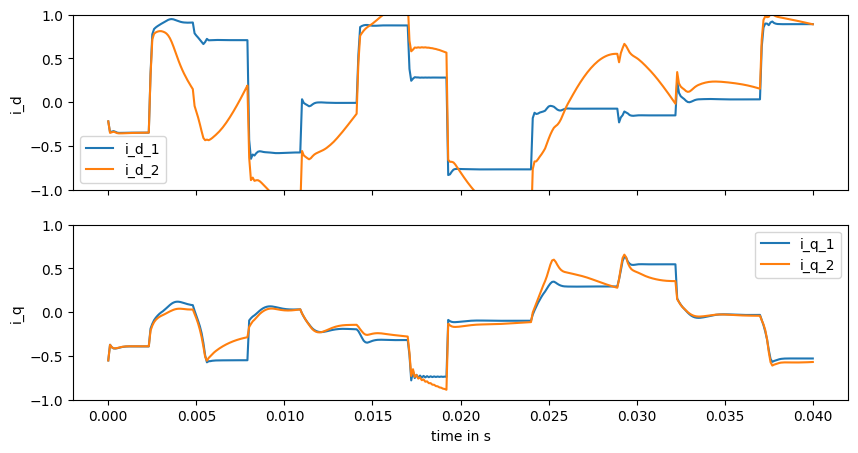

 77%|███████▋  | 231972/300000 [13:32<03:32, 320.65it/s]

Current val_loss: 0.10136762270650315


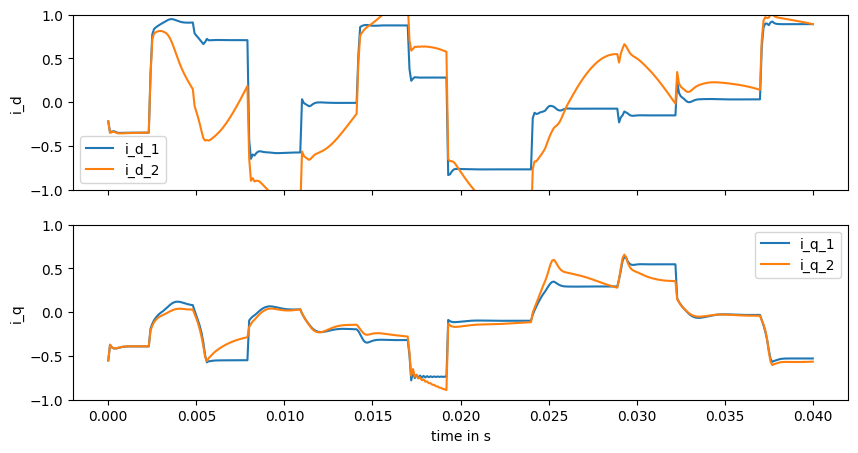

 78%|███████▊  | 233980/300000 [13:39<03:25, 321.61it/s]

Current val_loss: 0.10236199563807523


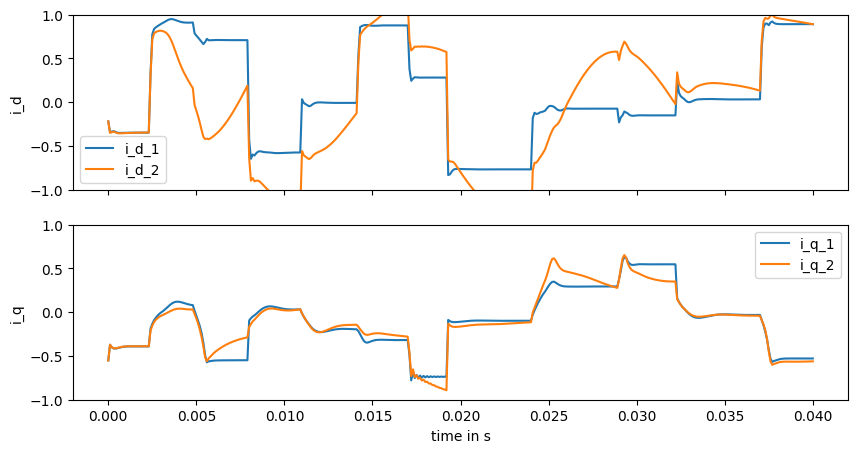

 79%|███████▊  | 235992/300000 [13:46<03:18, 322.57it/s]

Current val_loss: 0.10437671188322262


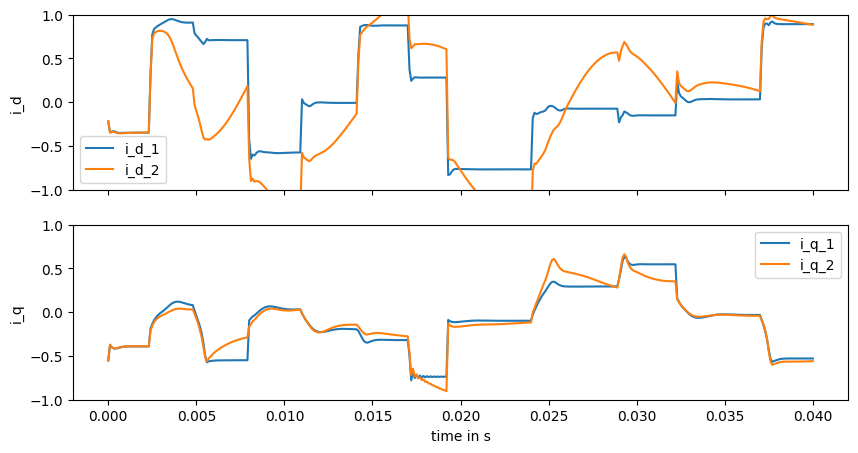

 79%|███████▉  | 237968/300000 [13:53<03:11, 323.28it/s]

Current val_loss: 0.10992738922939771


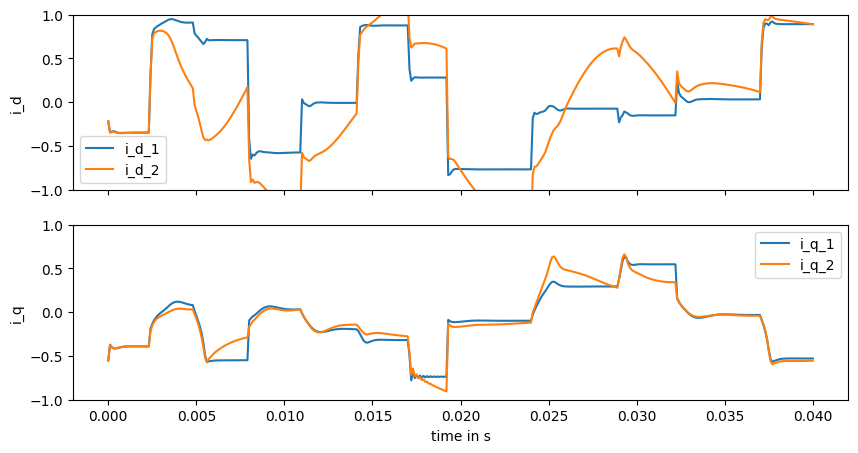

 80%|███████▉  | 239980/300000 [14:00<03:07, 320.09it/s]

Current val_loss: 0.11763396139914464


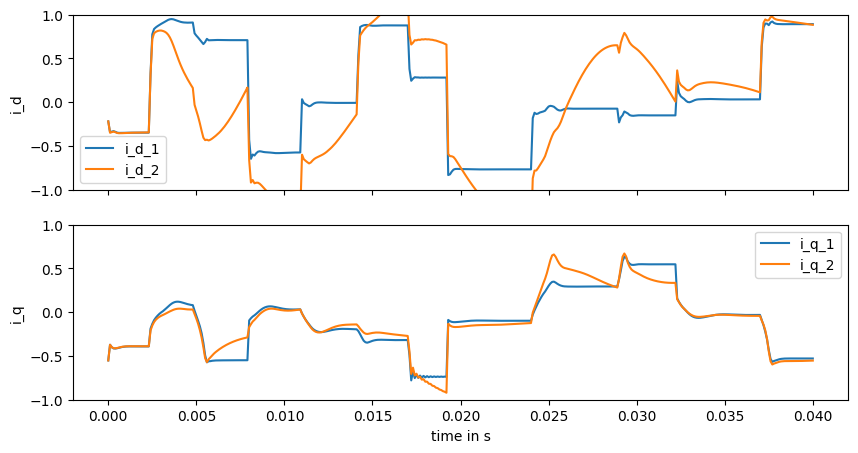

 81%|████████  | 241997/300000 [14:07<03:00, 322.24it/s]

Current val_loss: 0.1190310415851485


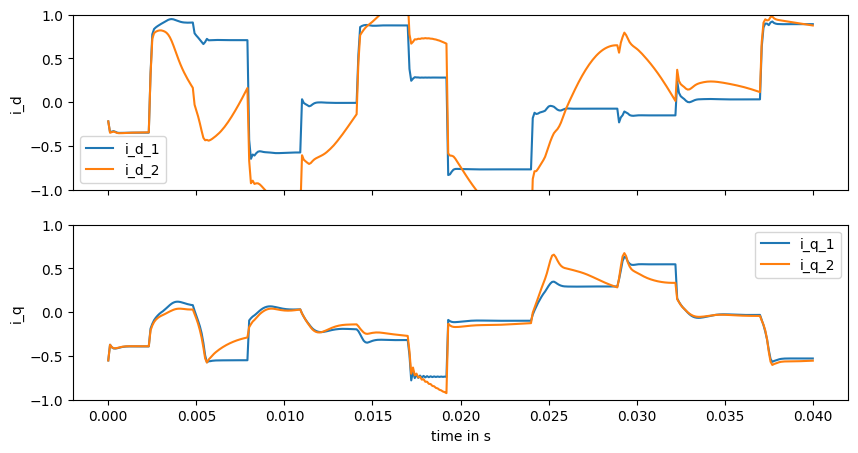

 81%|████████▏ | 243976/300000 [14:14<02:54, 321.01it/s]

Current val_loss: 0.13032277460837993


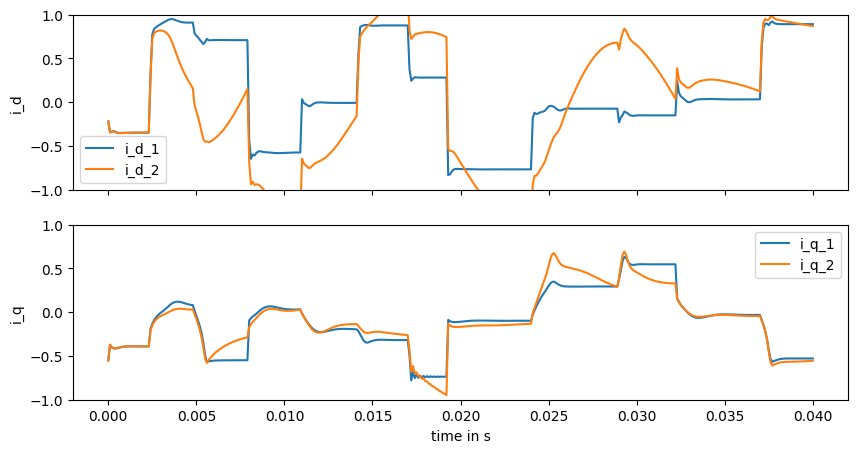

 82%|████████▏ | 245980/300000 [14:21<02:50, 316.14it/s]

Current val_loss: 0.12077132024968003


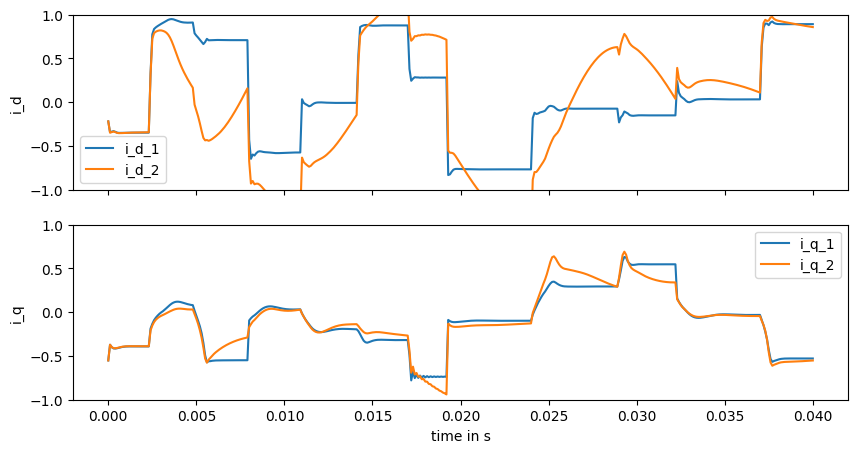

 83%|████████▎ | 247986/300000 [14:28<02:44, 317.08it/s]

Current val_loss: 0.1446550346558407


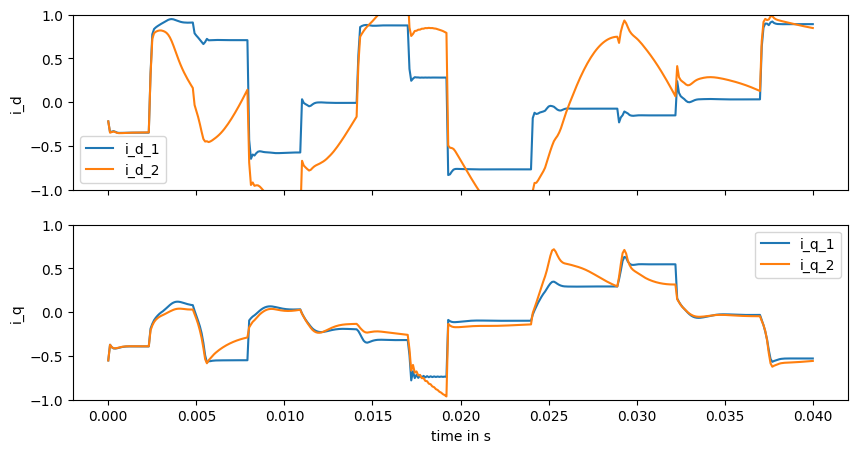

 83%|████████▎ | 249991/300000 [14:35<02:38, 315.32it/s]

Current val_loss: 0.13893612694168803


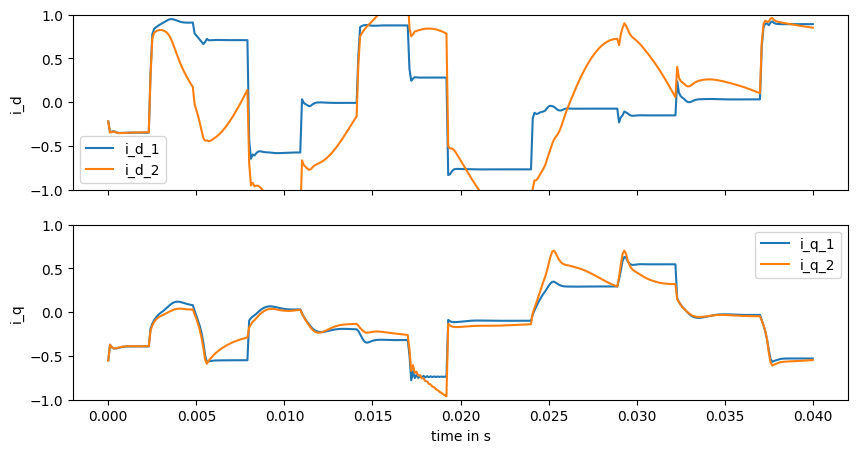

 84%|████████▍ | 251974/300000 [14:41<02:28, 322.71it/s]

Current val_loss: 0.1392299517693838


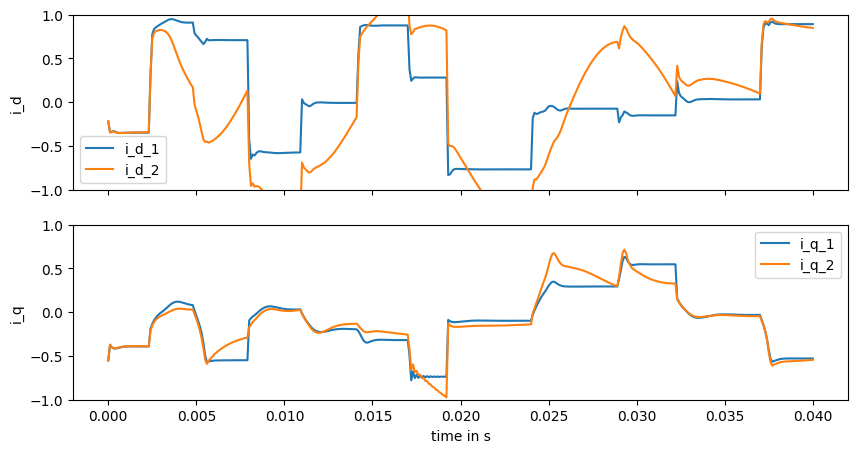

 85%|████████▍ | 253986/300000 [14:48<02:21, 324.48it/s]

Current val_loss: 0.1537955792838717


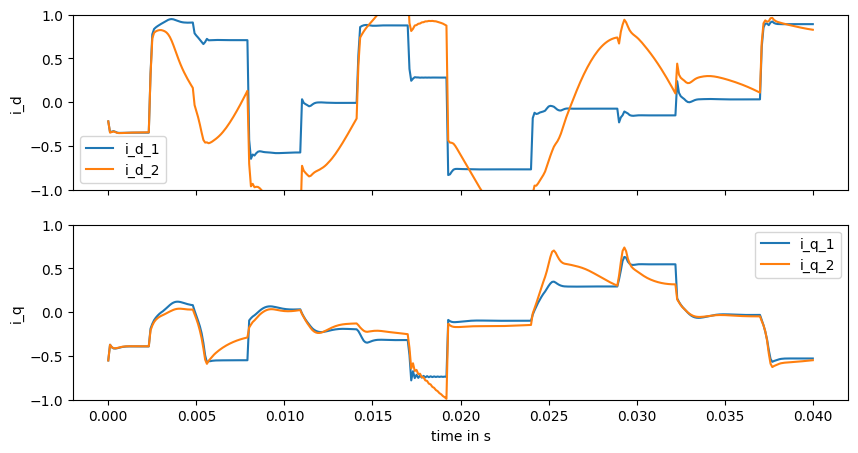

 85%|████████▌ | 255976/300000 [14:55<02:21, 311.18it/s]

Current val_loss: 0.1524058987121387


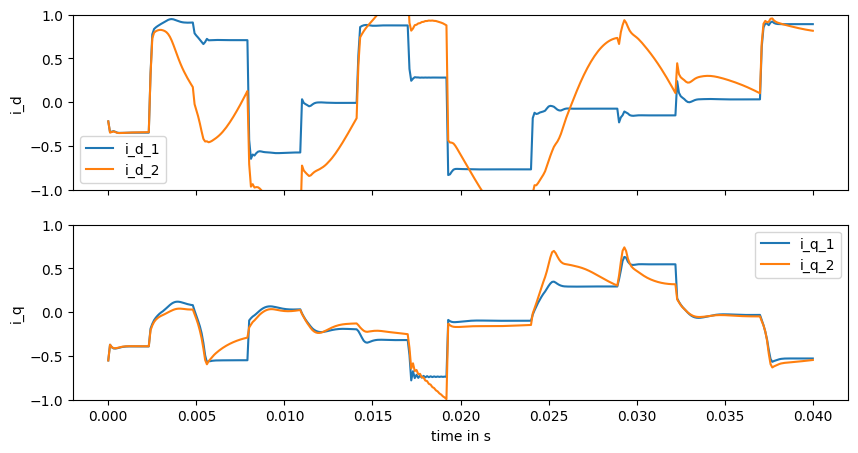

 86%|████████▌ | 257988/300000 [15:02<02:10, 322.07it/s]

Current val_loss: 0.17808380717204186


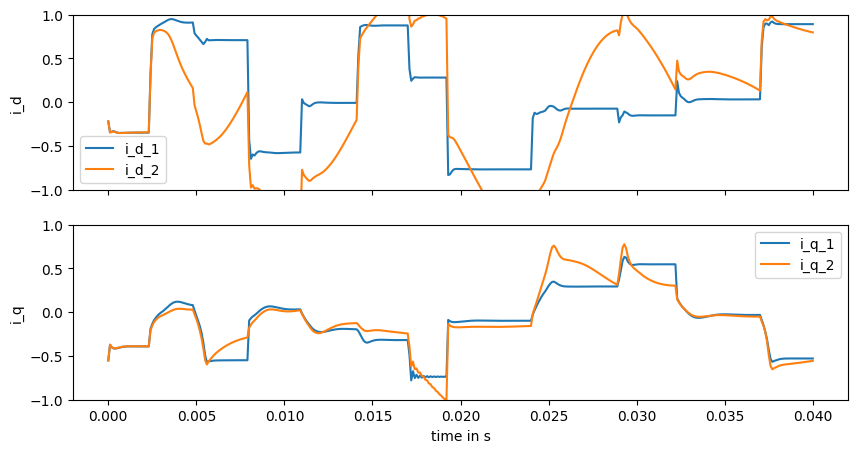

 87%|████████▋ | 259972/300000 [15:09<02:09, 308.29it/s]

Current val_loss: 0.17086025771445387


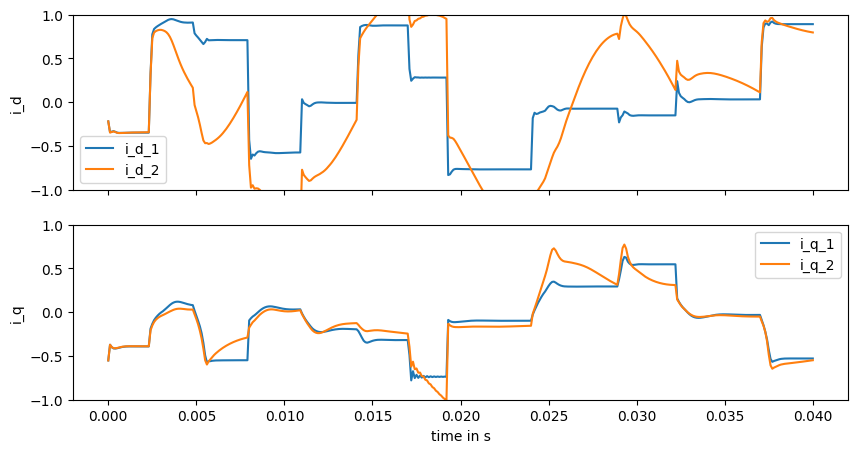

 87%|████████▋ | 261980/300000 [15:16<01:58, 321.82it/s]

Current val_loss: 0.179034180987965


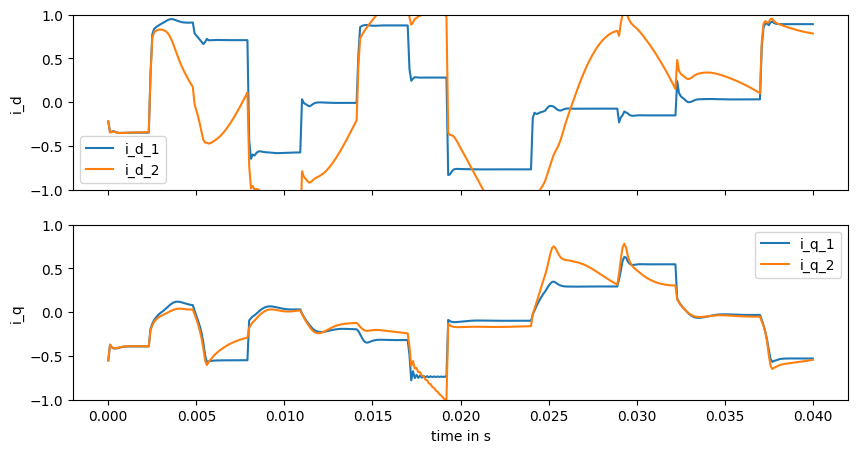

 88%|████████▊ | 263991/300000 [15:23<01:52, 319.77it/s]

Current val_loss: 0.17635277268528665


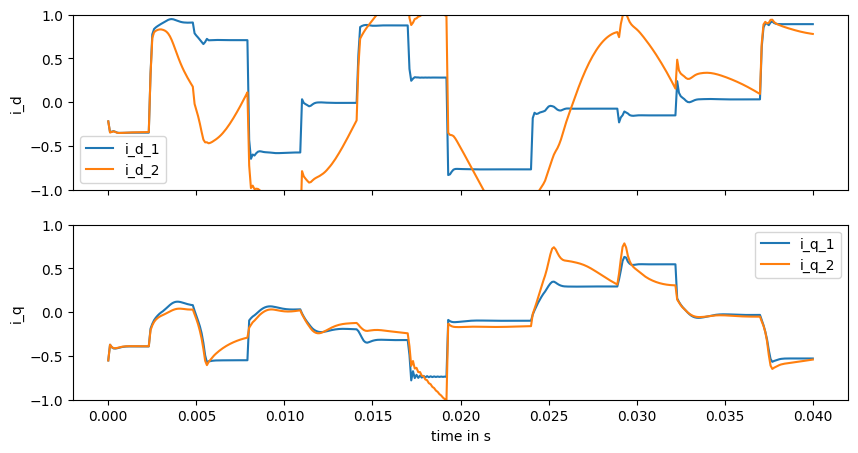

 89%|████████▊ | 265978/300000 [15:32<01:47, 317.54it/s]

Current val_loss: 0.17927735593473443


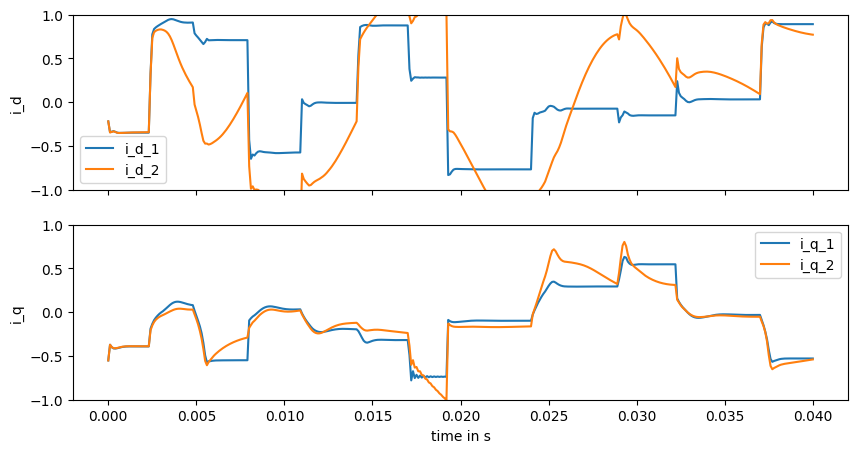

 89%|████████▉ | 267981/300000 [15:38<01:39, 321.44it/s]

Current val_loss: 0.17692652723840596


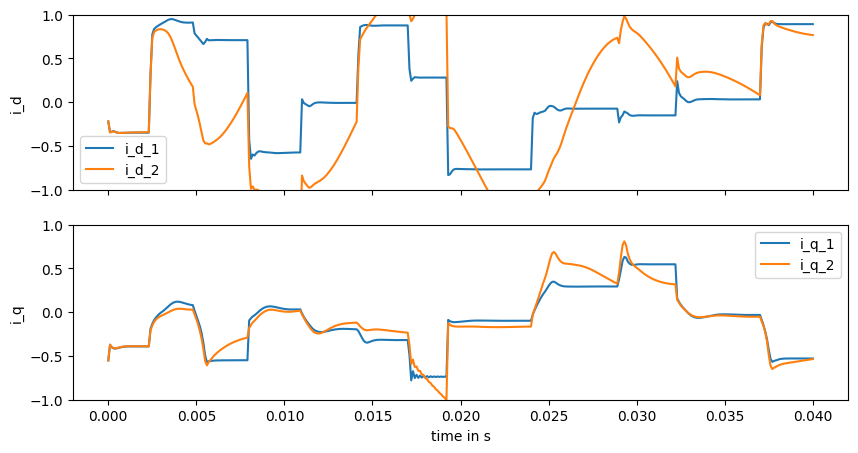

 90%|████████▉ | 269990/300000 [15:45<01:33, 322.10it/s]

Current val_loss: 0.17075425221229895


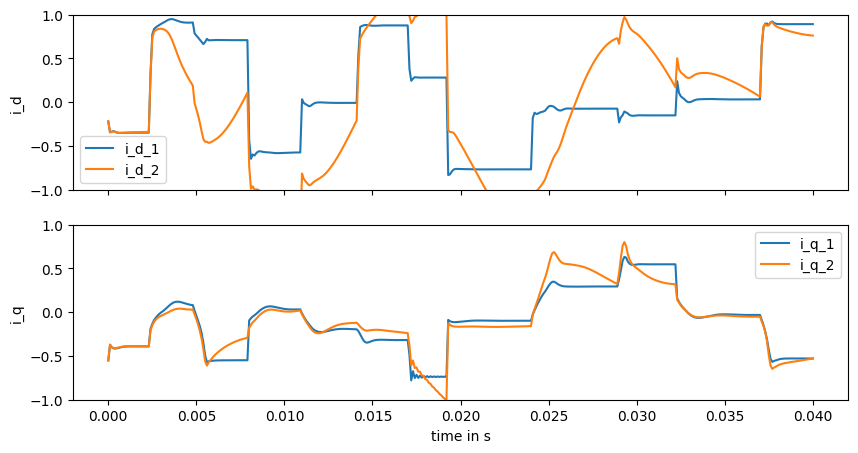

 91%|█████████ | 271999/300000 [15:52<01:27, 321.62it/s]

Current val_loss: 0.1697489949079303


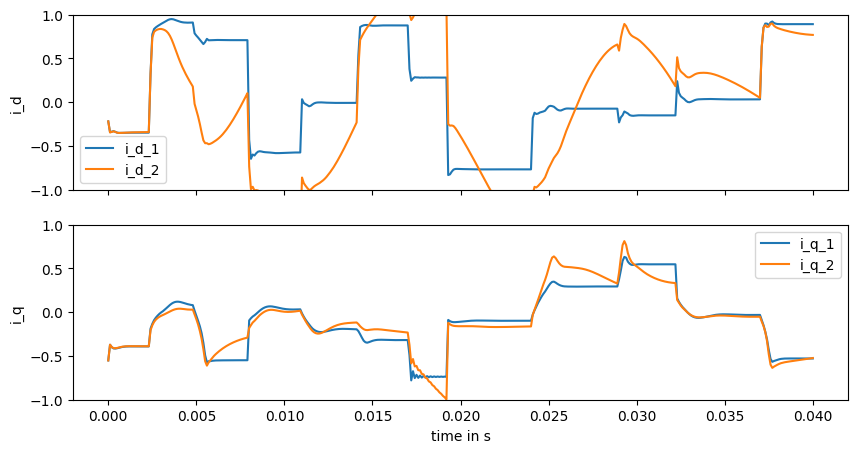

 91%|█████████▏| 273996/300000 [15:59<01:21, 320.88it/s]

Current val_loss: 0.16814998245921983


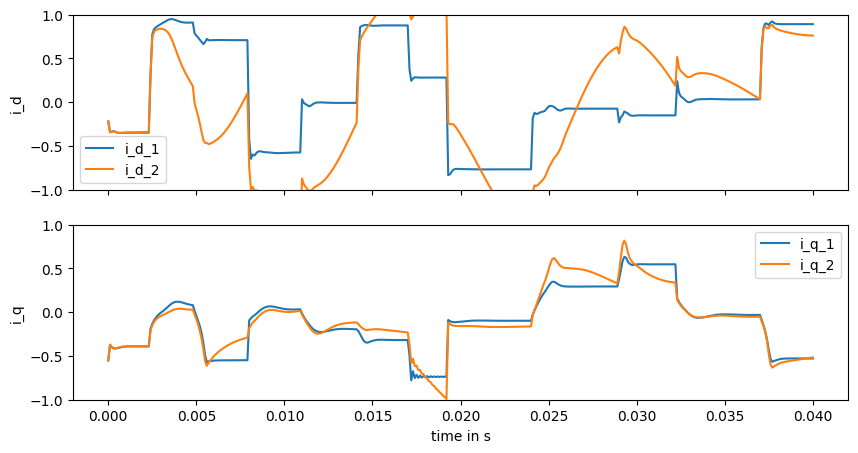

 92%|█████████▏| 275997/300000 [16:06<01:15, 316.60it/s]

Current val_loss: 0.16581442859743709


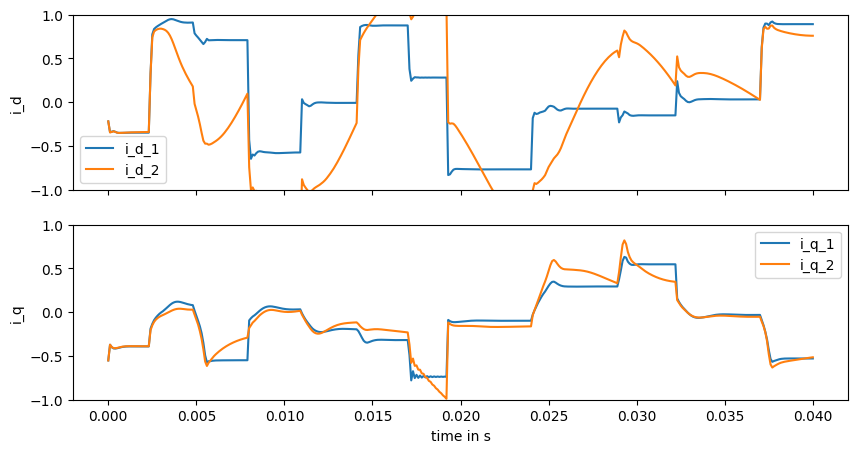

 93%|█████████▎| 277989/300000 [16:13<01:08, 319.29it/s]

Current val_loss: 0.16583729386636298


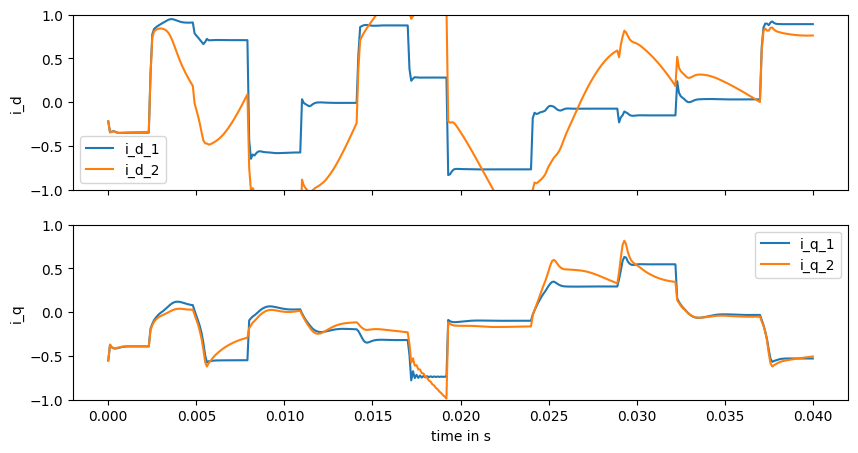

 93%|█████████▎| 279997/300000 [16:20<01:05, 307.65it/s]

Current val_loss: 0.16697754980469048


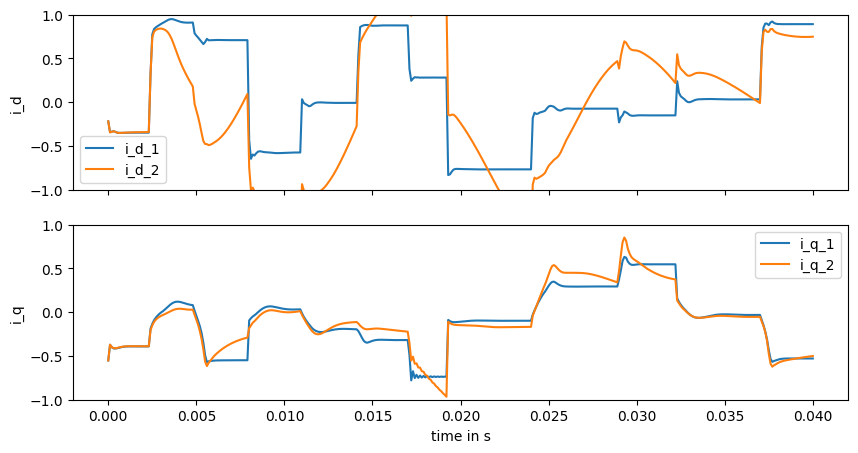

 94%|█████████▍| 281988/300000 [16:27<00:58, 309.15it/s]

Current val_loss: 0.16709792998710268


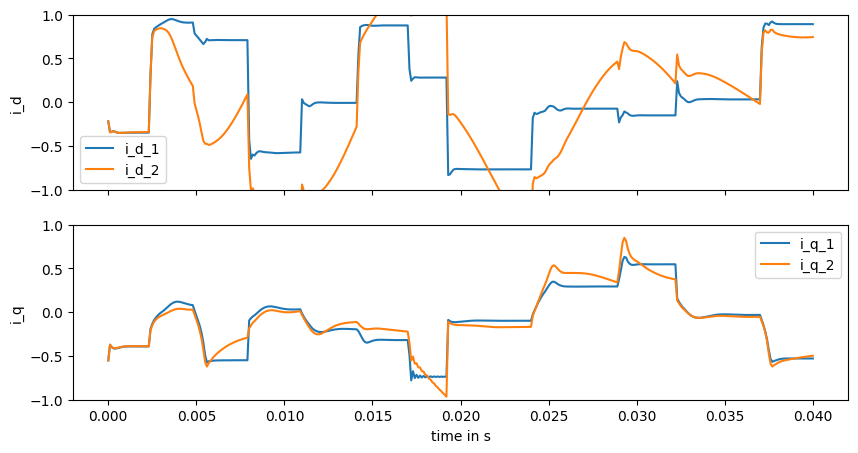

 95%|█████████▍| 283981/300000 [16:34<00:50, 320.05it/s]

Current val_loss: 0.16898660360333942


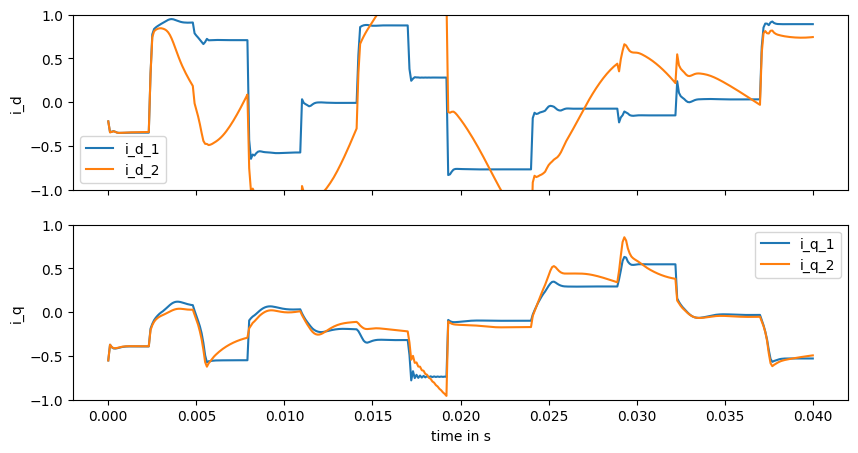

 95%|█████████▌| 285990/300000 [16:41<00:43, 320.66it/s]

Current val_loss: 0.17014501359855227


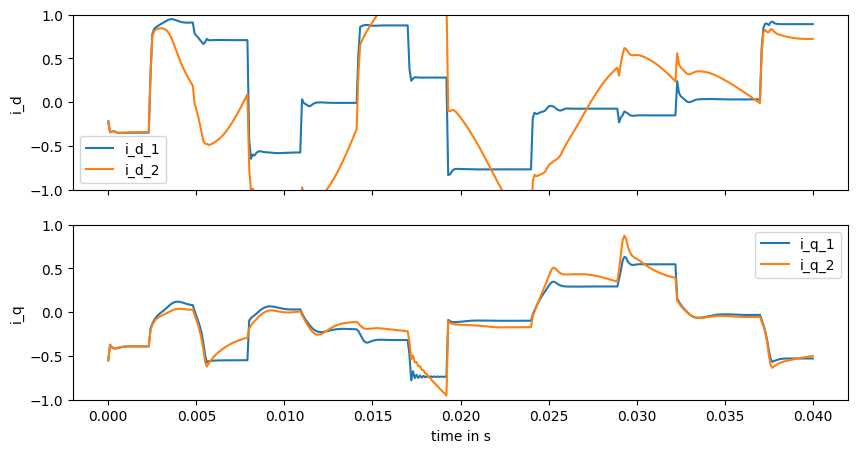

 96%|█████████▌| 287968/300000 [16:48<00:37, 317.66it/s]

Current val_loss: 0.1768445893292861


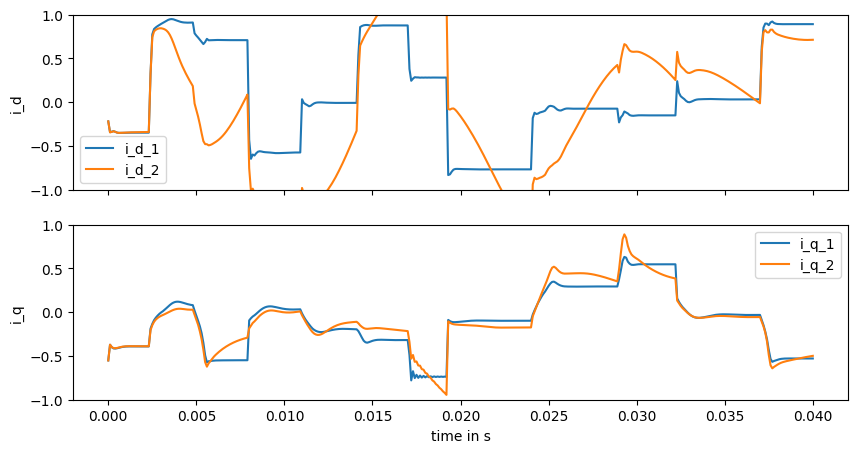

 97%|█████████▋| 289977/300000 [16:55<00:31, 314.59it/s]

Current val_loss: 0.1749301622626465


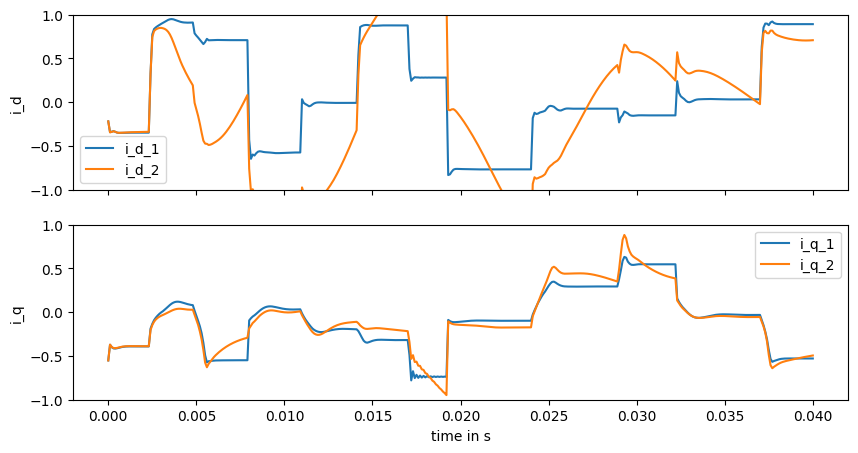

 97%|█████████▋| 291974/300000 [17:02<00:25, 320.07it/s]

Current val_loss: 0.17461937446097284


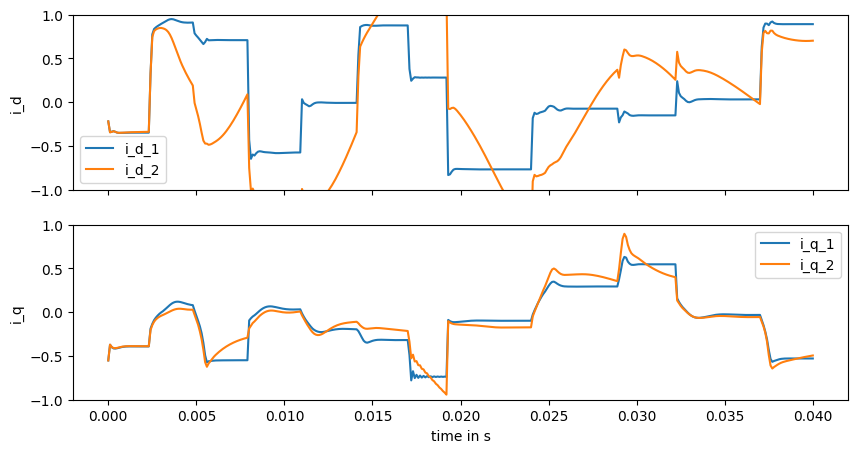

 98%|█████████▊| 293998/300000 [17:09<00:19, 307.66it/s]

Current val_loss: 0.18156440420648606


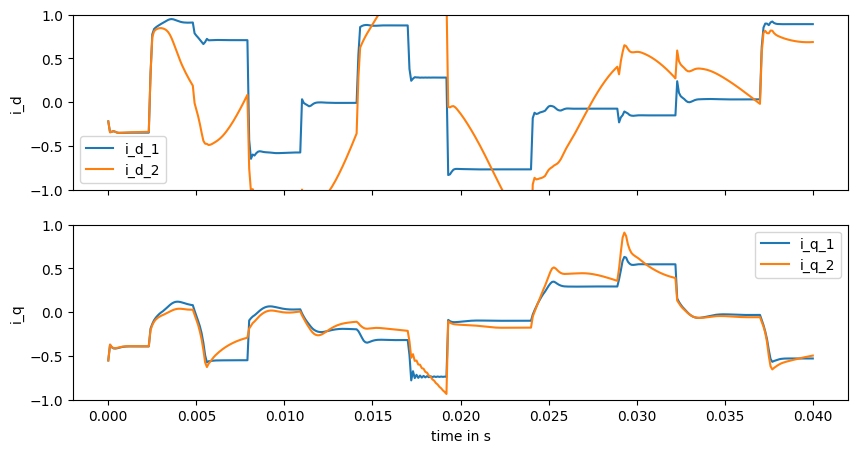

 99%|█████████▊| 296000/300000 [17:16<00:12, 317.61it/s]

Current val_loss: 0.1901979030964378


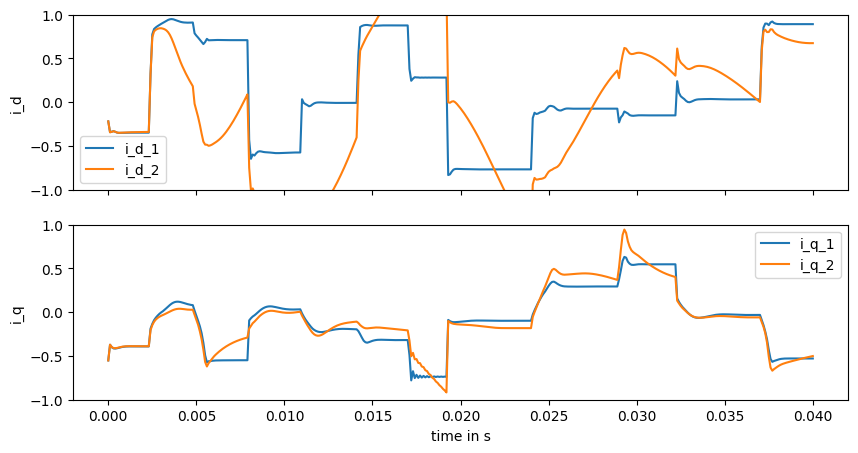

 99%|█████████▉| 297991/300000 [17:23<00:06, 320.58it/s]

Current val_loss: 0.17936491213242586


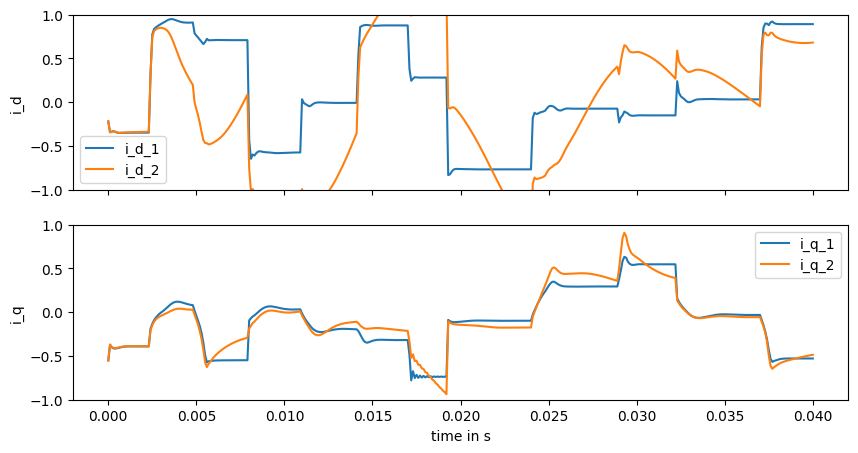

100%|██████████| 300000/300000 [17:30<00:00, 285.61it/s]


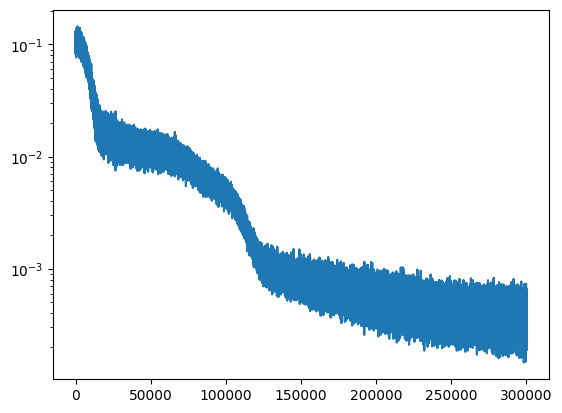

In [35]:
fin_node_dpc,fin_opt_state,fin_keys,losses, val_losses=mtrainer.fit_non_jit(node,opt_state,keys,plot_every=2000)
plt.plot(losses)
plt.yscale('log')

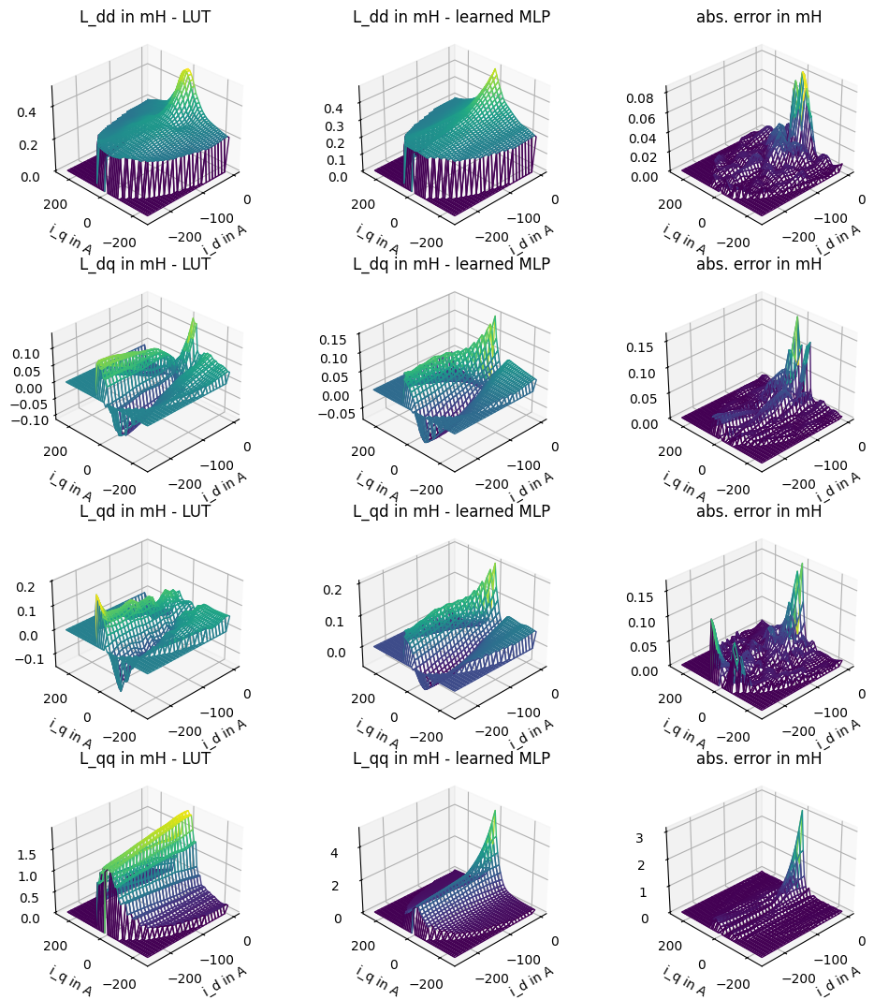

In [36]:
eval_L(fin_node_dpc)